In [3]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
import fastf1 as ff1

# FORMULA 1 ROLEX AUSTRALIAN GRAND PRIX 2024
The Australian Grand Prix is an annual motor racing event which is under contract to host Formula One until 2035.[1] One of the oldest surviving motorsport competitions held in Australia, the Grand Prix has moved frequently with 23 different venues having been used since it was first run at Phillip Island in 1928. The race became part of the Formula One World Championship in 1985. Since 1996, it has been held at the Albert Park Circuit in Melbourne, with the exceptions of 2020 and 2021, when the races were cancelled due to the COVID-19 pandemic.[2] Before that, it was held in Adelaide.[3] Source: Wikipedia

Analyzed by Franccy del Piero Sambrano Ganoza

## Obtain session information

In [4]:
libraryDataF1.obtain_information('sessions',year=2024,country_acronym='AUS')

,session_key,session_name,date_start,date_end,gmt_offset,session_type,meeting_key,location,country_key,country_code,country_name,circuit_key,circuit_short_name,year
0,9481,Practice 1,2024-03-22T01:30:00+00:00,2024-03-22T02:30:00+00:00,11:00:00,Practice,1231,Melbourne,5,AUS,Australia,10,Melbourne,2024
1,9482,Practice 2,2024-03-22T05:00:00+00:00,2024-03-22T06:00:00+00:00,11:00:00,Practice,1231,Melbourne,5,AUS,Australia,10,Melbourne,2024
2,9483,Practice 3,2024-03-23T01:30:00+00:00,2024-03-23T02:30:00+00:00,11:00:00,Practice,1231,Melbourne,5,AUS,Australia,10,Melbourne,2024
3,9484,Qualifying,2024-03-23T05:00:00+00:00,2024-03-23T06:00:00+00:00,11:00:00,Qualifying,1231,Melbourne,5,AUS,Australia,10,Melbourne,2024
4,9488,Race,2024-03-24T04:00:00+00:00,2024-03-24T06:00:00+00:00,11:00:00,Race,1231,Melbourne,5,AUS,Australia,10,Melbourne,2024


## Free Practice 1
### Obtain setup

In [5]:
practice = libraryDataF1.obtain_information('laps',session_key=9481)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9481)
drivers = libraryDataF1.obtain_information('drivers',session_key=9481)

In [6]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

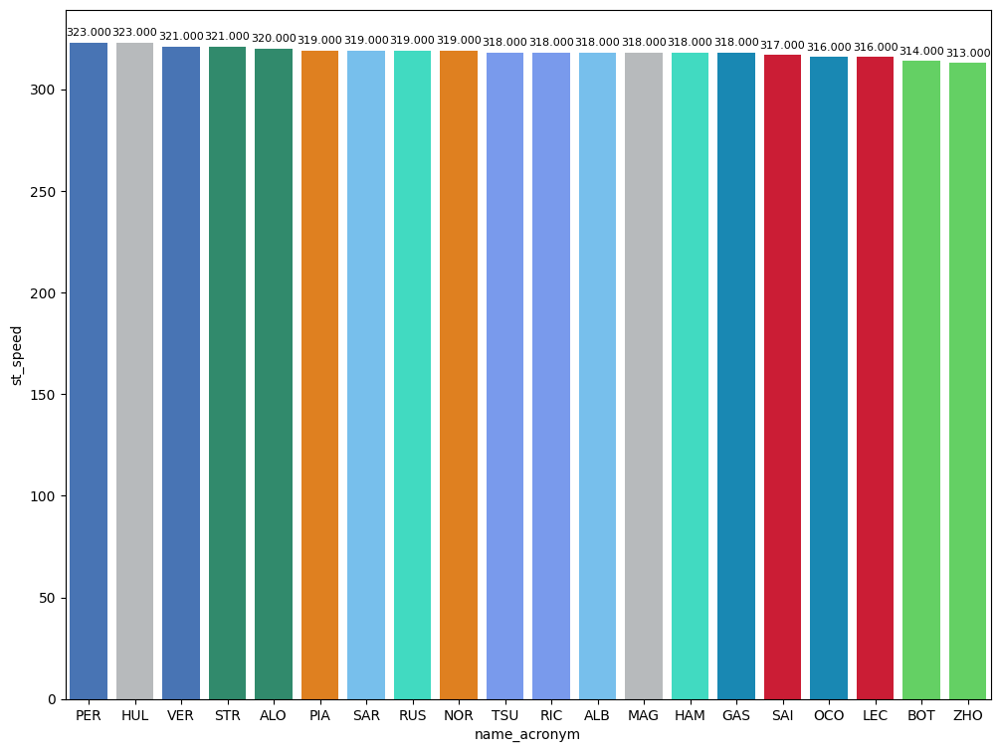

In [7]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

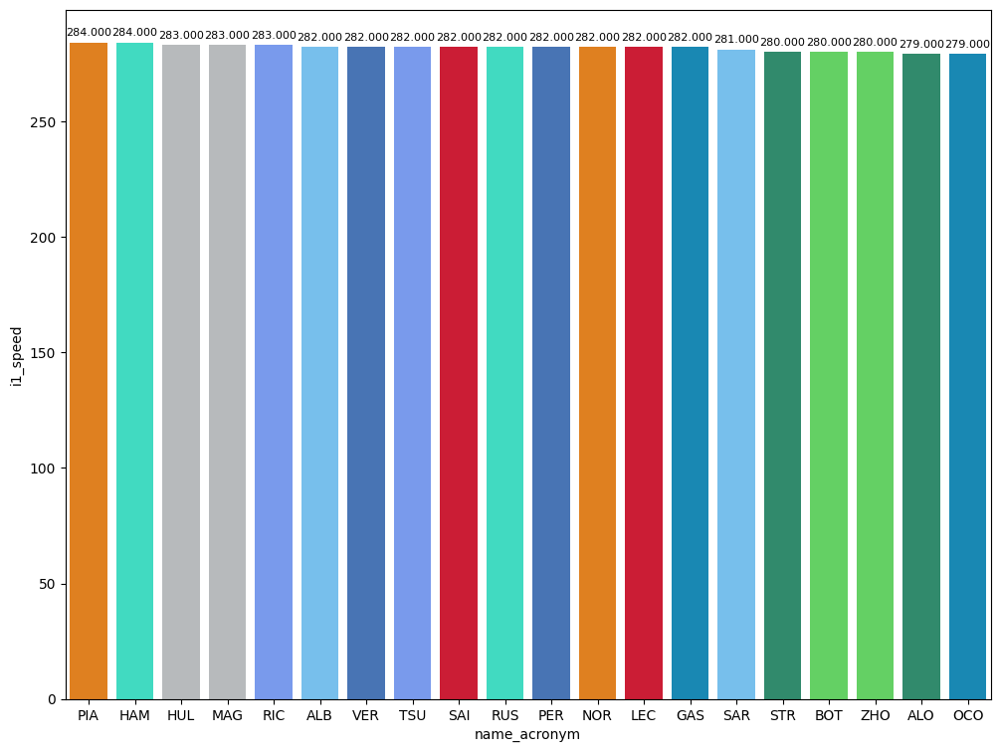

In [8]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

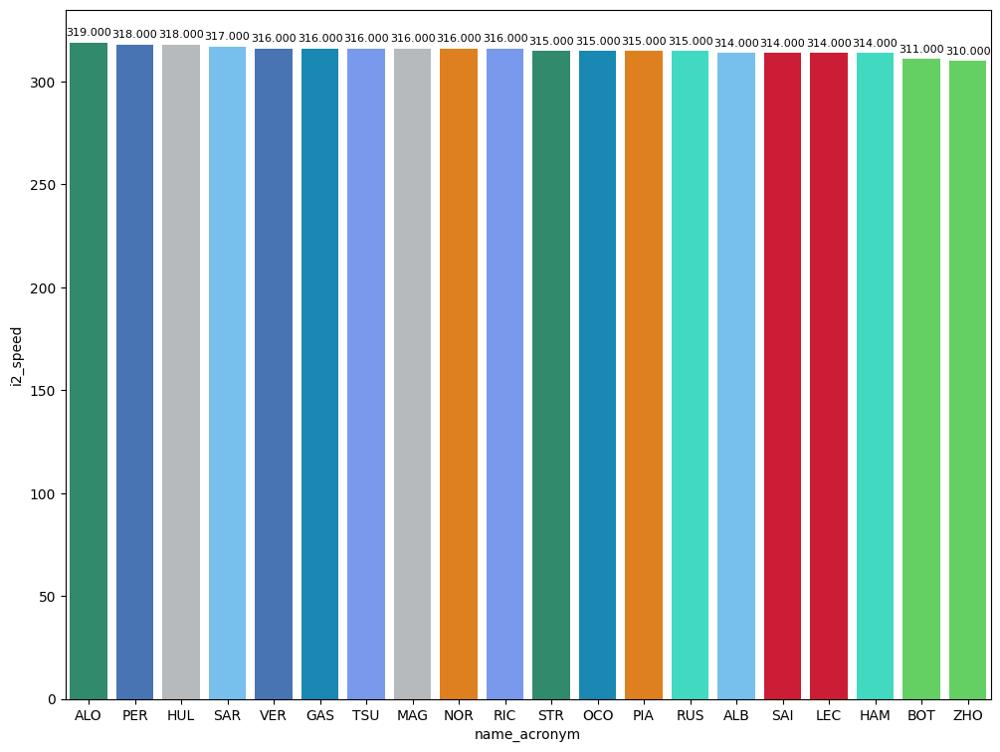

In [9]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [10]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
161,Yuki TSUNODA,MEDIUM,27.432,17.945,33.683,79.060
195,Lando NORRIS,SOFT,27.116,17.930,33.518,78.564


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [11]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


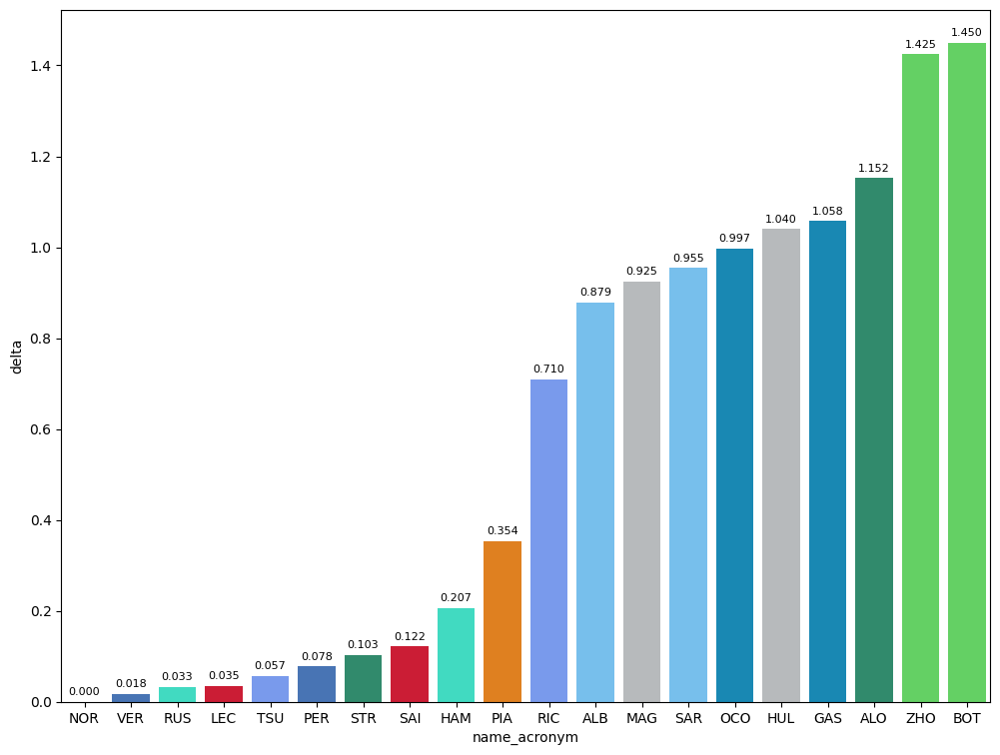

In [12]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

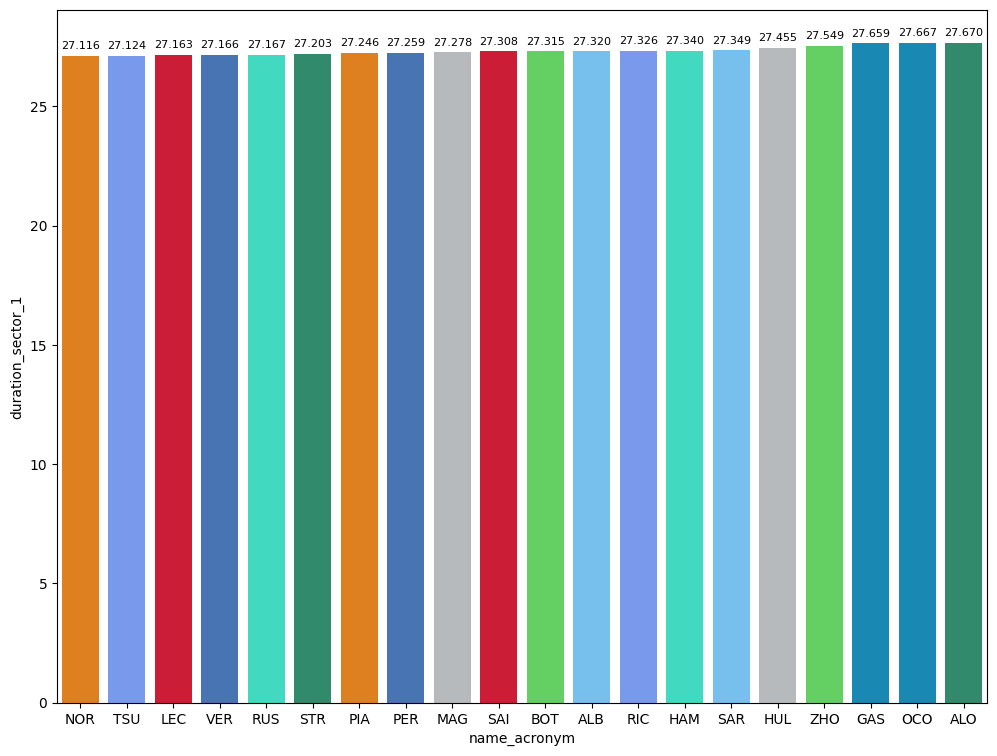

In [13]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

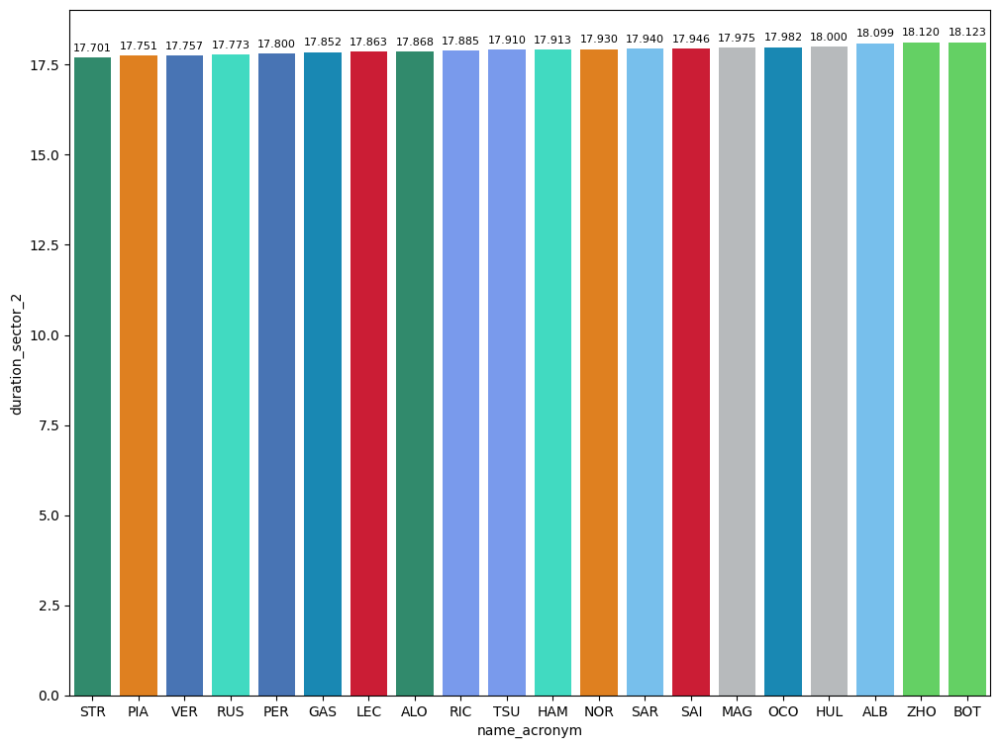

In [14]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

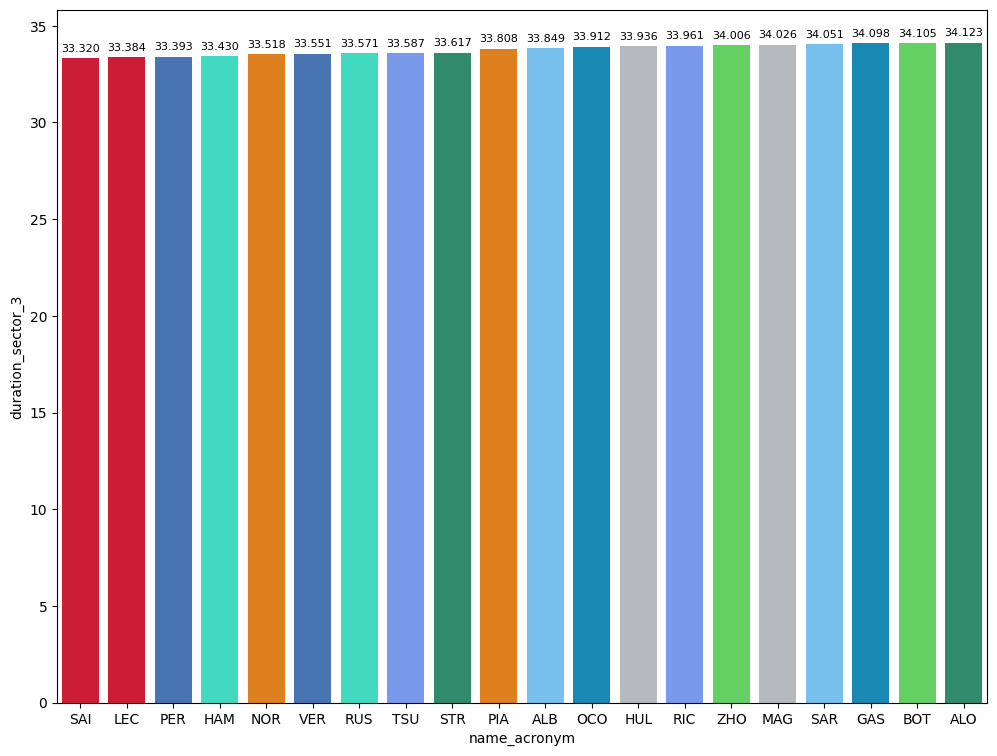

In [15]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [16]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 90").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,80.353846
MEDIUM,82.227321


## Free Practice 2
### Obtain setup

In [17]:
practice = libraryDataF1.obtain_information('laps',session_key=9482)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9482)
drivers = libraryDataF1.obtain_information('drivers',session_key=9482)

In [18]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

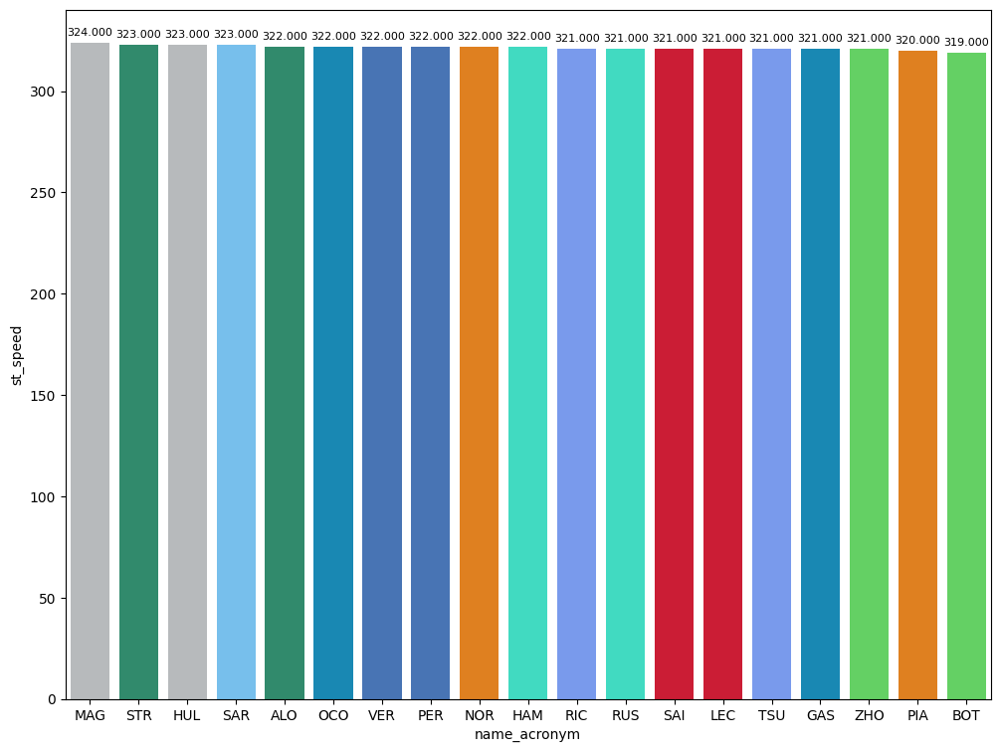

In [19]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

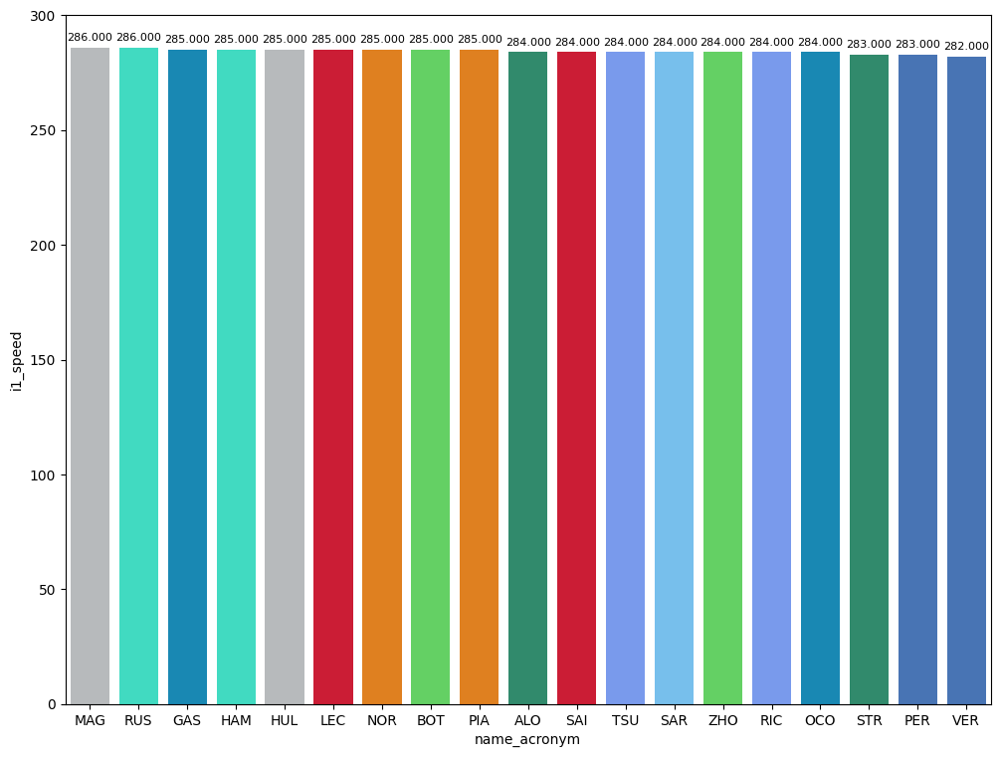

In [20]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

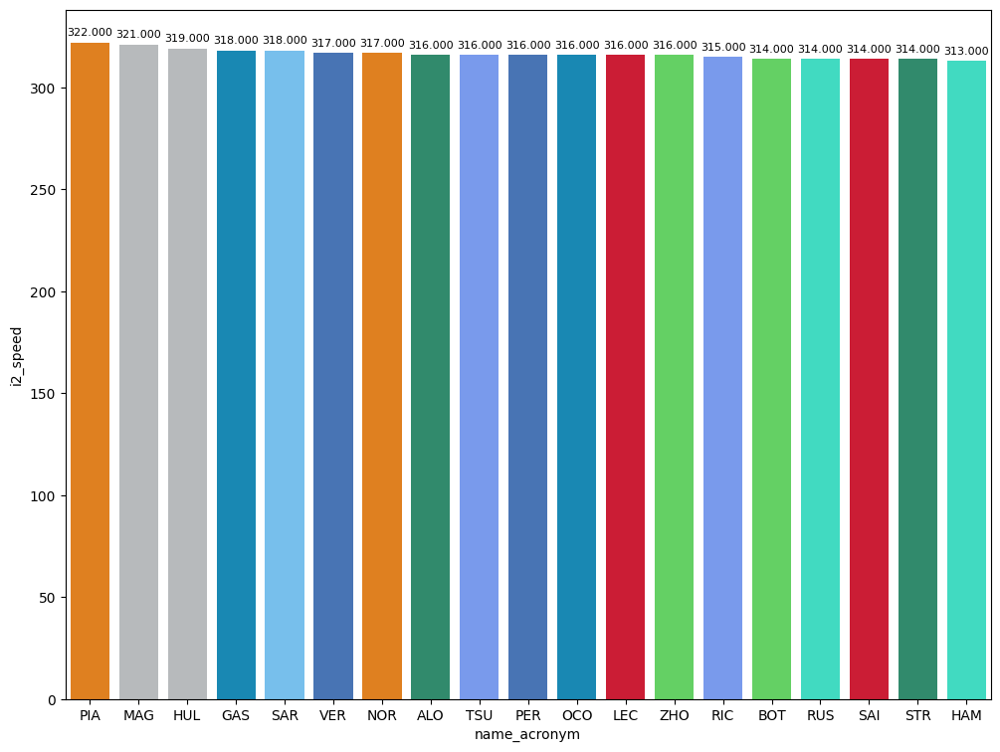

In [21]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [22]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
133,Charles LECLERC,MEDIUM,27.143,17.660,33.133,77.936
252,Charles LECLERC,SOFT,26.687,17.601,32.989,77.277


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [23]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


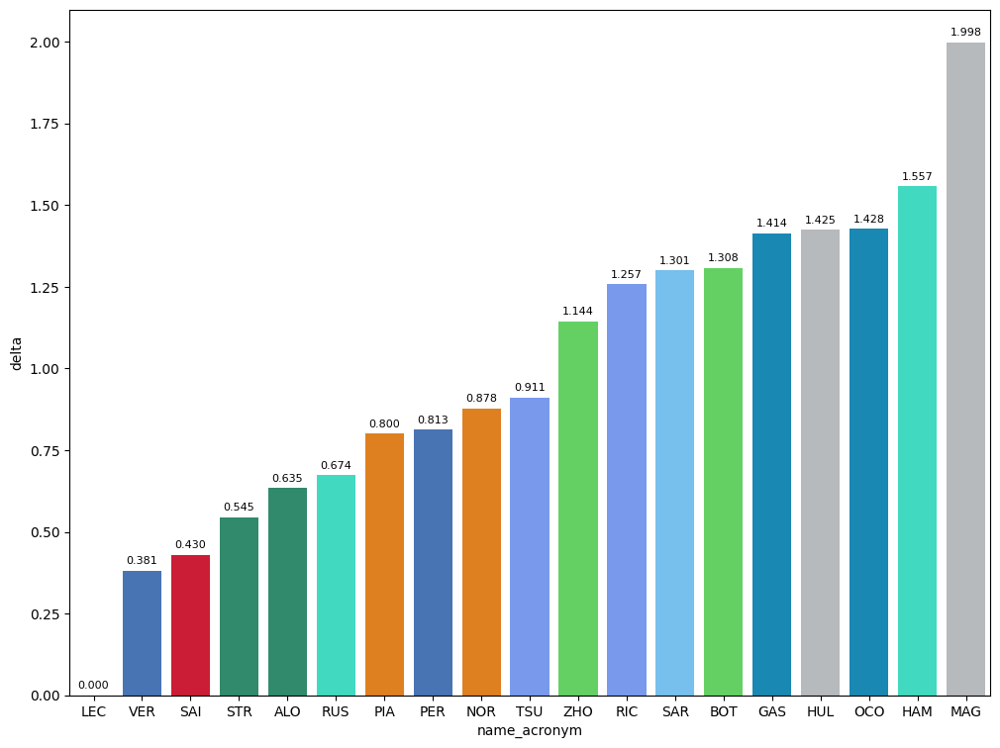

In [24]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

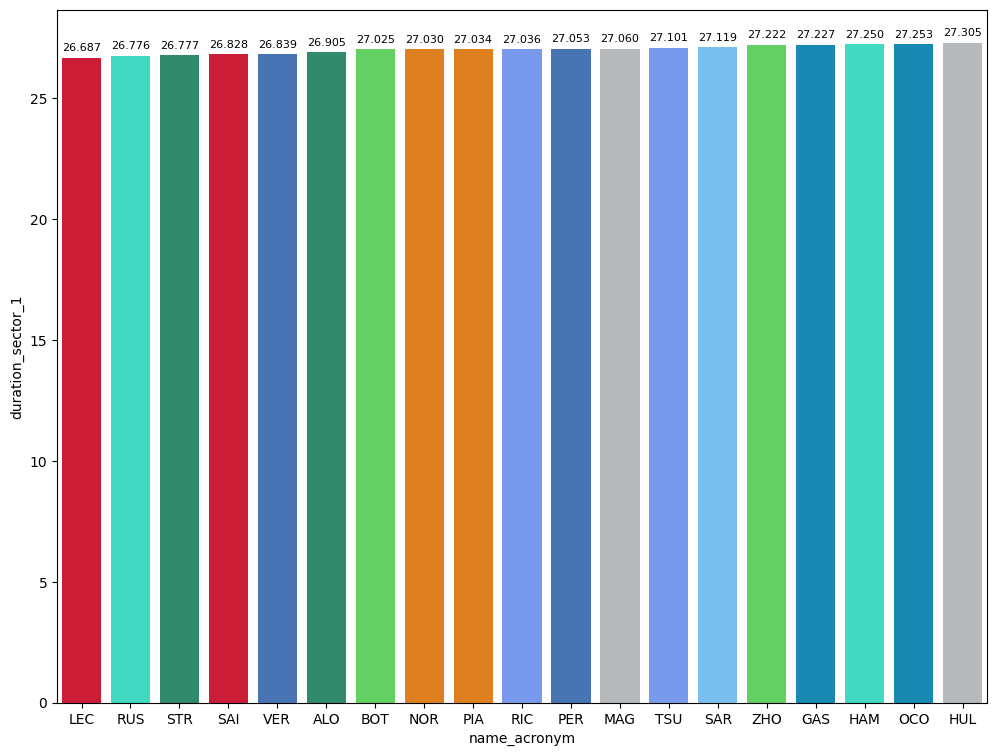

In [25]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

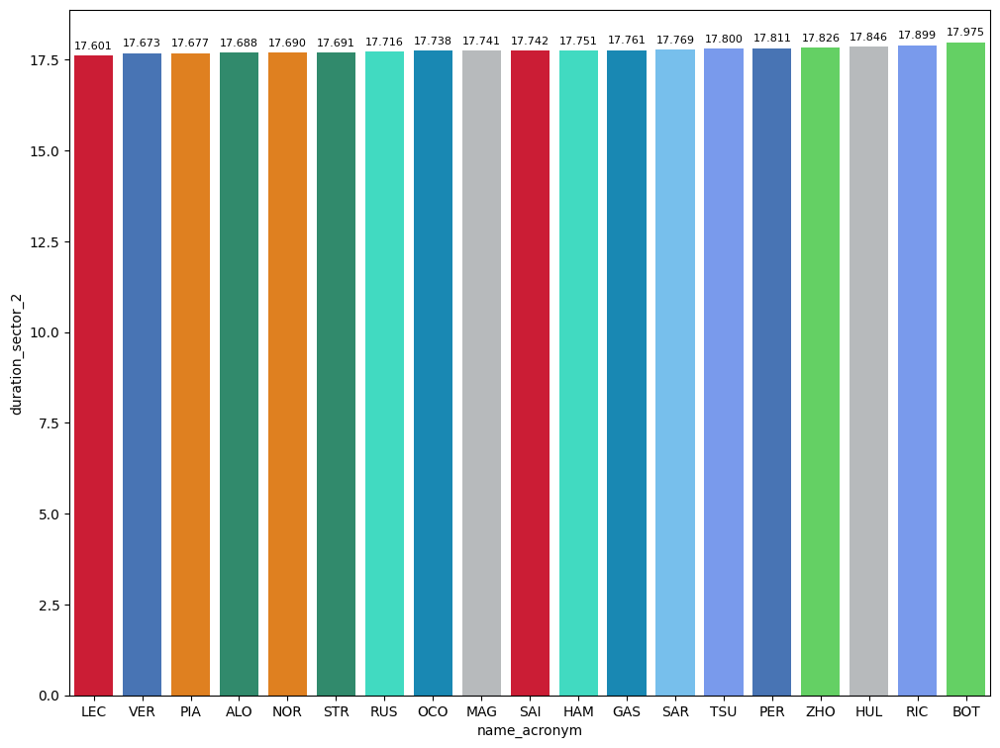

In [26]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

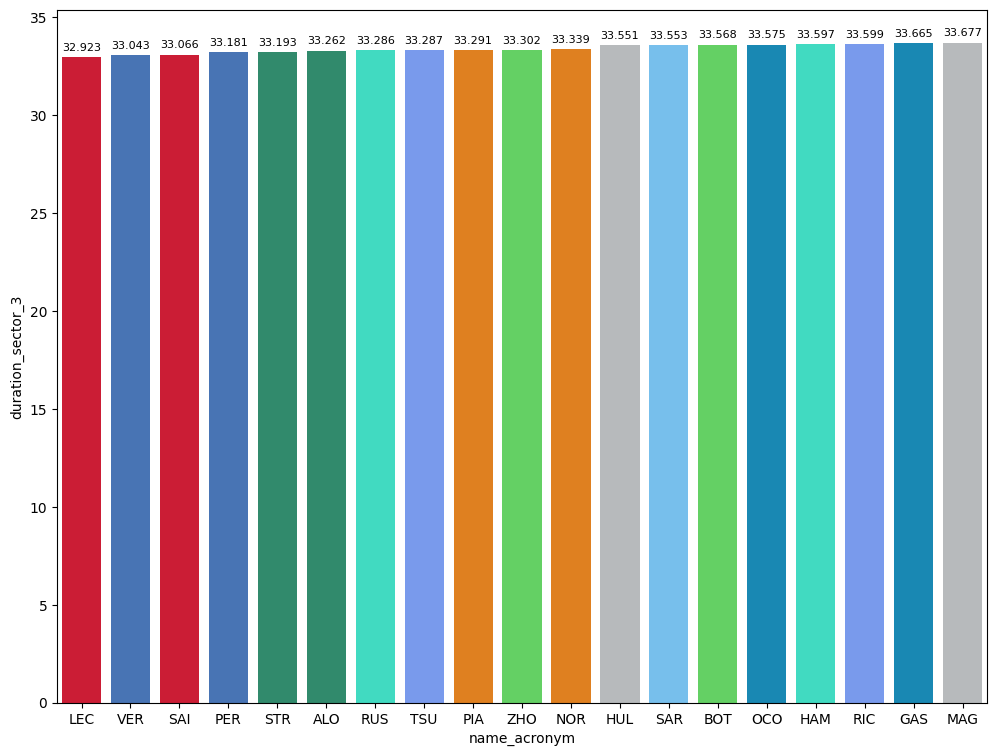

In [27]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [28]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 95").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,80.868857
MEDIUM,83.121831


### Long runs

In [29]:
MINIMUN_SECONDS = 76
MAXIMUM_SECONDS = 93

#### Red Bull Racing

In [30]:
stintInformation.query('driver_number == 1 or driver_number == 11')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1231,9482,1,11,1,6,MEDIUM,0.0
10,1231,9482,1,1,1,9,MEDIUM,0.0
21,1231,9482,2,11,7,9,MEDIUM,0.0
30,1231,9482,2,1,10,12,SOFT,0.0
32,1231,9482,3,11,10,18,SOFT,0.0
43,1231,9482,3,1,13,15,SOFT,3.0
55,1231,9482,4,1,16,22,MEDIUM,8.0
64,1231,9482,4,11,19,30,MEDIUM,8.0
76,1231,9482,5,11,31,34,SOFT,0.0


In [31]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
167,Max VERSTAPPEN,MEDIUM,2024-03-22T05:24:18.661000+00:00,2,27.334,17.924,34.590,79.848
212,Max VERSTAPPEN,MEDIUM,2024-03-22T05:29:08.346000+00:00,5,27.065,17.795,33.460,78.320
239,Max VERSTAPPEN,MEDIUM,2024-03-22T05:32:28.975000+00:00,7,27.042,17.779,33.160,77.981
280,Max VERSTAPPEN,SOFT,2024-03-22T05:40:18.423000+00:00,10,26.839,17.745,33.123,77.707
325,Max VERSTAPPEN,SOFT,2024-03-22T05:45:33.274000+00:00,13,26.942,17.673,33.043,77.658
444,Max VERSTAPPEN,MEDIUM,2024-03-22T05:55:44.751000+00:00,16,29.050,18.665,36.860,84.575
460,Max VERSTAPPEN,MEDIUM,2024-03-22T05:57:09.360000+00:00,17,28.922,18.701,35.880,83.503
477,Max VERSTAPPEN,MEDIUM,2024-03-22T05:58:32.706000+00:00,18,28.645,18.414,36.888,83.947
495,Max VERSTAPPEN,MEDIUM,2024-03-22T05:59:56.680000+00:00,19,28.798,18.528,35.742,83.068


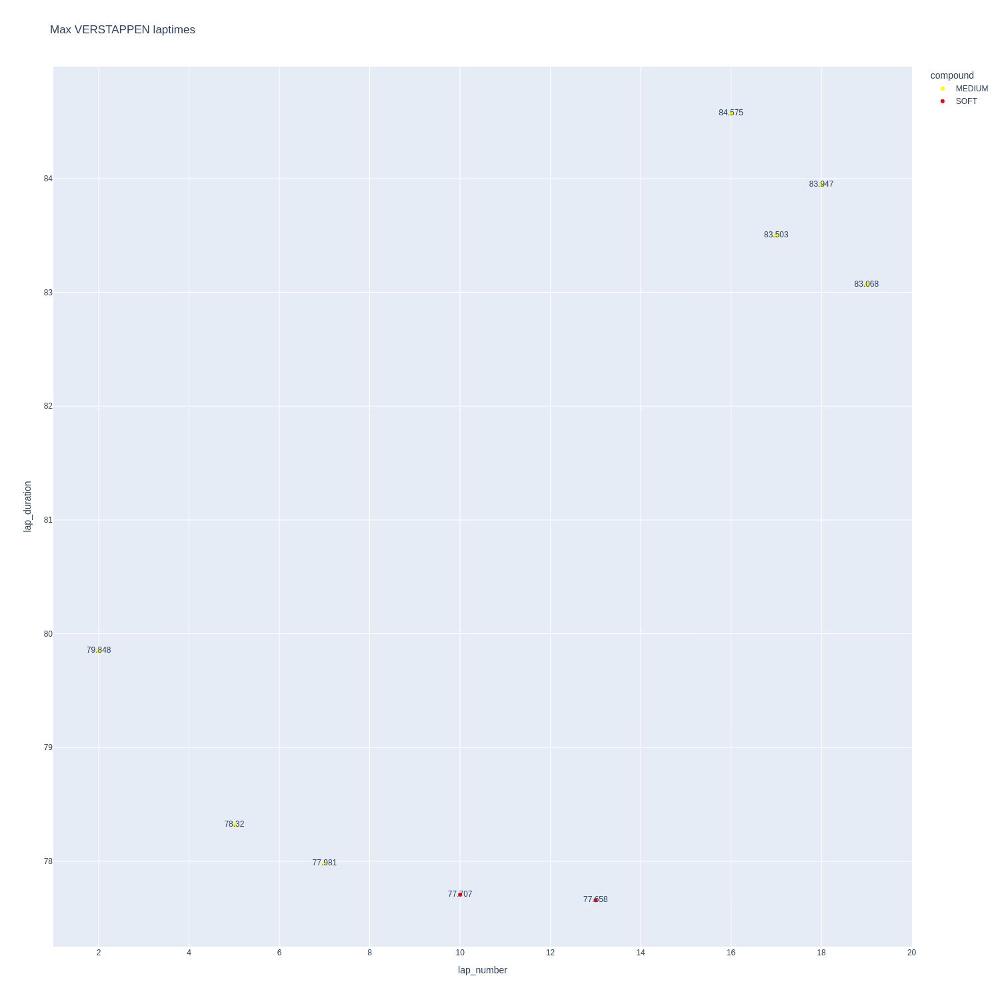

In [32]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

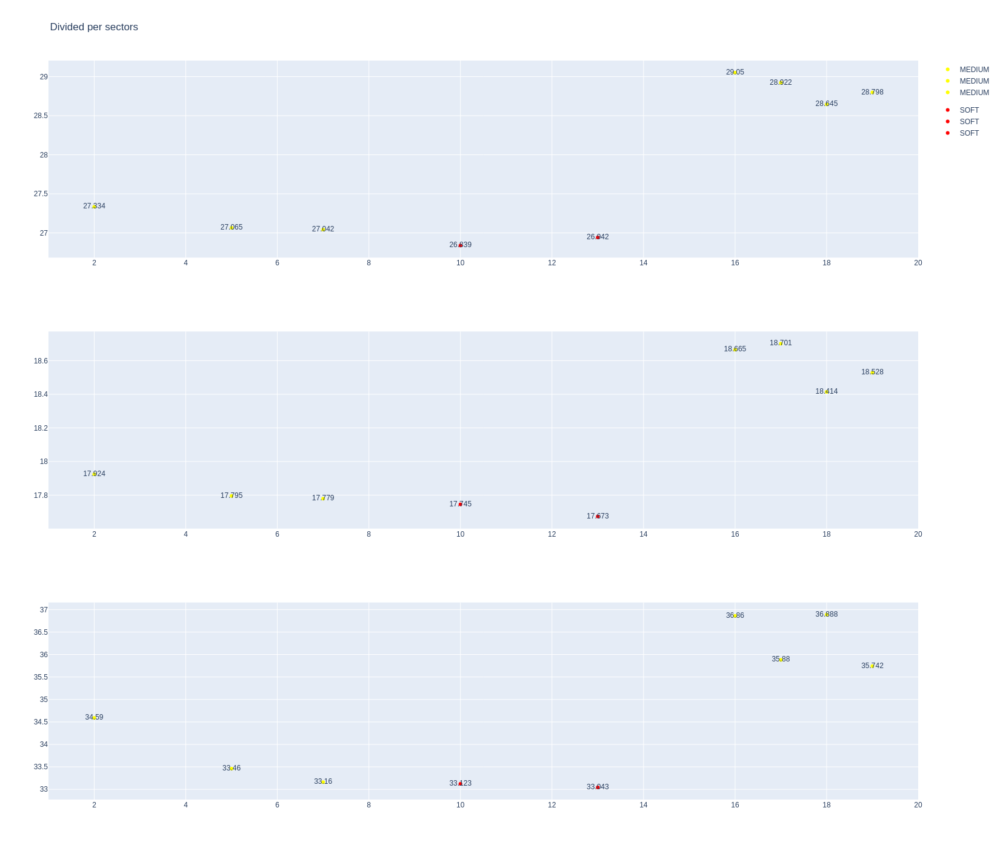

In [33]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [34]:
data = libraryDataF1.getinfolongruns(jointables2,11,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
12,Sergio PEREZ,MEDIUM,2024-03-22T05:01:35.427000+00:00,2,28.187,18.176,34.071,80.434
42,Sergio PEREZ,MEDIUM,2024-03-22T05:05:08.373000+00:00,4,27.757,18.064,33.695,79.516
101,Sergio PEREZ,MEDIUM,2024-03-22T05:10:42.666000+00:00,7,27.373,17.872,33.450,78.695
145,Sergio PEREZ,SOFT,2024-03-22T05:20:48.889000+00:00,10,27.146,17.871,33.213,78.230
183,Sergio PEREZ,SOFT,2024-03-22T05:26:17.969000+00:00,13,27.053,17.856,33.181,78.090
234,Sergio PEREZ,SOFT,2024-03-22T05:31:25.558000+00:00,16,27.194,17.811,33.341,78.346
298,Sergio PEREZ,MEDIUM,2024-03-22T05:42:23.376000+00:00,19,28.879,18.600,35.643,83.122
310,Sergio PEREZ,MEDIUM,2024-03-22T05:43:46.596000+00:00,20,28.791,18.479,35.461,82.731
322,Sergio PEREZ,MEDIUM,2024-03-22T05:45:10.921000+00:00,21,28.775,18.449,35.372,82.596
336,Sergio PEREZ,MEDIUM,2024-03-22T05:46:31.808000+00:00,22,28.714,18.375,40.372,87.461


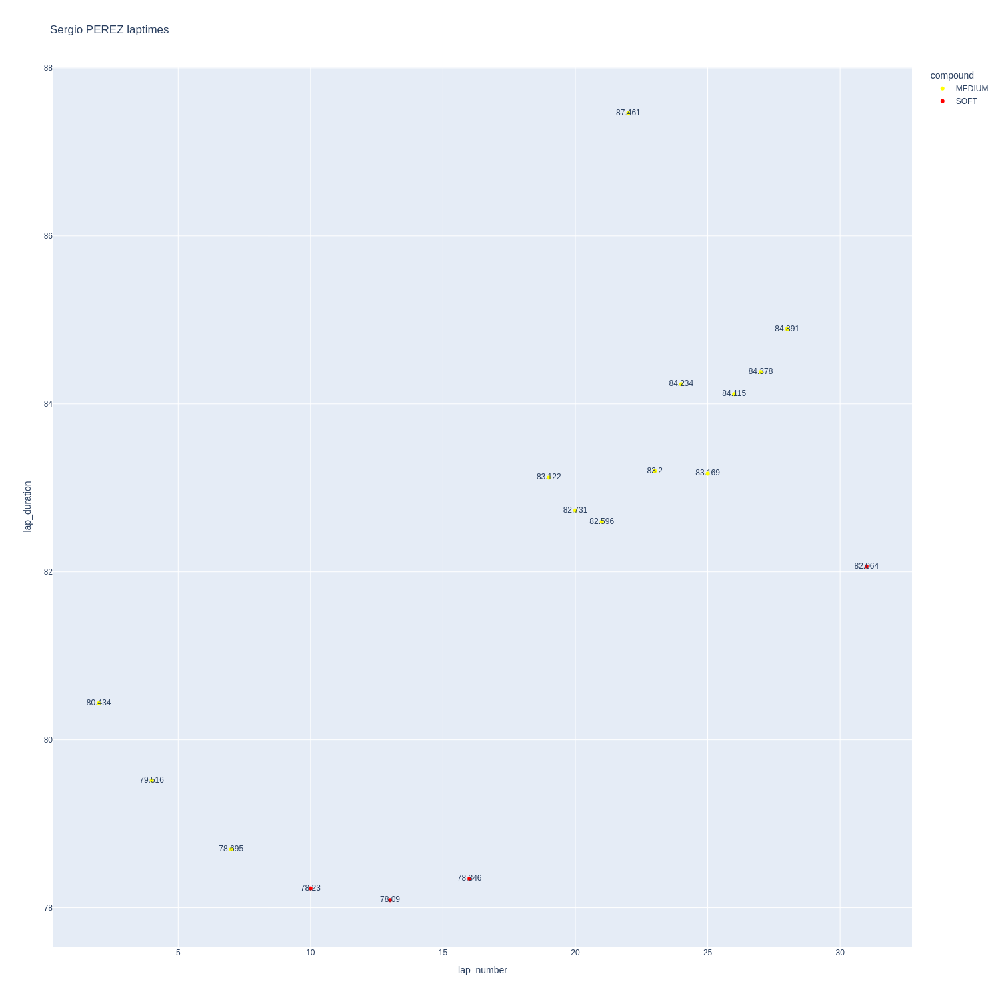

In [35]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

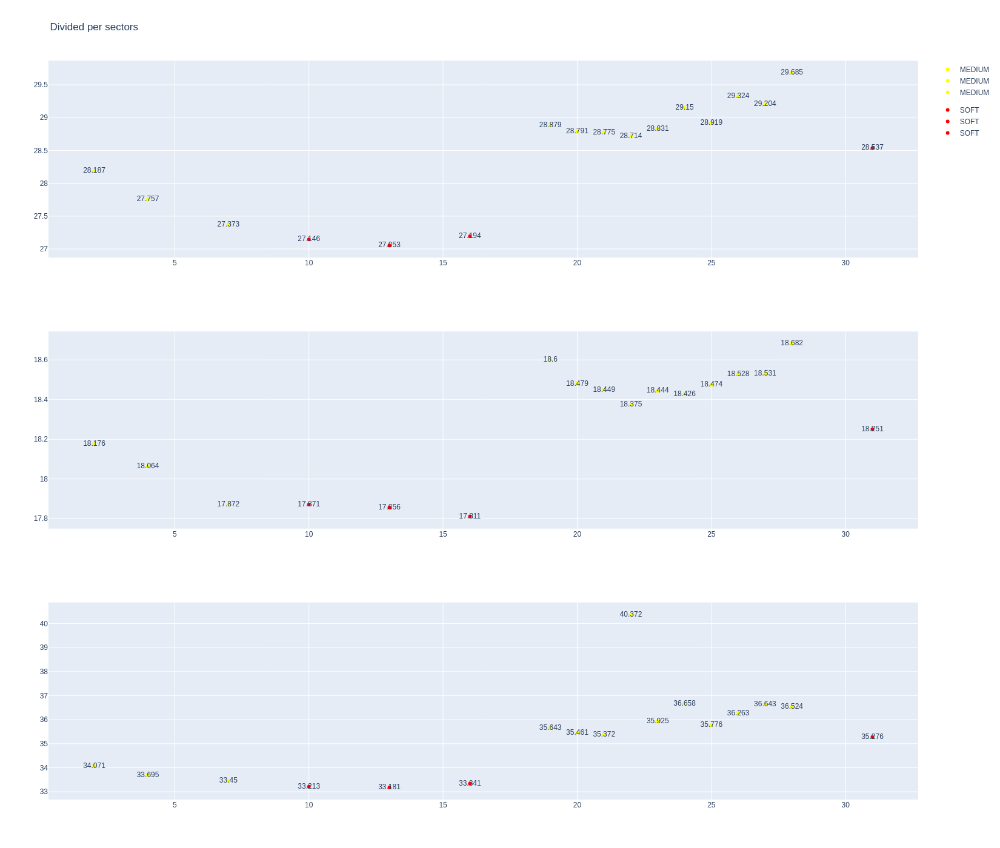

In [36]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [37]:
stintInformation.query('driver_number == 55 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1231,9482,1,55,1,8,MEDIUM,0.0
13,1231,9482,1,16,1,10,MEDIUM,0.0
27,1231,9482,2,55,9,11,SOFT,0.0
34,1231,9482,2,16,11,13,SOFT,0.0
41,1231,9482,3,55,12,14,SOFT,3.0
46,1231,9482,3,16,14,16,SOFT,3.0
52,1231,9482,4,55,15,26,MEDIUM,7.0
59,1231,9482,4,16,17,27,MEDIUM,0.0


In [38]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
39,Charles LECLERC,MEDIUM,2024-03-22T05:04:40.362000+00:00,2,27.639,18.107,33.780,79.526
108,Charles LECLERC,MEDIUM,2024-03-22T05:11:41.647000+00:00,6,27.127,17.730,33.408,78.265
133,Charles LECLERC,MEDIUM,2024-03-22T05:15:11.163000+00:00,8,27.143,17.660,33.133,77.936
215,Charles LECLERC,SOFT,2024-03-22T05:29:33.769000+00:00,11,26.687,17.813,32.923,77.423
252,Charles LECLERC,SOFT,2024-03-22T05:35:16.600000+00:00,14,26.687,17.601,32.989,77.277
364,Charles LECLERC,MEDIUM,2024-03-22T05:49:09.155000+00:00,17,28.707,18.698,35.611,83.016
382,Charles LECLERC,MEDIUM,2024-03-22T05:50:32.021000+00:00,18,28.661,18.642,35.529,82.832
400,Charles LECLERC,MEDIUM,2024-03-22T05:51:54.773000+00:00,19,28.845,18.723,35.422,82.990
417,Charles LECLERC,MEDIUM,2024-03-22T05:53:17.841000+00:00,20,33.258,18.813,35.528,87.599
433,Charles LECLERC,MEDIUM,2024-03-22T05:54:45.345000+00:00,21,28.839,18.643,35.524,83.006


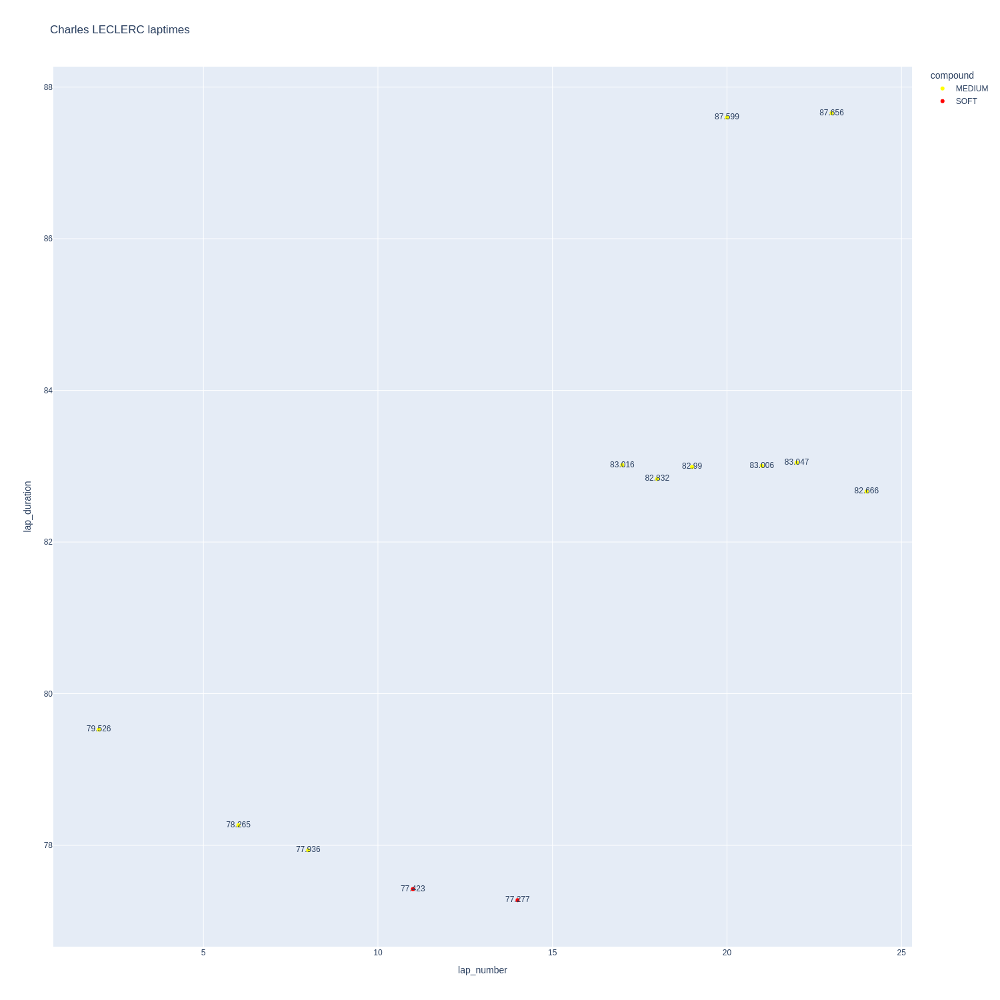

In [39]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

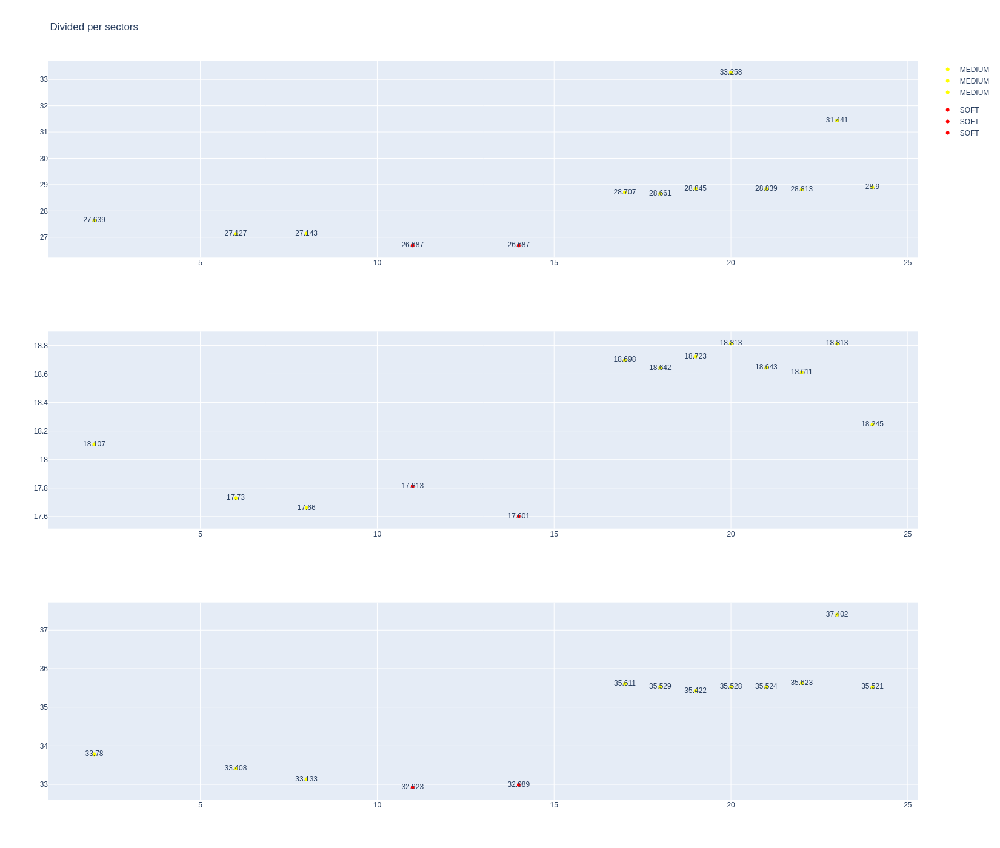

In [40]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [41]:
data = libraryDataF1.getinfolongruns(jointables2,55,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
70,Carlos SAINZ,MEDIUM,2024-03-22T05:07:27.066000+00:00,2,27.564,18.113,33.951,79.628
102,Carlos SAINZ,MEDIUM,2024-03-22T05:11:05.206000+00:00,4,27.485,17.995,33.489,78.969
130,Carlos SAINZ,MEDIUM,2024-03-22T05:14:48.609000+00:00,6,27.195,17.793,33.319,78.307
218,Carlos SAINZ,SOFT,2024-03-22T05:29:45.474000+00:00,9,27.047,17.853,33.066,77.966
253,Carlos SAINZ,SOFT,2024-03-22T05:35:37.208000+00:00,12,26.828,17.742,33.137,77.707
358,Carlos SAINZ,MEDIUM,2024-03-22T05:48:42.449000+00:00,15,28.922,18.868,35.661,83.451
376,Carlos SAINZ,MEDIUM,2024-03-22T05:50:05.854000+00:00,16,28.863,18.792,35.555,83.210
394,Carlos SAINZ,MEDIUM,2024-03-22T05:51:29.033000+00:00,17,28.835,18.871,35.465,83.171
412,Carlos SAINZ,MEDIUM,2024-03-22T05:52:52.263000+00:00,18,28.624,18.717,35.326,82.667
428,Carlos SAINZ,MEDIUM,2024-03-22T05:54:14.941000+00:00,19,29.166,18.743,37.083,84.992


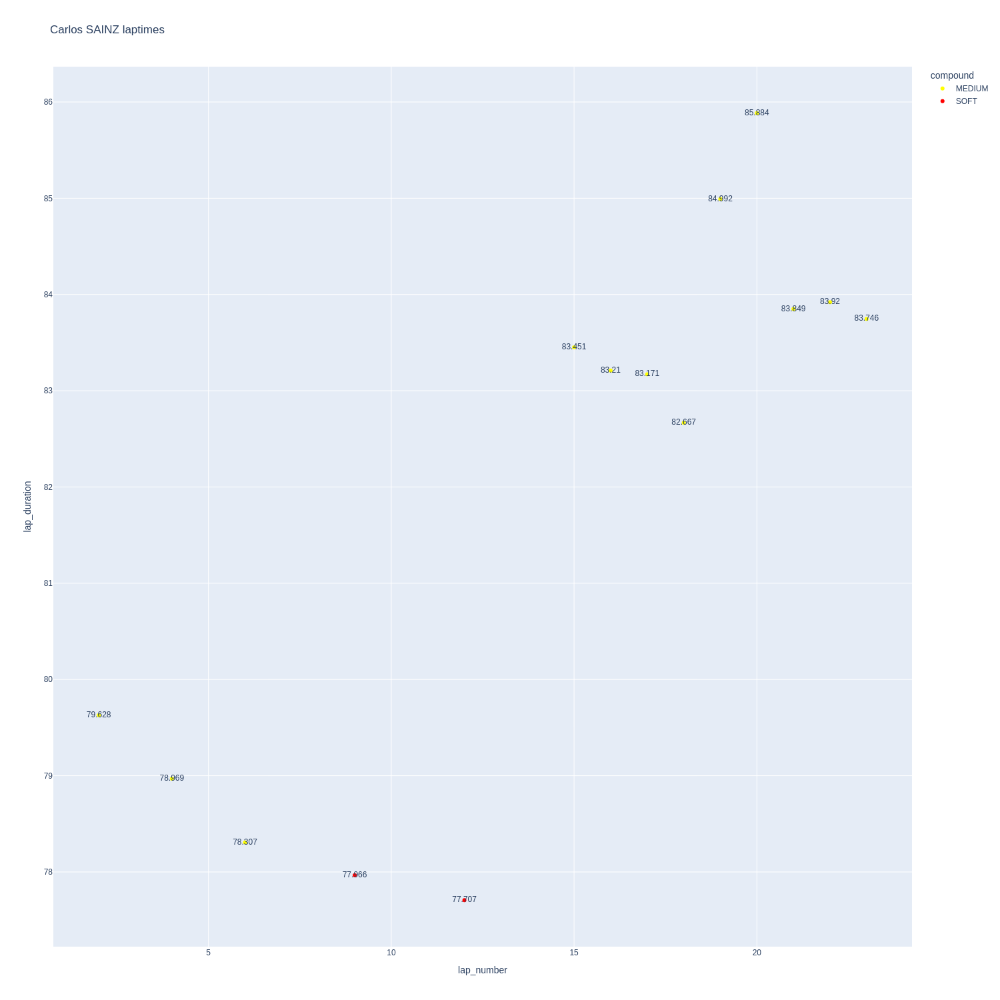

In [42]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

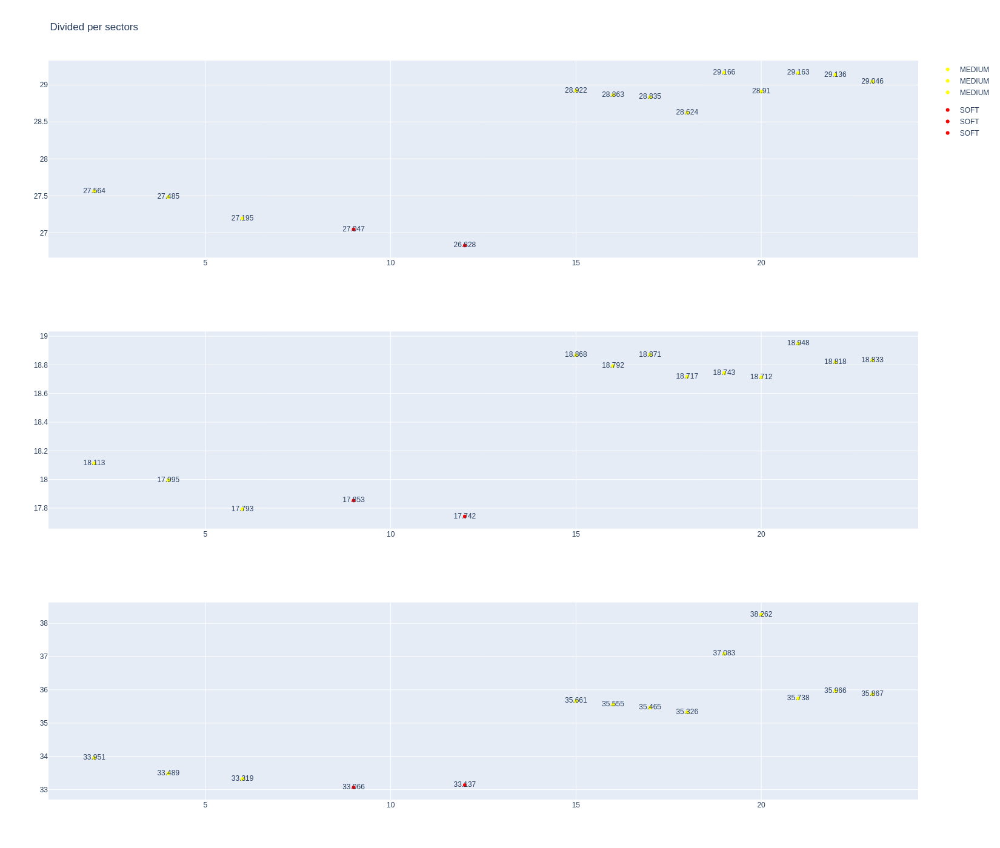

In [43]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [44]:
stintInformation.query('driver_number == 63 or driver_number == 44')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1231,9482,1,63,1,8,MEDIUM,0.0
17,1231,9482,1,44,1,10,MEDIUM,0.0
29,1231,9482,2,63,9,15,SOFT,0.0
39,1231,9482,2,44,11,17,SOFT,0.0
56,1231,9482,3,63,16,25,MEDIUM,7.0
62,1231,9482,3,44,18,21,MEDIUM,9.0
69,1231,9482,4,44,22,24,MEDIUM,0.0


In [45]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
40,Lewis HAMILTON,MEDIUM,2024-03-22T05:04:48.324000+00:00,3,27.659,17.929,34.719,80.307
96,Lewis HAMILTON,MEDIUM,2024-03-22T05:10:02.727000+00:00,6,27.542,17.917,33.937,79.396
124,Lewis HAMILTON,MEDIUM,2024-03-22T05:13:30.678000+00:00,8,27.507,17.757,33.597,78.861
224,Lewis HAMILTON,SOFT,2024-03-22T05:30:15.230000+00:00,12,27.282,17.751,46.060,91.093
249,Lewis HAMILTON,SOFT,2024-03-22T05:34:14.485000+00:00,14,30.502,19.452,38.471,88.425
254,Lewis HAMILTON,SOFT,2024-03-22T05:35:42.880000+00:00,15,27.250,17.838,33.746,78.834
369,Lewis HAMILTON,MEDIUM,2024-03-22T05:49:22.085000+00:00,18,30.470,18.816,42.638,91.924
388,Lewis HAMILTON,MEDIUM,2024-03-22T05:50:54.033000+00:00,19,29.542,18.870,36.458,84.870


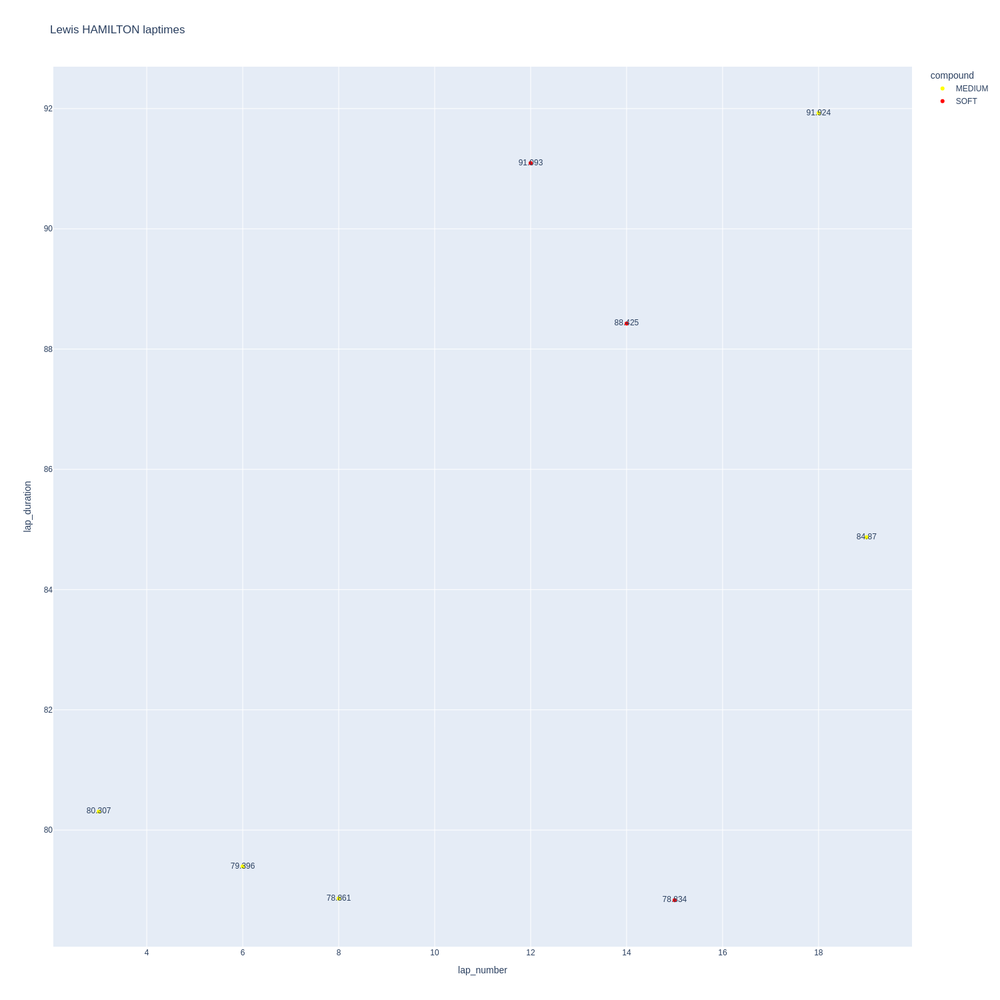

In [46]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

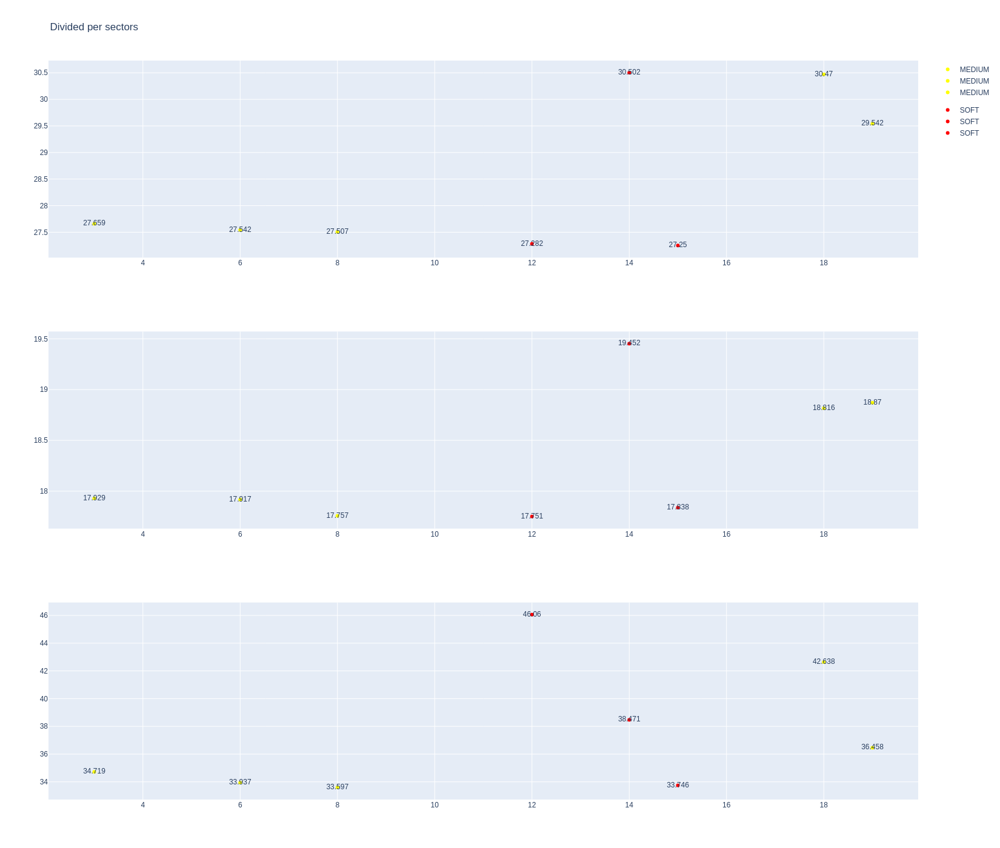

In [47]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [48]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
64,George RUSSELL,MEDIUM,2024-03-22T05:06:55.348000+00:00,2,27.480,17.969,34.052,79.501
94,George RUSSELL,MEDIUM,2024-03-22T05:09:57.005000+00:00,4,27.392,17.858,33.647,78.897
122,George RUSSELL,MEDIUM,2024-03-22T05:13:08.736000+00:00,6,27.167,17.763,33.815,78.745
219,George RUSSELL,SOFT,2024-03-22T05:29:57.060000+00:00,10,26.949,17.716,33.286,77.951
250,George RUSSELL,SOFT,2024-03-22T05:35:01.574000+00:00,13,26.776,17.737,34.394,78.907
391,George RUSSELL,MEDIUM,2024-03-22T05:51:09.852000+00:00,16,29.248,18.766,36.159,84.173
409,George RUSSELL,MEDIUM,2024-03-22T05:52:33.963000+00:00,17,28.982,18.575,36.283,83.840
425,George RUSSELL,MEDIUM,2024-03-22T05:53:57.866000+00:00,18,28.788,18.544,35.989,83.321
439,George RUSSELL,MEDIUM,2024-03-22T05:55:21.103000+00:00,19,29.113,18.624,35.970,83.707
456,George RUSSELL,MEDIUM,2024-03-22T05:56:44.828000+00:00,20,28.825,18.548,36.385,83.758


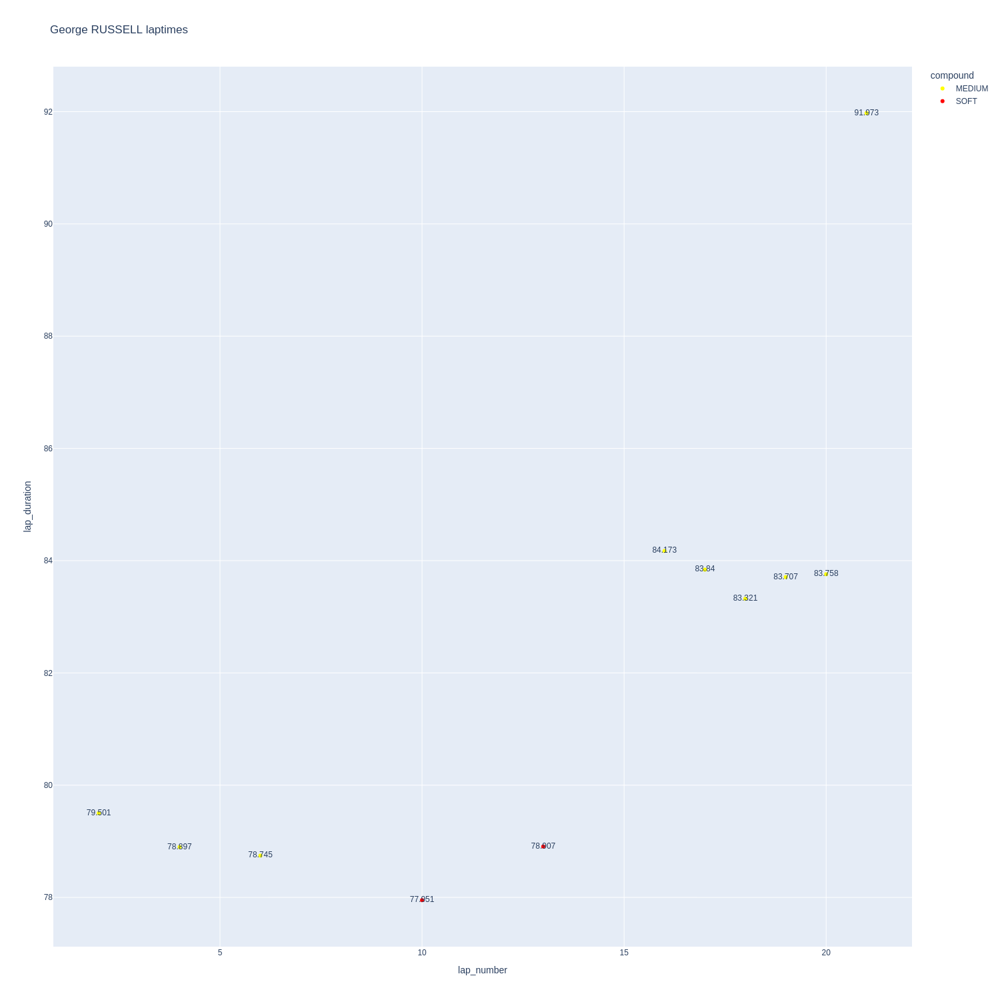

In [49]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

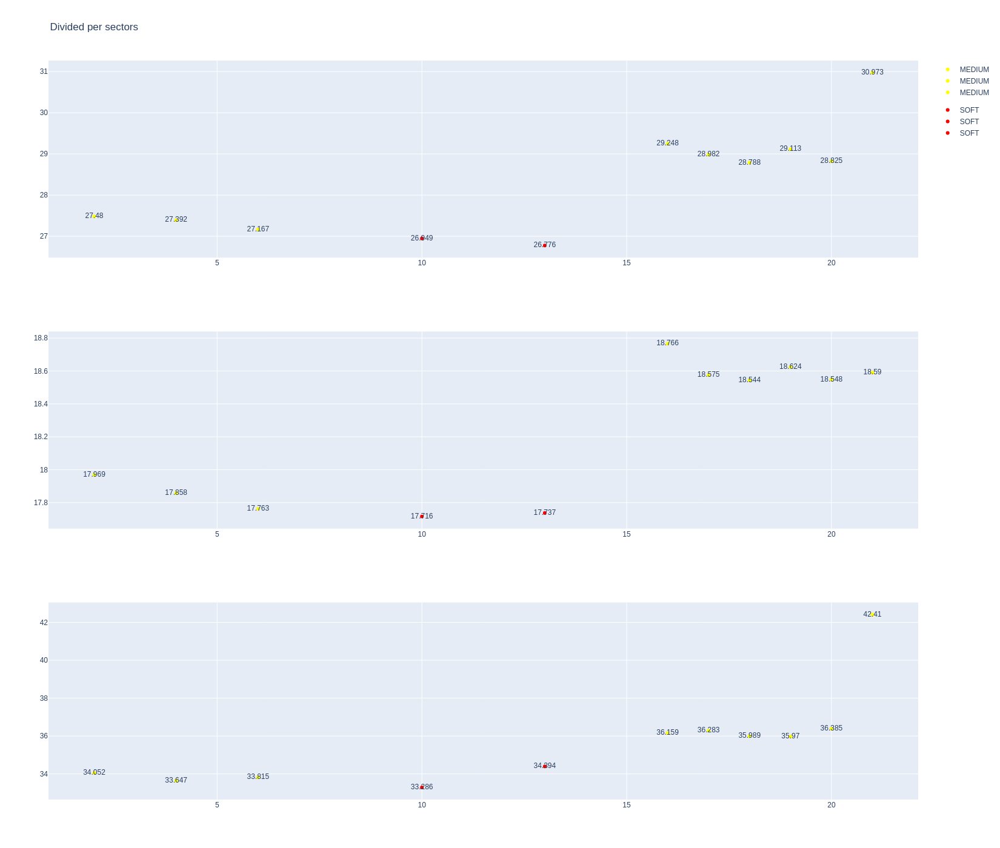

In [50]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [51]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1231,9482,1,81,1,6,MEDIUM,0.0
6,1231,9482,1,4,1,7,MEDIUM,0.0
22,1231,9482,2,81,7,11,SOFT,0.0
25,1231,9482,2,4,8,10,SOFT,0.0
33,1231,9482,3,4,11,13,SOFT,3.0
42,1231,9482,3,81,12,24,MEDIUM,5.0
48,1231,9482,4,4,14,24,MEDIUM,6.0
70,1231,9482,4,81,25,30,SOFT,0.0


In [52]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
73,Lando NORRIS,MEDIUM,2024-03-22T05:07:55.119000+00:00,2,27.381,17.902,33.693,78.976
119,Lando NORRIS,MEDIUM,2024-03-22T05:12:59.327000+00:00,5,27.172,17.690,33.339,78.201
210,Lando NORRIS,SOFT,2024-03-22T05:28:55.742000+00:00,8,27.030,17.715,33.410,78.155
362,Lando NORRIS,MEDIUM,2024-03-22T05:49:01.428000+00:00,14,28.709,18.531,36.042,83.282
380,Lando NORRIS,MEDIUM,2024-03-22T05:50:24.676000+00:00,15,28.936,18.542,35.990,83.468
398,Lando NORRIS,MEDIUM,2024-03-22T05:51:48.150000+00:00,16,28.969,18.476,35.638,83.083
415,Lando NORRIS,MEDIUM,2024-03-22T05:53:11.397000+00:00,17,28.814,18.448,36.043,83.305
431,Lando NORRIS,MEDIUM,2024-03-22T05:54:34.513000+00:00,18,29.060,18.273,35.915,83.248
447,Lando NORRIS,MEDIUM,2024-03-22T05:55:57.803000+00:00,19,28.760,18.357,35.725,82.842
462,Lando NORRIS,MEDIUM,2024-03-22T05:57:20.577000+00:00,20,28.860,18.474,35.589,82.923


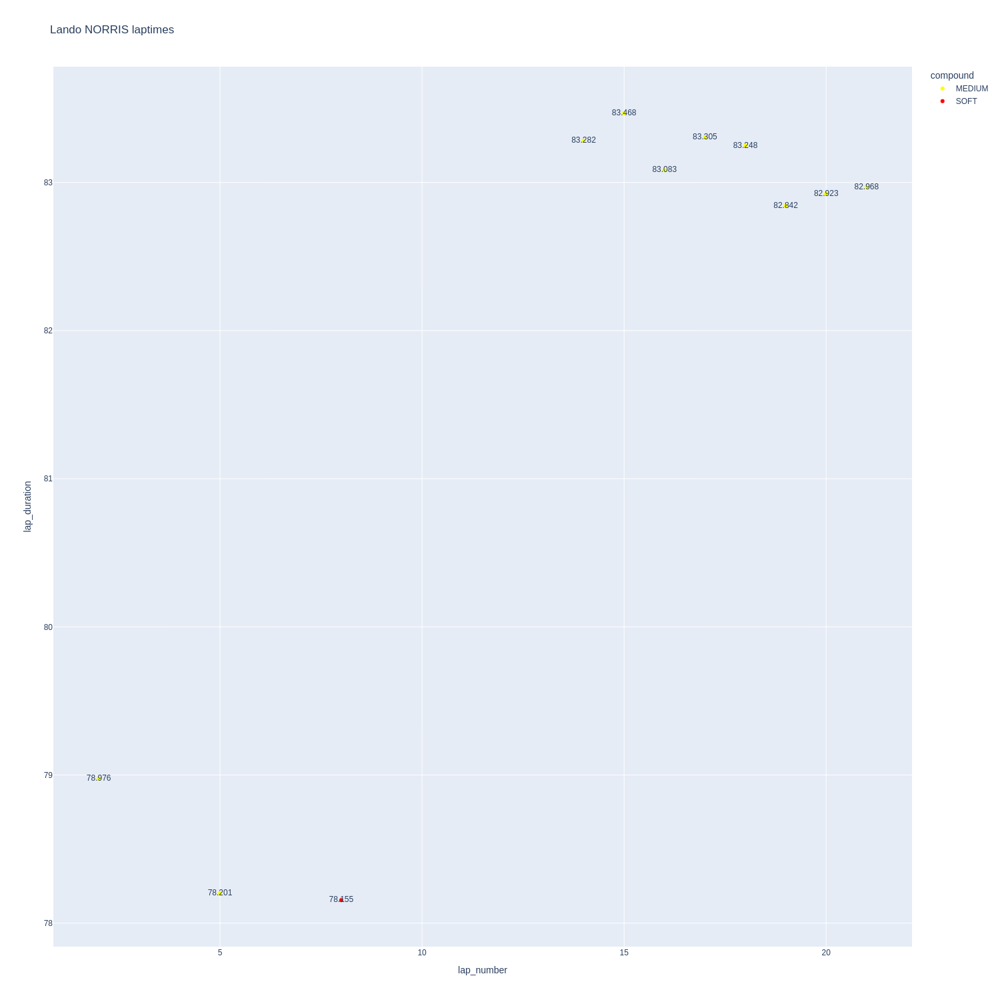

In [53]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

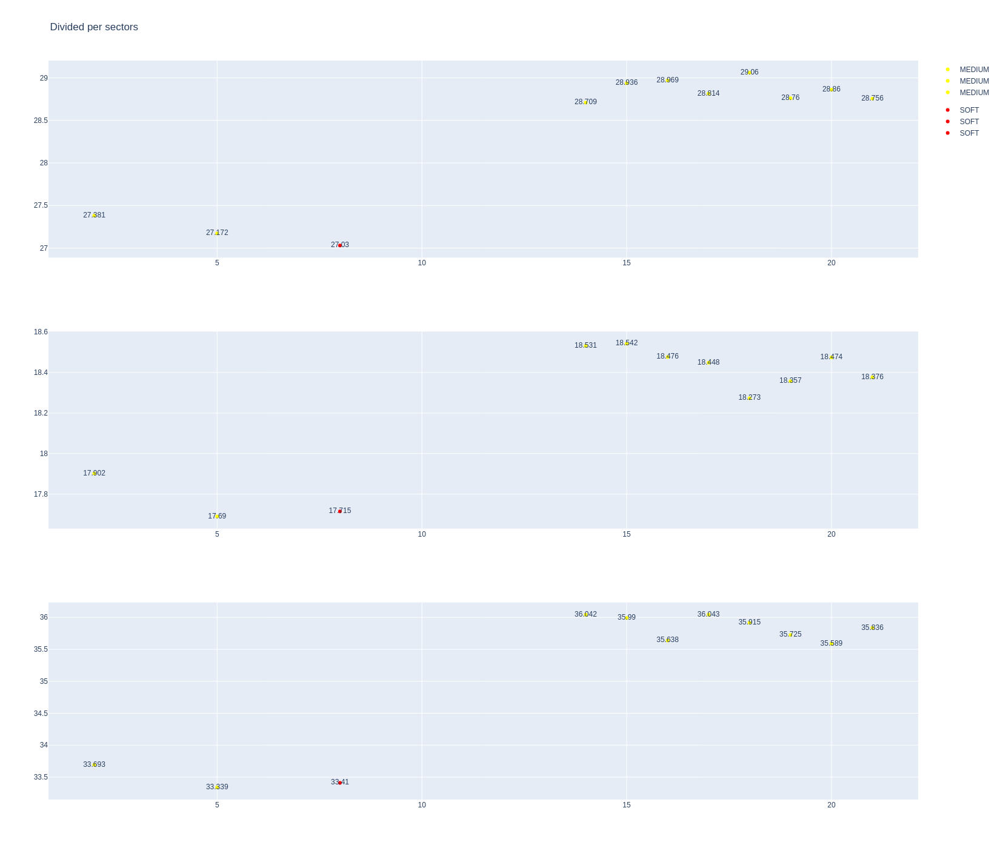

In [54]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [55]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
48,Oscar PIASTRI,MEDIUM,2024-03-22T05:05:32.962000+00:00,2,27.814,17.862,33.475,79.151
83,Oscar PIASTRI,MEDIUM,2024-03-22T05:08:45.970000+00:00,4,27.643,17.946,33.496,79.085
160,Oscar PIASTRI,SOFT,2024-03-22T05:23:22.707000+00:00,7,27.034,17.752,33.291,78.077
184,Oscar PIASTRI,SOFT,2024-03-22T05:26:24.689000+00:00,9,27.184,17.677,33.326,78.187
268,Oscar PIASTRI,MEDIUM,2024-03-22T05:38:21.719000+00:00,12,28.918,18.679,35.920,83.517
277,Oscar PIASTRI,MEDIUM,2024-03-22T05:39:45.306000+00:00,13,28.723,18.526,35.561,82.810
287,Oscar PIASTRI,MEDIUM,2024-03-22T05:41:08.191000+00:00,14,28.458,18.471,35.390,82.319
299,Oscar PIASTRI,MEDIUM,2024-03-22T05:42:30.472000+00:00,15,28.613,18.423,35.369,82.405
312,Oscar PIASTRI,MEDIUM,2024-03-22T05:43:52.764000+00:00,16,28.866,18.456,35.429,82.751
323,Oscar PIASTRI,MEDIUM,2024-03-22T05:45:15.576000+00:00,17,28.686,18.489,35.403,82.578


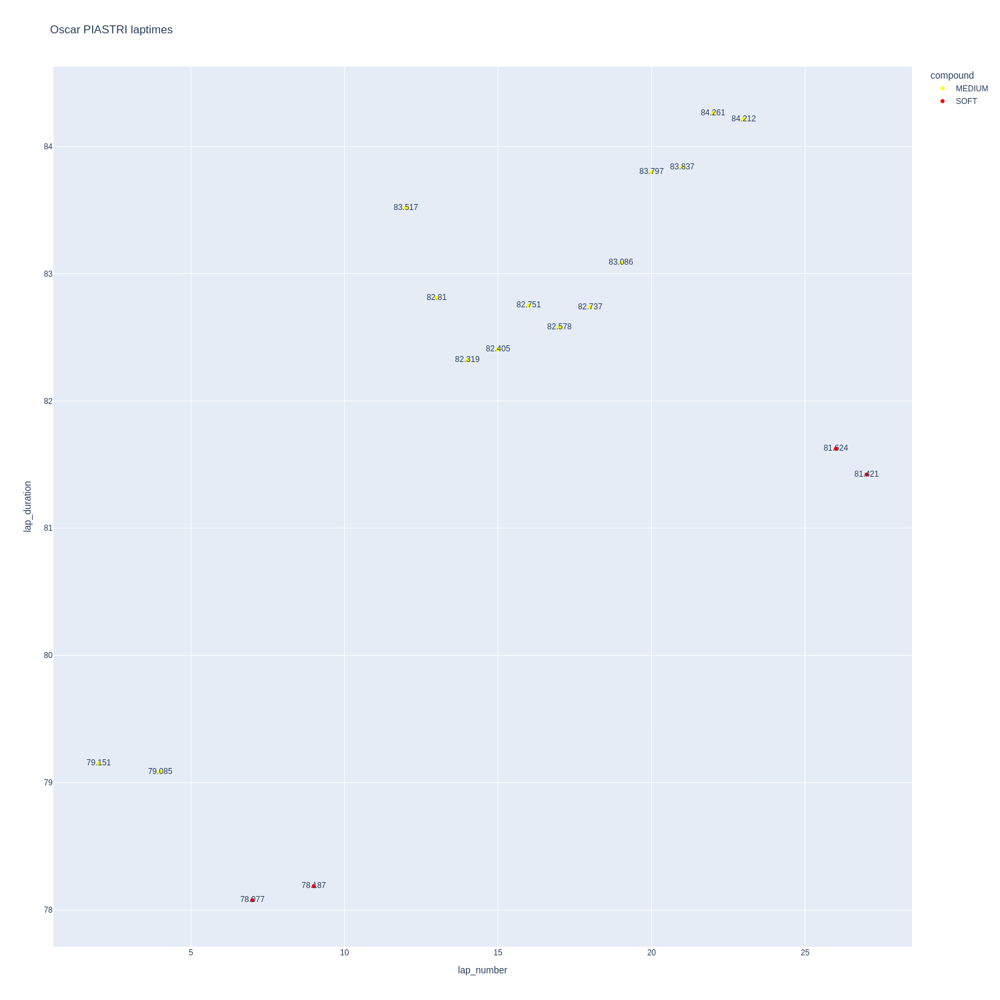

In [56]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

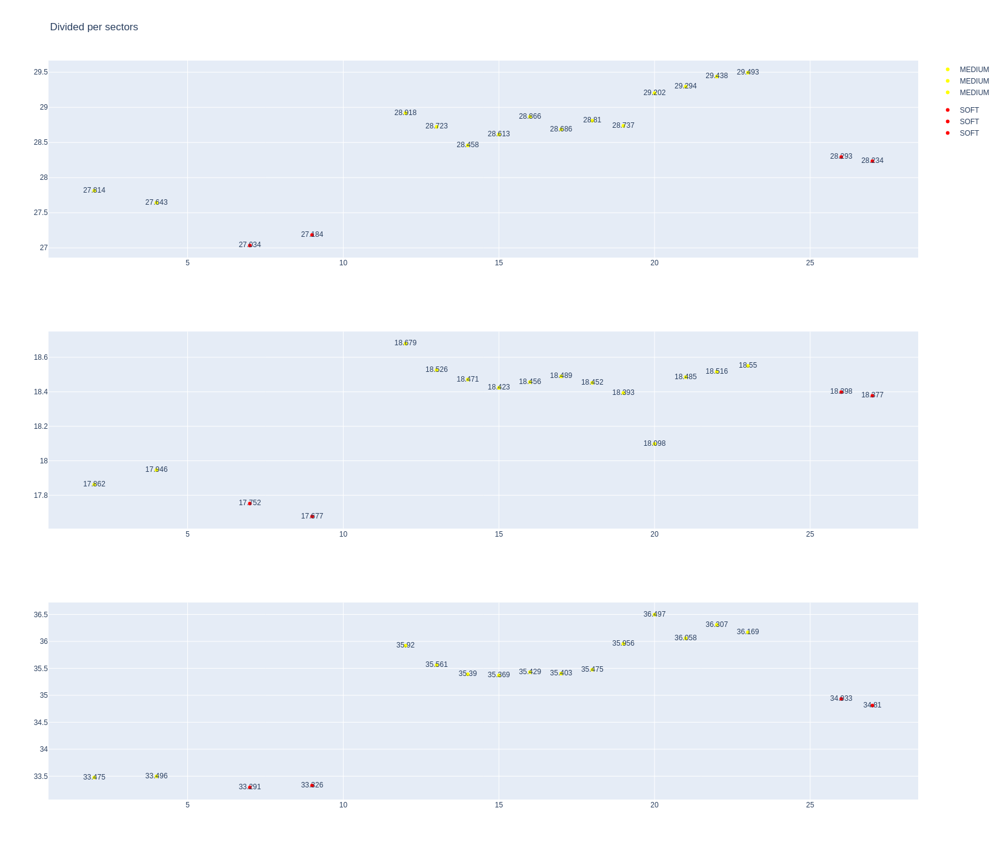

In [57]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [58]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1231,9482,1,14,1,6,MEDIUM,0.0
4,1231,9482,1,18,1,6,MEDIUM,0.0
23,1231,9482,2,18,7,13,SOFT,0.0
24,1231,9482,2,14,7,14,SOFT,0.0
49,1231,9482,3,18,14,26,MEDIUM,5.0
53,1231,9482,3,14,15,29,MEDIUM,0.0
72,1231,9482,4,18,27,30,SOFT,18.0
74,1231,9482,4,14,30,32,SOFT,8.0


In [59]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
22,Fernando ALONSO,MEDIUM,2024-03-22T05:02:54.906000+00:00,2,27.813,17.845,33.754,79.412
52,Fernando ALONSO,MEDIUM,2024-03-22T05:05:58.772000+00:00,4,27.377,17.762,33.666,78.805
140,Fernando ALONSO,SOFT,2024-03-22T05:18:36.611000+00:00,7,26.993,17.812,33.322,78.127
151,Fernando ALONSO,SOFT,2024-03-22T05:21:50.262000+00:00,9,26.962,17.688,33.262,77.912
187,Fernando ALONSO,SOFT,2024-03-22T05:26:48.018000+00:00,12,26.905,17.699,33.427,78.031
276,Fernando ALONSO,MEDIUM,2024-03-22T05:39:26.500000+00:00,15,29.541,18.940,36.846,85.327
286,Fernando ALONSO,MEDIUM,2024-03-22T05:40:51.698000+00:00,16,29.404,18.957,36.744,85.105
297,Fernando ALONSO,MEDIUM,2024-03-22T05:42:16.797000+00:00,17,29.226,18.885,36.569,84.680
308,Fernando ALONSO,MEDIUM,2024-03-22T05:43:41.552000+00:00,18,28.903,18.705,36.211,83.819
321,Fernando ALONSO,MEDIUM,2024-03-22T05:45:05.407000+00:00,19,29.105,18.630,35.943,83.678


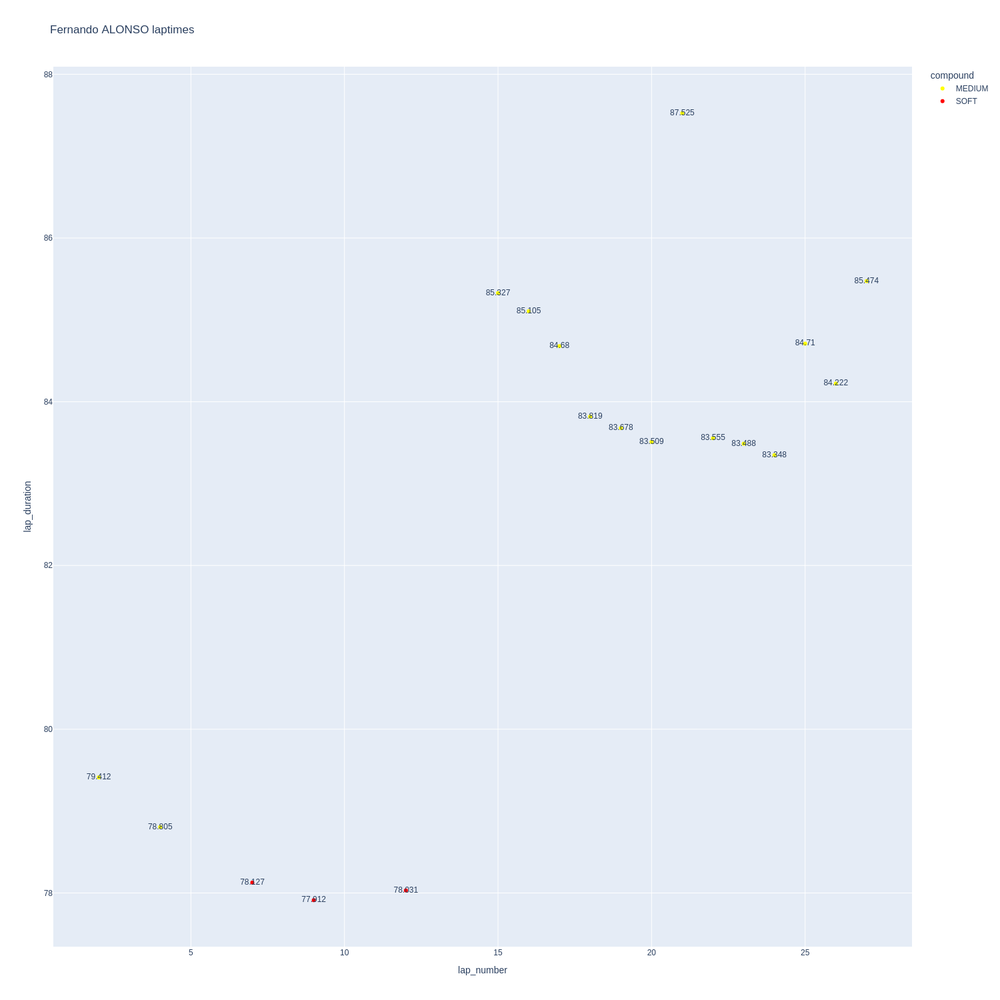

In [60]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

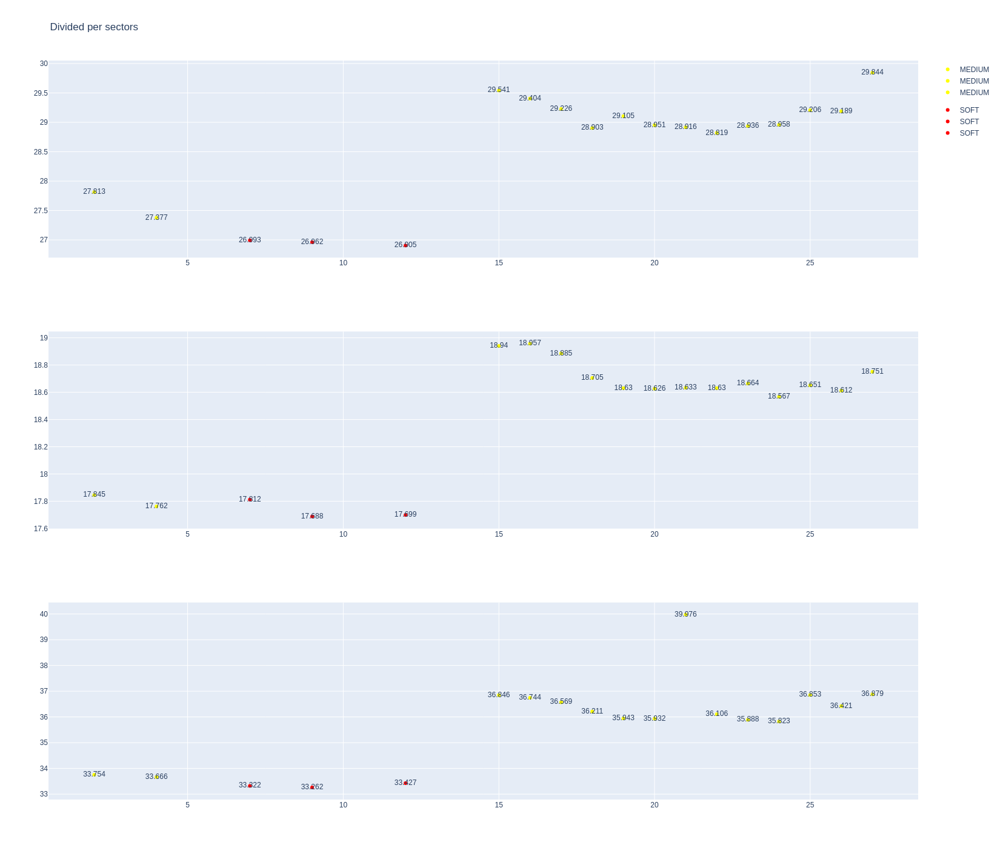

In [61]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [62]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
26,Lance STROLL,MEDIUM,2024-03-22T05:03:06.436000+00:00,2,28.064,18.103,33.872,80.039
56,Lance STROLL,MEDIUM,2024-03-22T05:06:11.468000+00:00,4,27.561,17.907,33.511,78.979
142,Lance STROLL,SOFT,2024-03-22T05:19:40.256000+00:00,7,26.777,17.691,34.672,79.140
159,Lance STROLL,SOFT,2024-03-22T05:23:16.515000+00:00,9,26.831,17.798,33.193,77.822
186,Lance STROLL,SOFT,2024-03-22T05:26:40.319000+00:00,11,27.125,17.853,33.316,78.294
278,Lance STROLL,MEDIUM,2024-03-22T05:39:50.656000+00:00,14,29.013,18.825,35.593,83.431
288,Lance STROLL,MEDIUM,2024-03-22T05:41:14.092000+00:00,15,28.865,18.714,35.631,83.210
300,Lance STROLL,MEDIUM,2024-03-22T05:42:37.198000+00:00,16,28.857,18.688,35.297,82.842
313,Lance STROLL,MEDIUM,2024-03-22T05:44:00.109000+00:00,17,28.887,18.738,35.508,83.133
324,Lance STROLL,MEDIUM,2024-03-22T05:45:23.281000+00:00,18,28.895,18.587,35.524,83.006


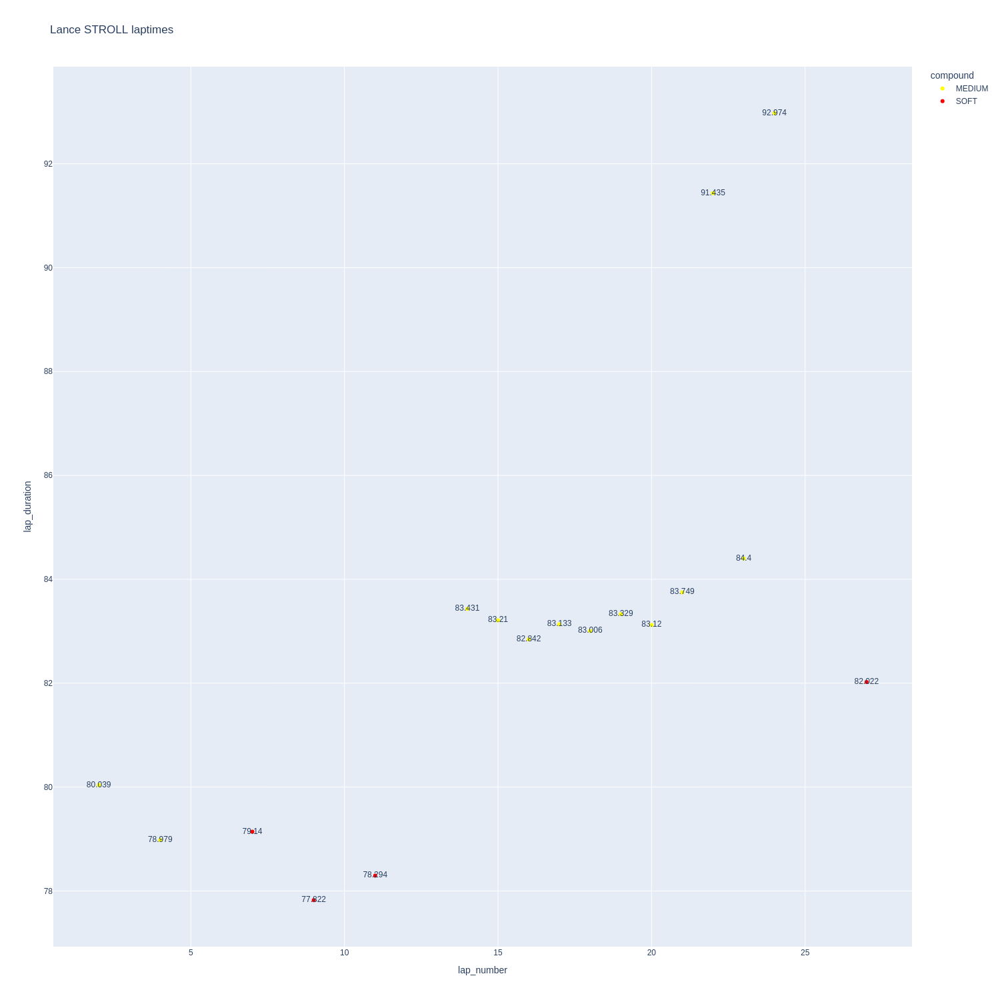

In [63]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

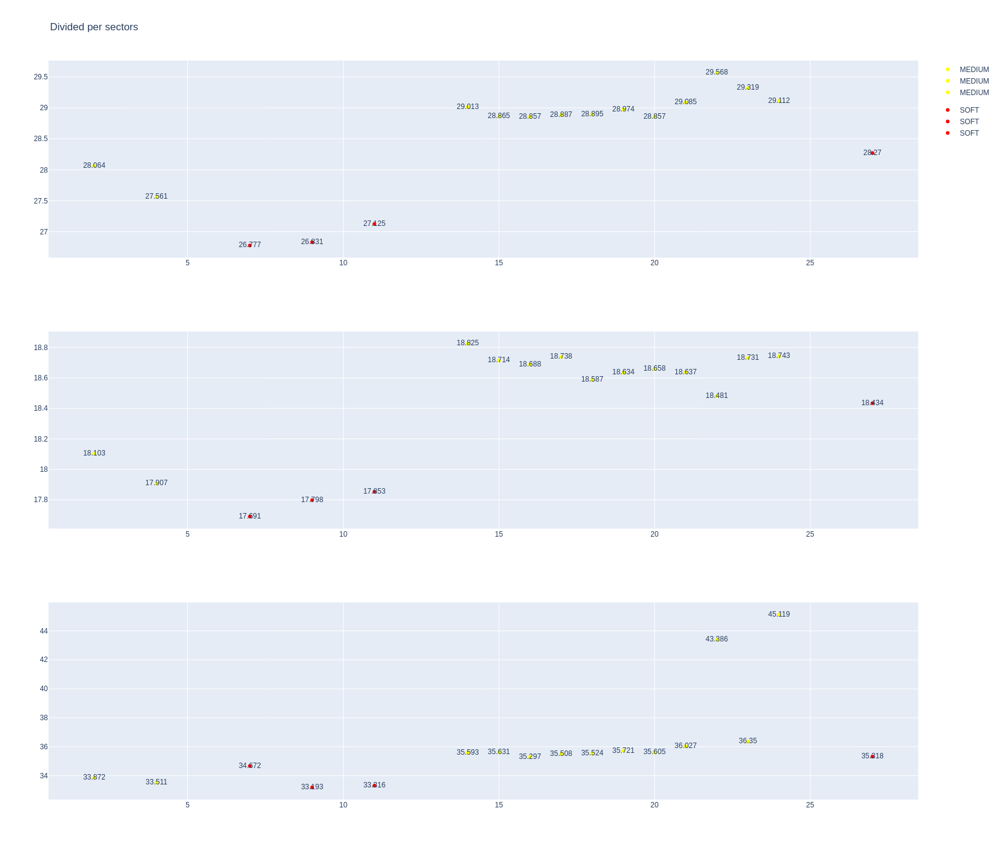

In [64]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [65]:
stintInformation.query('driver_number == 3 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1231,9482,1,3,1,10,MEDIUM,0.0
14,1231,9482,1,22,1,10,MEDIUM,0.0
37,1231,9482,2,3,11,16,SOFT,0.0
38,1231,9482,2,22,11,16,SOFT,0.0
58,1231,9482,3,3,17,26,MEDIUM,9.0
60,1231,9482,3,22,17,28,MEDIUM,9.0
73,1231,9482,4,3,27,31,MEDIUM,19.0


In [66]:
data = libraryDataF1.getinfolongruns(jointables2,3,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
19,Daniel RICCIARDO,MEDIUM,2024-03-22T05:02:19.258000+00:00,2,27.698,18.042,34.114,79.854
72,Daniel RICCIARDO,MEDIUM,2024-03-22T05:07:45.886000+00:00,5,27.349,18.031,33.830,79.210
118,Daniel RICCIARDO,MEDIUM,2024-03-22T05:12:55.487000+00:00,8,27.492,17.944,33.969,79.405
161,Daniel RICCIARDO,SOFT,2024-03-22T05:23:28.488000+00:00,11,27.272,17.954,33.622,78.848
209,Daniel RICCIARDO,SOFT,2024-03-22T05:28:49.423000+00:00,14,27.036,17.899,33.599,78.534
282,Daniel RICCIARDO,MEDIUM,2024-03-22T05:40:26.466000+00:00,17,29.569,19.105,36.768,85.442
292,Daniel RICCIARDO,MEDIUM,2024-03-22T05:41:52.027000+00:00,18,29.689,19.081,36.960,85.730
302,Daniel RICCIARDO,MEDIUM,2024-03-22T05:43:17.743000+00:00,19,29.243,18.962,36.423,84.628
315,Daniel RICCIARDO,MEDIUM,2024-03-22T05:44:42.373000+00:00,20,29.310,18.889,36.213,84.412
328,Daniel RICCIARDO,MEDIUM,2024-03-22T05:46:06.802000+00:00,21,28.925,18.813,35.618,83.356


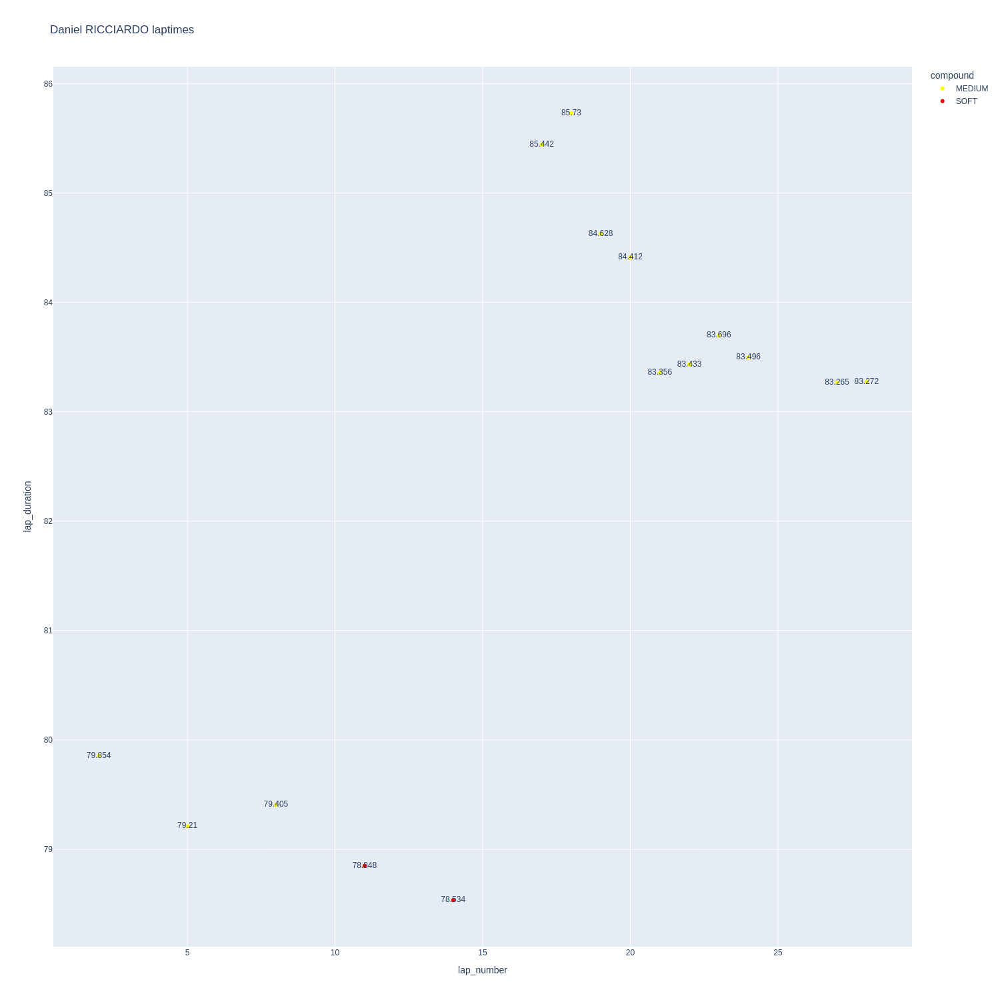

In [67]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

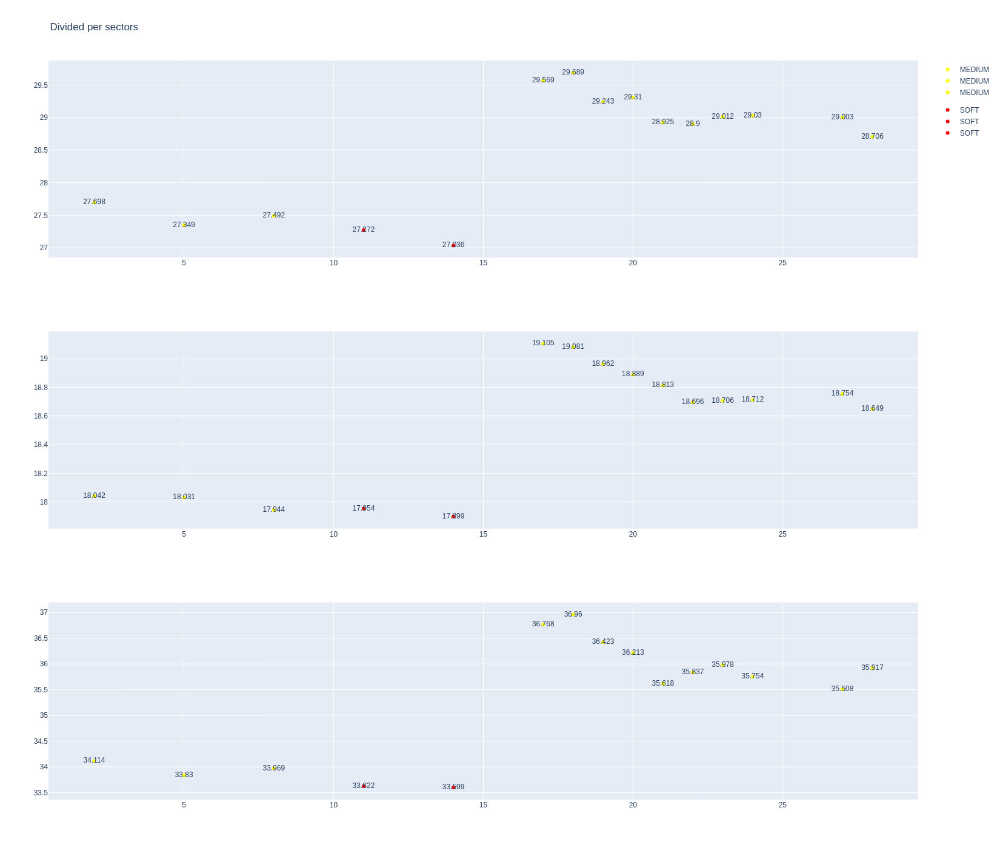

In [68]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [69]:
data = libraryDataF1.getinfolongruns(jointables2,22,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Yuki TSUNODA,MEDIUM,2024-03-22T05:02:44.089000+00:00,2,27.952,18.180,34.217,80.349
77,Yuki TSUNODA,MEDIUM,2024-03-22T05:08:16.755000+00:00,5,27.503,17.960,33.722,79.185
125,Yuki TSUNODA,MEDIUM,2024-03-22T05:13:46.579000+00:00,8,27.548,18.074,33.766,79.388
237,Yuki TSUNODA,SOFT,2024-03-22T05:32:01.954000+00:00,11,27.193,17.829,33.824,78.846
266,Yuki TSUNODA,SOFT,2024-03-22T05:37:53.035000+00:00,14,27.101,17.800,33.287,78.188
356,Yuki TSUNODA,MEDIUM,2024-03-22T05:48:23.763000+00:00,17,29.470,19.055,36.610,85.135
374,Yuki TSUNODA,MEDIUM,2024-03-22T05:49:48.908000+00:00,18,29.203,18.829,36.452,84.484
392,Yuki TSUNODA,MEDIUM,2024-03-22T05:51:13.406000+00:00,19,29.106,18.809,36.169,84.084
410,Yuki TSUNODA,MEDIUM,2024-03-22T05:52:37.532000+00:00,20,29.037,18.731,36.283,84.051
426,Yuki TSUNODA,MEDIUM,2024-03-22T05:54:01.577000+00:00,21,28.881,18.692,36.053,83.626


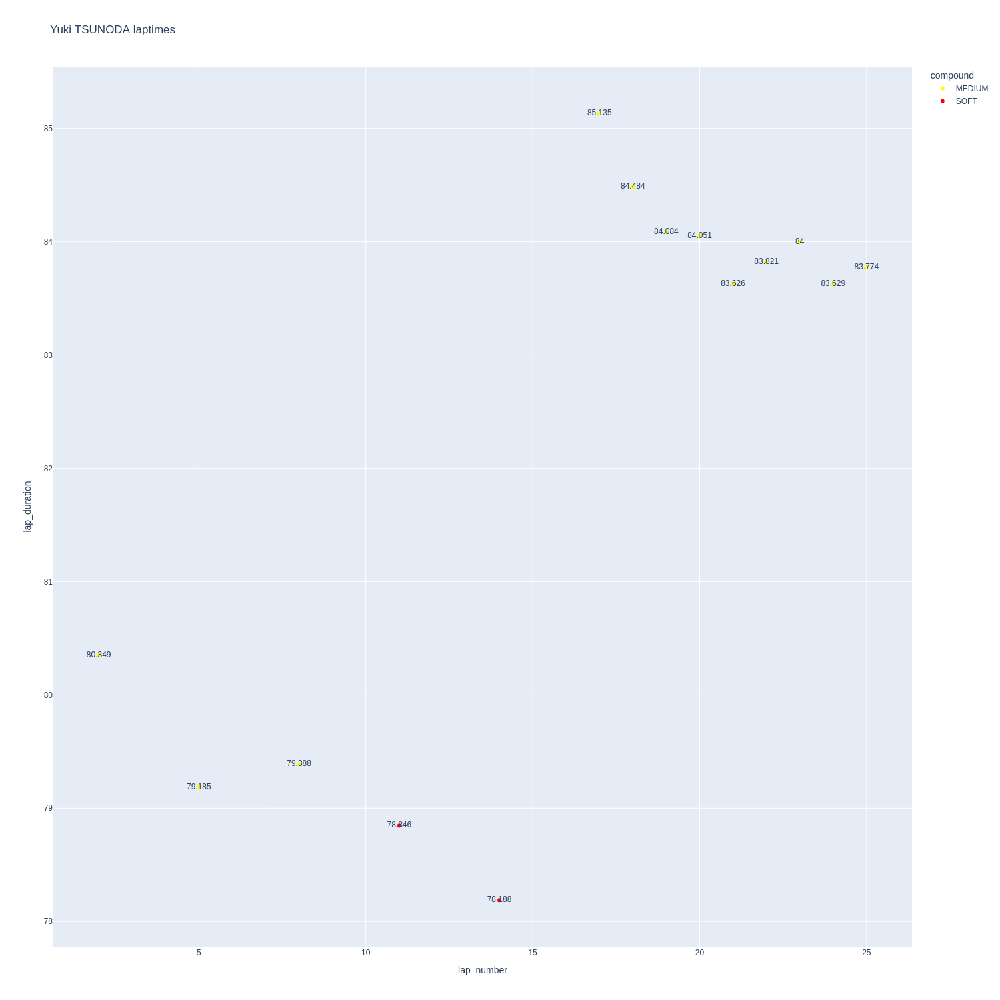

In [70]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

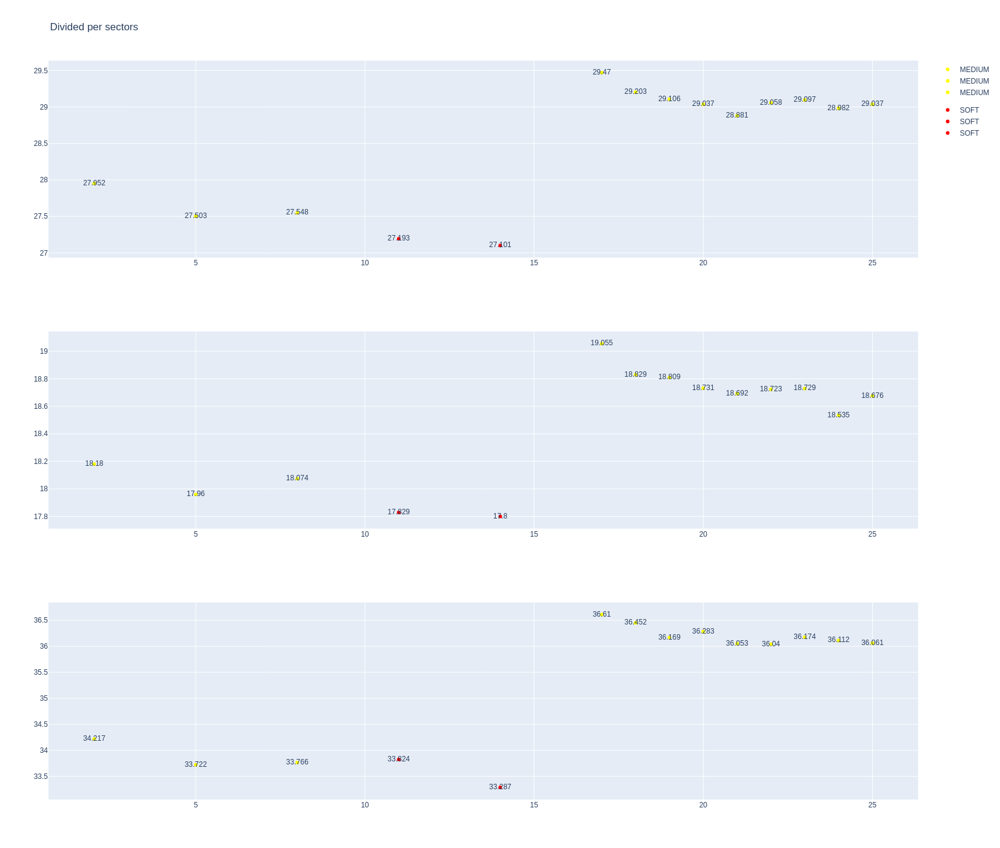

In [71]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [72]:
stintInformation.query('driver_number == 20 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1231,9482,1,27,1,4,MEDIUM,0.0
11,1231,9482,1,20,1,9,MEDIUM,0.0
20,1231,9482,2,27,5,7,MEDIUM,0.0
26,1231,9482,3,27,8,14,SOFT,0.0
31,1231,9482,2,20,10,16,SOFT,0.0
51,1231,9482,4,27,15,26,MEDIUM,6.0
61,1231,9482,3,20,17,32,MEDIUM,8.0
71,1231,9482,5,27,27,29,SOFT,0.0


In [73]:
data = libraryDataF1.getinfolongruns(jointables2,20,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
16,Kevin MAGNUSSEN,MEDIUM,2024-03-22T05:01:58.969000+00:00,2,27.932,18.006,34.547,80.485
66,Kevin MAGNUSSEN,MEDIUM,2024-03-22T05:07:08.636000+00:00,5,27.661,18.055,33.907,79.623
99,Kevin MAGNUSSEN,MEDIUM,2024-03-22T05:10:31.212000+00:00,7,27.618,17.980,33.677,79.275
155,Kevin MAGNUSSEN,SOFT,2024-03-22T05:22:41.161000+00:00,10,32.097,19.634,38.438,90.169
166,Kevin MAGNUSSEN,SOFT,2024-03-22T05:24:10.668000+00:00,11,27.145,17.741,48.040,92.926
214,Kevin MAGNUSSEN,SOFT,2024-03-22T05:29:24.354000+00:00,14,27.060,17.839,34.481,79.380
294,Kevin MAGNUSSEN,MEDIUM,2024-03-22T05:42:02.691000+00:00,17,30.145,19.193,37.390,86.728
305,Kevin MAGNUSSEN,MEDIUM,2024-03-22T05:43:29.454000+00:00,18,30.456,19.153,37.075,86.684
318,Kevin MAGNUSSEN,MEDIUM,2024-03-22T05:44:56.226000+00:00,19,29.707,19.068,37.137,85.912
331,Kevin MAGNUSSEN,MEDIUM,2024-03-22T05:46:22.076000+00:00,20,29.244,18.833,36.160,84.237


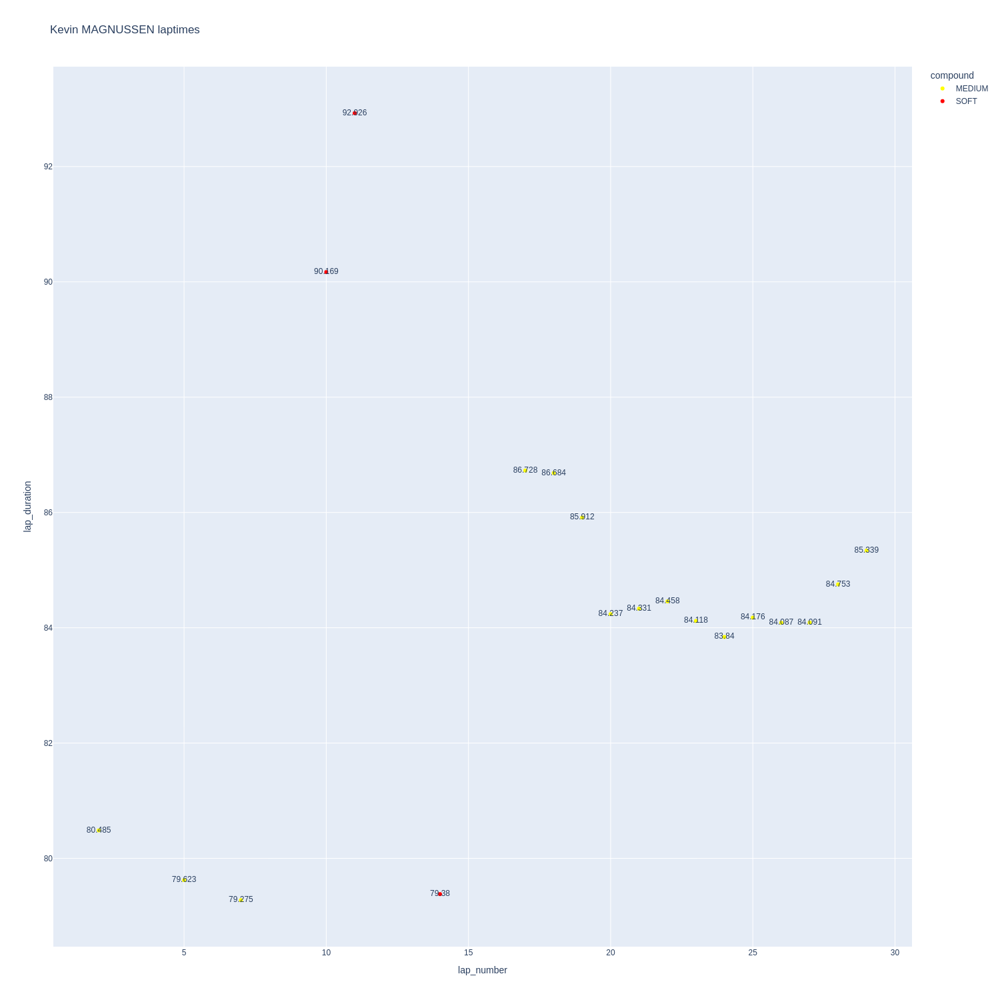

In [74]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

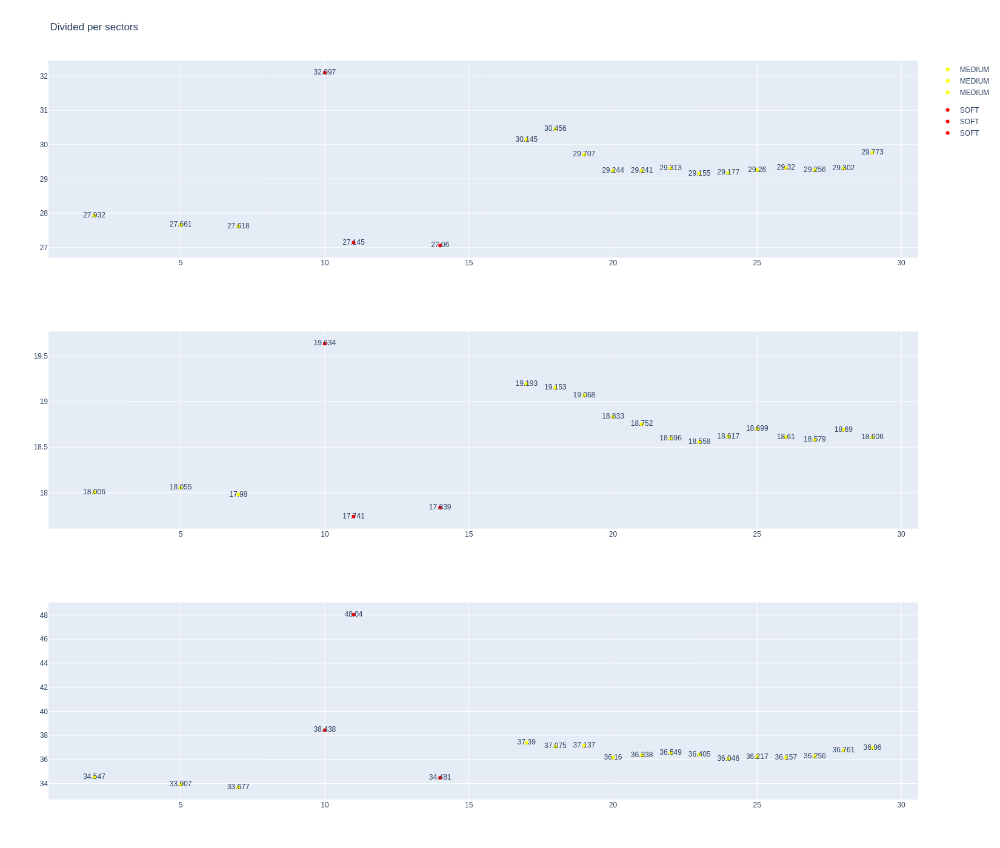

In [75]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [76]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
14,Nico HULKENBERG,MEDIUM,2024-03-22T05:01:47.525000+00:00,2,28.205,18.190,34.269,80.664
68,Nico HULKENBERG,MEDIUM,2024-03-22T05:07:16.294000+00:00,5,27.661,17.995,34.034,79.690
170,Nico HULKENBERG,SOFT,2024-03-22T05:24:27.556000+00:00,8,27.396,17.938,33.651,78.985
233,Nico HULKENBERG,SOFT,2024-03-22T05:31:19.796000+00:00,12,27.305,17.846,33.551,78.702
301,Nico HULKENBERG,MEDIUM,2024-03-22T05:43:07.439000+00:00,15,29.358,18.920,36.388,84.666
314,Nico HULKENBERG,MEDIUM,2024-03-22T05:44:32.071000+00:00,16,29.226,19.005,36.078,84.309
327,Nico HULKENBERG,MEDIUM,2024-03-22T05:45:56.418000+00:00,17,29.302,18.882,35.981,84.165
344,Nico HULKENBERG,MEDIUM,2024-03-22T05:47:20.607000+00:00,18,29.149,18.836,36.119,84.104
359,Nico HULKENBERG,MEDIUM,2024-03-22T05:48:44.802000+00:00,19,29.470,18.724,36.145,84.339
377,Nico HULKENBERG,MEDIUM,2024-03-22T05:50:09.220000+00:00,20,29.229,18.690,36.097,84.016


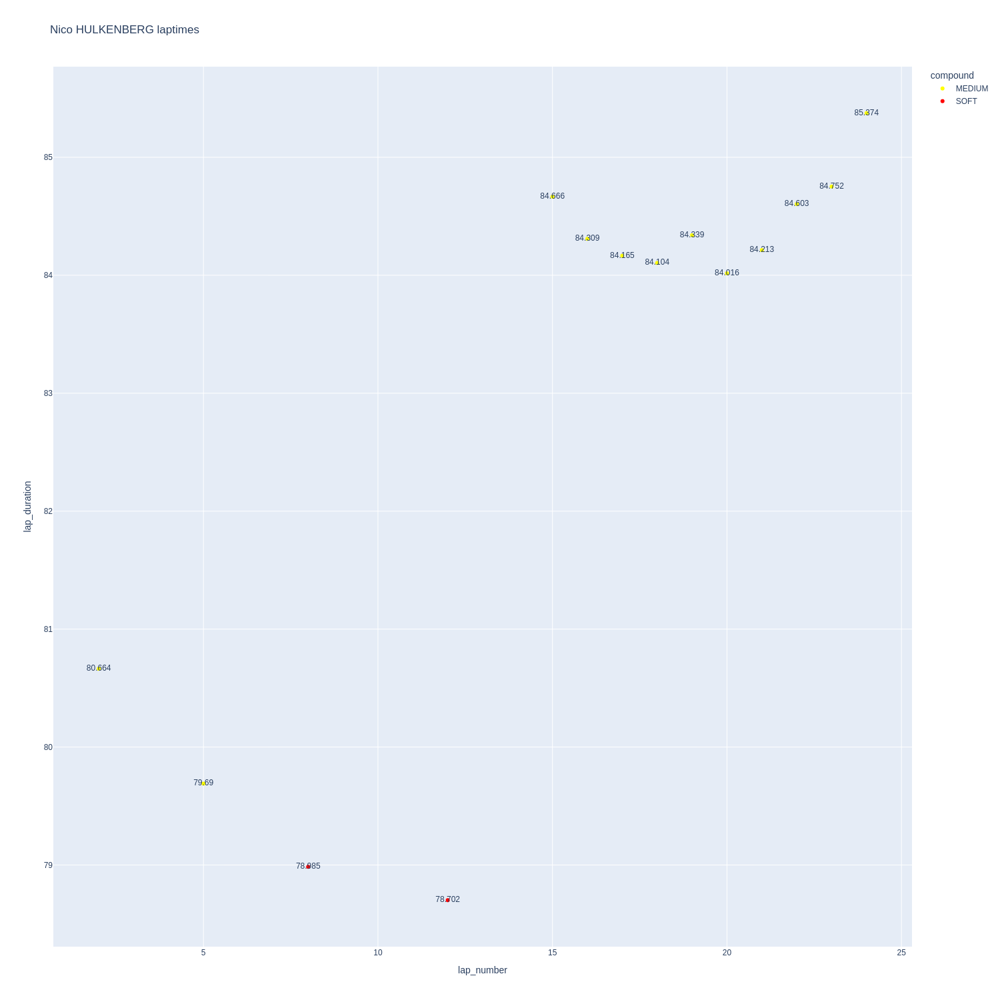

In [77]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

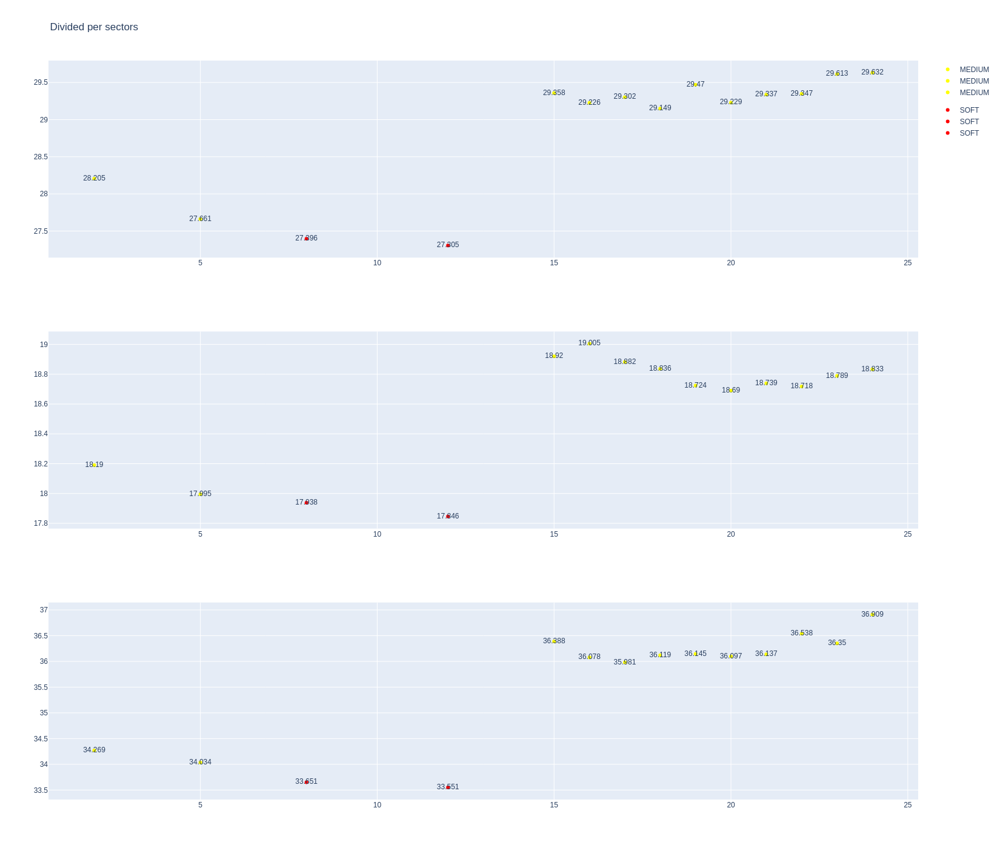

In [78]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [79]:
stintInformation.query('driver_number == 10 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
16,1231,9482,1,31,1,10,MEDIUM,0.0
19,1231,9482,1,10,1,12,MEDIUM,0.0
40,1231,9482,2,31,11,19,SOFT,0.0
44,1231,9482,2,10,13,19,SOFT,0.0
66,1231,9482,3,10,20,30,MEDIUM,11.0
67,1231,9482,3,31,20,33,MEDIUM,9.0
75,1231,9482,4,10,31,34,SOFT,7.0


In [80]:
data =libraryDataF1.getinfolongruns(jointables2,31,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
15,Esteban OCON,MEDIUM,2024-03-22T05:01:52.434000+00:00,2,28.158,17.959,34.553,80.670
43,Esteban OCON,MEDIUM,2024-03-22T05:05:12.827000+00:00,4,27.863,17.891,34.171,79.925
79,Esteban OCON,MEDIUM,2024-03-22T05:08:27.210000+00:00,6,27.677,17.781,33.881,79.339
109,Esteban OCON,MEDIUM,2024-03-22T05:11:45.908000+00:00,8,27.565,17.790,33.803,79.158
177,Esteban OCON,SOFT,2024-03-22T05:25:36.032000+00:00,11,31.780,19.622,40.395,91.797
191,Esteban OCON,SOFT,2024-03-22T05:27:07.852000+00:00,12,27.387,17.845,33.725,78.957
236,Esteban OCON,SOFT,2024-03-22T05:31:56.239000+00:00,15,27.253,17.738,33.842,78.833
251,Esteban OCON,SOFT,2024-03-22T05:35:09.962000+00:00,17,27.379,17.751,33.575,78.705
326,Esteban OCON,MEDIUM,2024-03-22T05:45:43.408000+00:00,20,29.309,18.817,36.157,84.283
341,Esteban OCON,MEDIUM,2024-03-22T05:47:07.623000+00:00,21,29.290,18.760,35.833,83.883


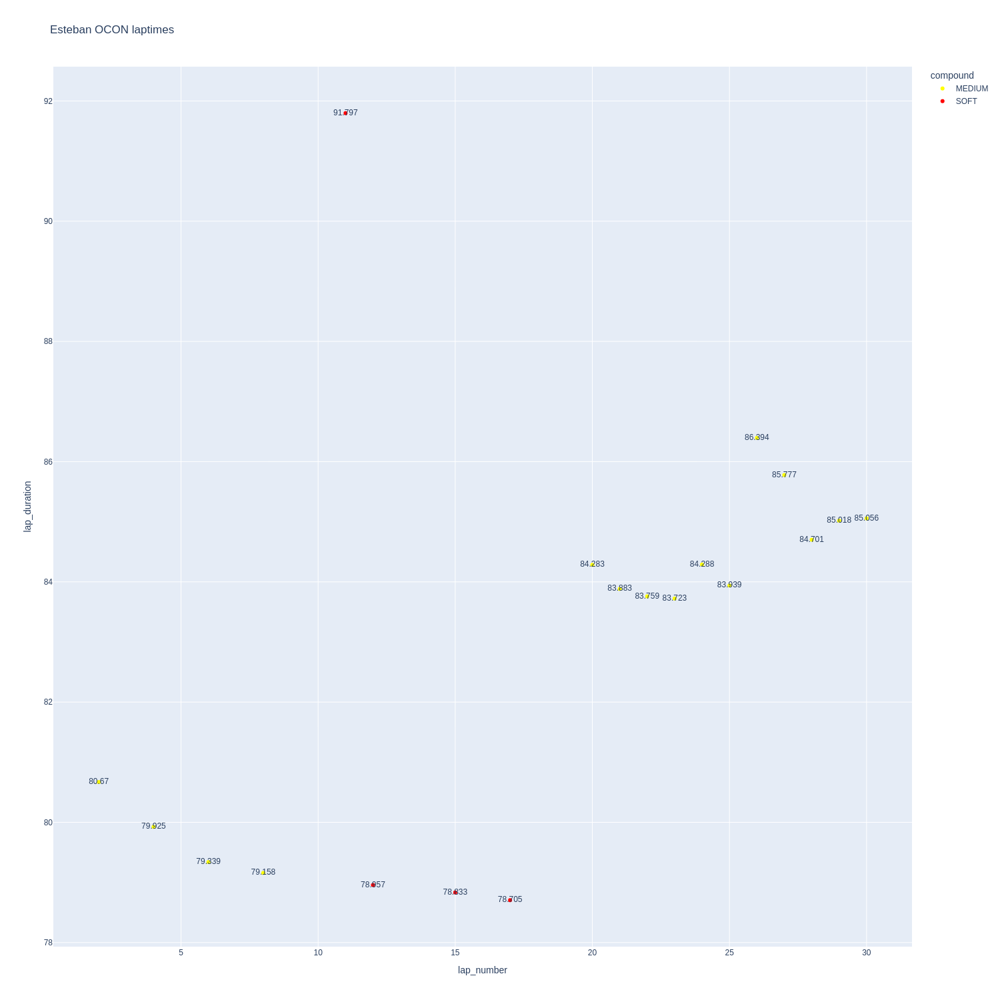

In [81]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

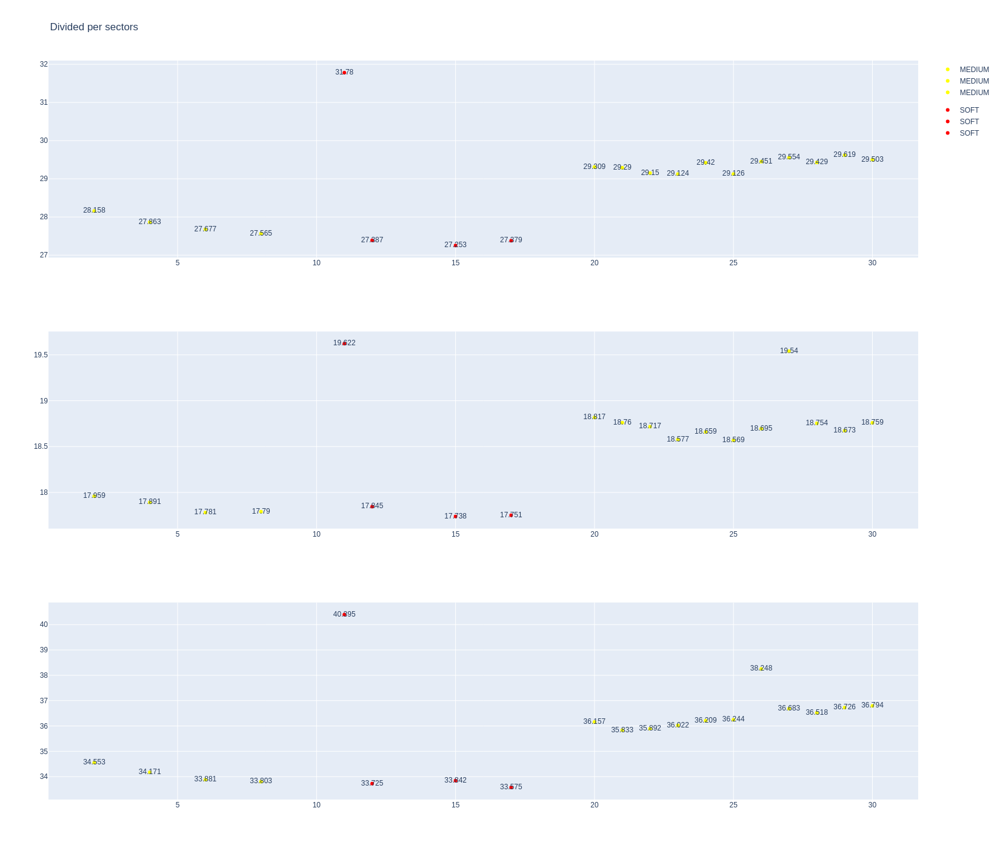

In [82]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [83]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
21,Pierre GASLY,MEDIUM,2024-03-22T05:02:48.471000+00:00,2,27.893,18.029,34.213,80.135
51,Pierre GASLY,MEDIUM,2024-03-22T05:05:53.167000+00:00,4,27.712,17.969,34.244,79.925
89,Pierre GASLY,MEDIUM,2024-03-22T05:09:16.610000+00:00,6,27.431,17.912,33.760,79.103
117,Pierre GASLY,MEDIUM,2024-03-22T05:12:34.384000+00:00,8,27.398,17.848,33.665,78.911
134,Pierre GASLY,MEDIUM,2024-03-22T05:15:44.362000+00:00,10,27.301,18.008,33.805,79.114
181,Pierre GASLY,SOFT,2024-03-22T05:25:52.708000+00:00,13,27.412,17.911,34.069,79.392
211,Pierre GASLY,SOFT,2024-03-22T05:29:01.334000+00:00,15,27.227,17.761,33.703,78.691
238,Pierre GASLY,SOFT,2024-03-22T05:32:14.835000+00:00,17,27.319,17.828,33.732,78.879
304,Pierre GASLY,MEDIUM,2024-03-22T05:43:26.987000+00:00,20,29.222,18.764,36.258,84.244
317,Pierre GASLY,MEDIUM,2024-03-22T05:44:51.274000+00:00,21,28.906,18.723,36.143,83.772


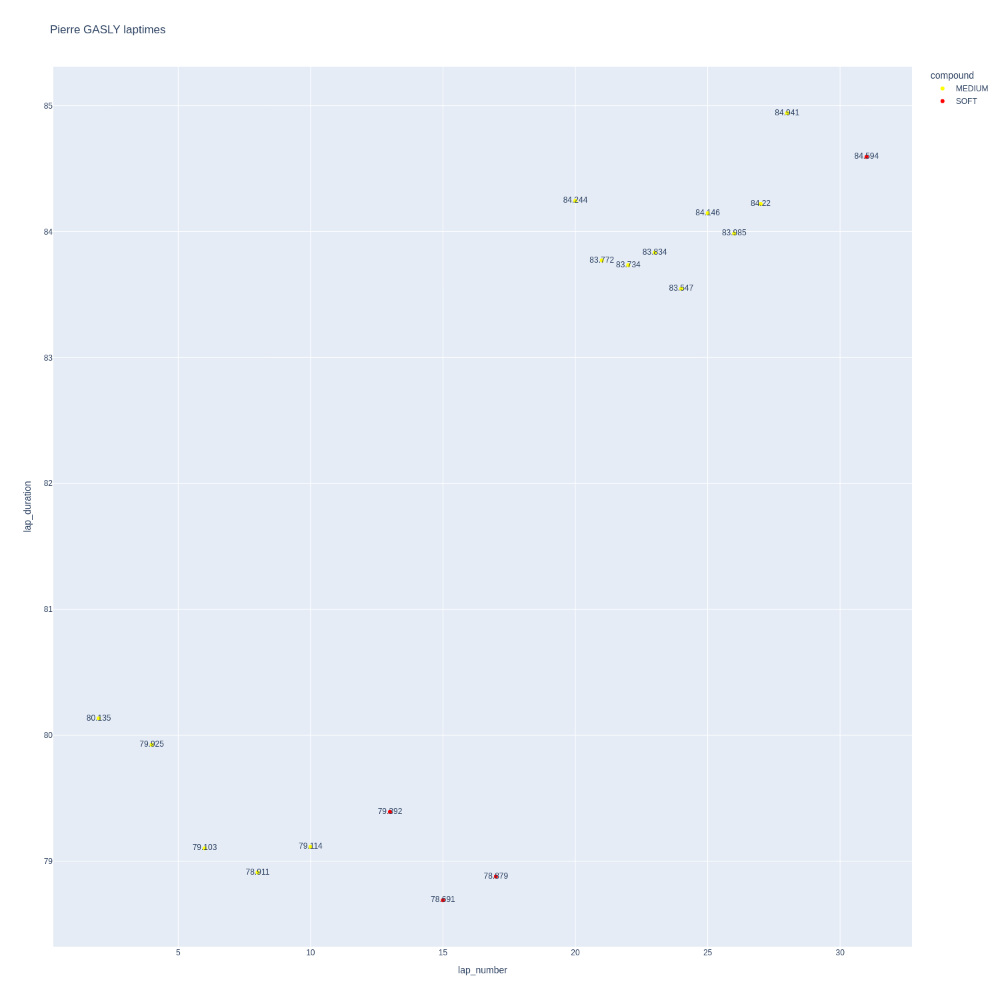

In [84]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

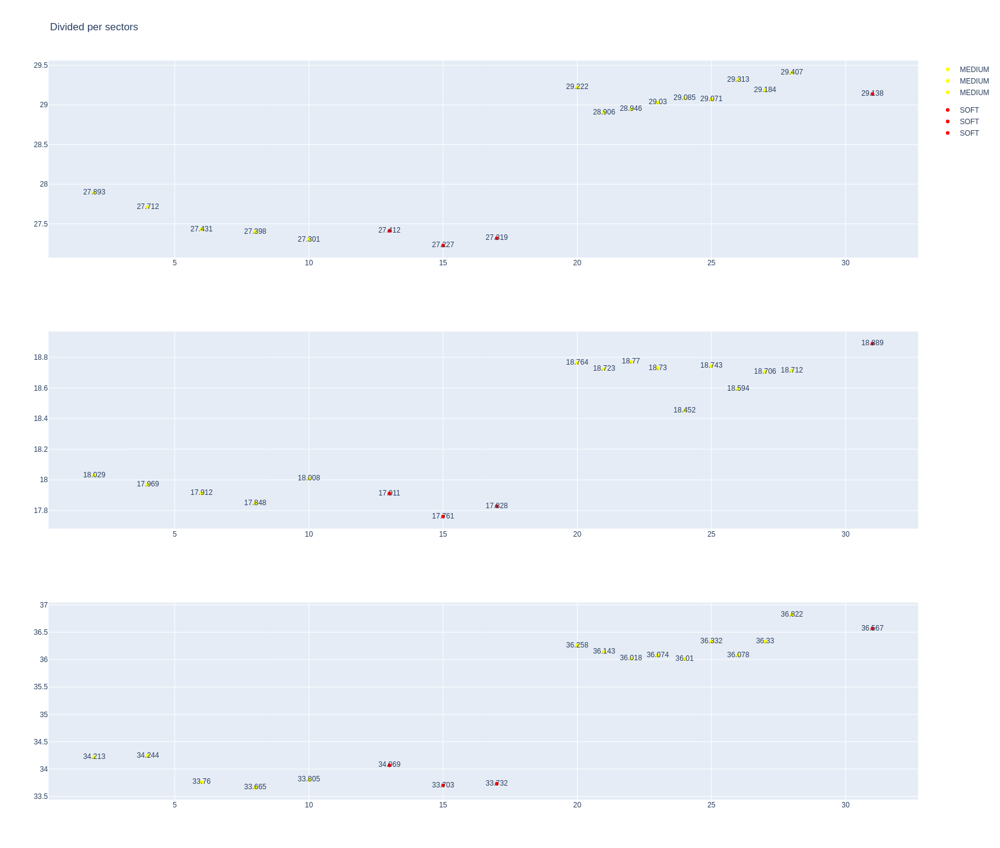

In [85]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [86]:
stintInformation.query('driver_number == 2 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1231,9482,1,23,1,1,None,NaN
7,1231,9482,1,2,1,8,MEDIUM,0.0
28,1231,9482,2,2,9,14,SOFT,0.0
50,1231,9482,3,2,15,21,SOFT,6.0
68,1231,9482,4,2,22,24,SOFT,0.0


In [87]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [88]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [89]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [90]:
data= libraryDataF1.getinfolongruns(jointables2,2,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
49,Logan SARGEANT,MEDIUM,2024-03-22T05:05:39.656000+00:00,3,27.776,17.925,34.108,79.809
86,Logan SARGEANT,MEDIUM,2024-03-22T05:08:56.586000+00:00,5,27.426,17.892,33.865,79.183
163,Logan SARGEANT,SOFT,2024-03-22T05:23:40.733000+00:00,9,27.256,17.769,33.553,78.578
208,Logan SARGEANT,SOFT,2024-03-22T05:28:40.455000+00:00,12,27.119,17.978,33.687,78.784
284,Logan SARGEANT,SOFT,2024-03-22T05:40:41.682000+00:00,15,29.091,18.667,36.193,83.951
296,Logan SARGEANT,SOFT,2024-03-22T05:42:05.807000+00:00,16,29.199,18.607,36.194,84.000
306,Logan SARGEANT,SOFT,2024-03-22T05:43:29.646000+00:00,17,34.382,18.479,36.064,88.925
319,Logan SARGEANT,SOFT,2024-03-22T05:44:58.615000+00:00,18,29.314,18.648,36.346,84.308
332,Logan SARGEANT,SOFT,2024-03-22T05:46:22.955000+00:00,19,29.157,18.407,36.641,84.205
389,Logan SARGEANT,SOFT,2024-03-22T05:50:55.847000+00:00,22,29.668,18.750,37.019,85.437


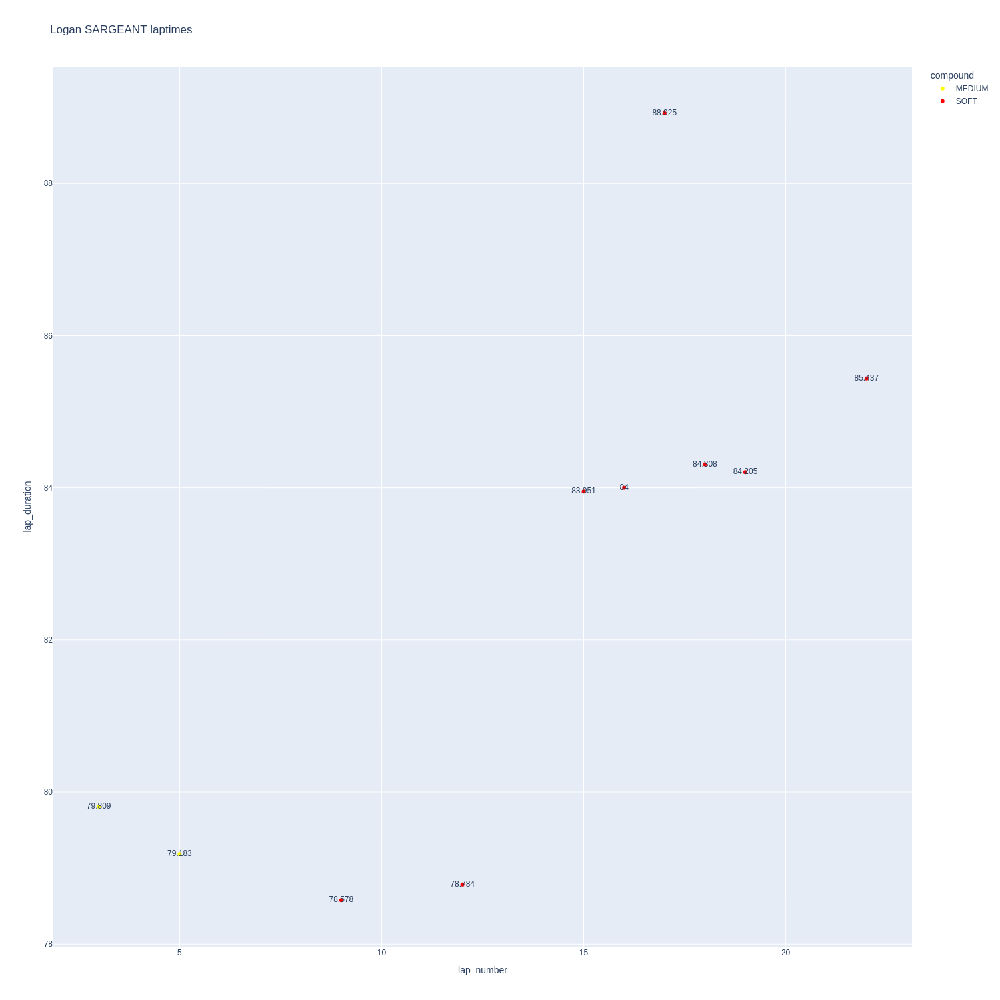

In [91]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

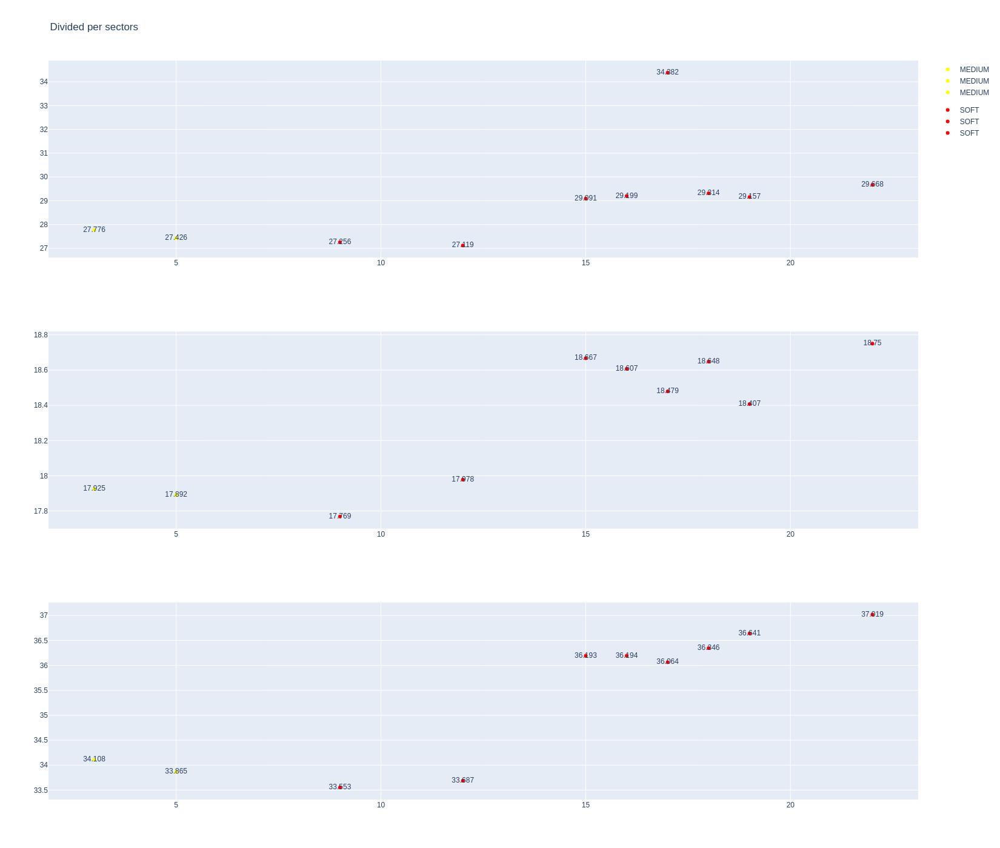

In [92]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [93]:
stintInformation.query('driver_number == 24 or driver_number == 77')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
15,1231,9482,1,24,1,10,MEDIUM,0.0
18,1231,9482,1,77,1,10,MEDIUM,0.0
35,1231,9482,2,24,11,13,SOFT,0.0
36,1231,9482,2,77,11,13,SOFT,0.0
45,1231,9482,3,77,14,15,SOFT,3.0
47,1231,9482,3,24,14,16,SOFT,3.0
54,1231,9482,4,77,16,17,SOFT,5.0
57,1231,9482,4,24,17,18,SOFT,6.0
63,1231,9482,5,77,18,33,MEDIUM,9.0
65,1231,9482,5,24,19,33,MEDIUM,9.0


In [94]:
data = libraryDataF1.getinfolongruns(jointables2,24,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
17,ZHOU Guanyu,MEDIUM,2024-03-22T05:02:06.119000+00:00,2,28.250,18.313,34.492,81.055
47,ZHOU Guanyu,MEDIUM,2024-03-22T05:05:26.731000+00:00,4,28.007,18.231,33.776,80.014
82,ZHOU Guanyu,MEDIUM,2024-03-22T05:08:41.230000+00:00,6,27.695,18.101,33.885,79.681
112,ZHOU Guanyu,MEDIUM,2024-03-22T05:11:56.448000+00:00,8,27.634,18.080,33.709,79.423
162,ZHOU Guanyu,SOFT,2024-03-22T05:23:33.874000+00:00,11,27.301,17.826,33.302,78.429
213,ZHOU Guanyu,SOFT,2024-03-22T05:29:12.955000+00:00,14,27.222,17.851,33.348,78.421
307,ZHOU Guanyu,MEDIUM,2024-03-22T05:43:34.695000+00:00,19,29.897,18.427,39.322,87.646
320,ZHOU Guanyu,MEDIUM,2024-03-22T05:45:02.239000+00:00,20,29.100,18.626,35.776,83.502
333,ZHOU Guanyu,MEDIUM,2024-03-22T05:46:25.840000+00:00,21,29.138,18.604,35.854,83.596
351,ZHOU Guanyu,MEDIUM,2024-03-22T05:47:49.484000+00:00,22,29.326,18.631,36.480,84.437


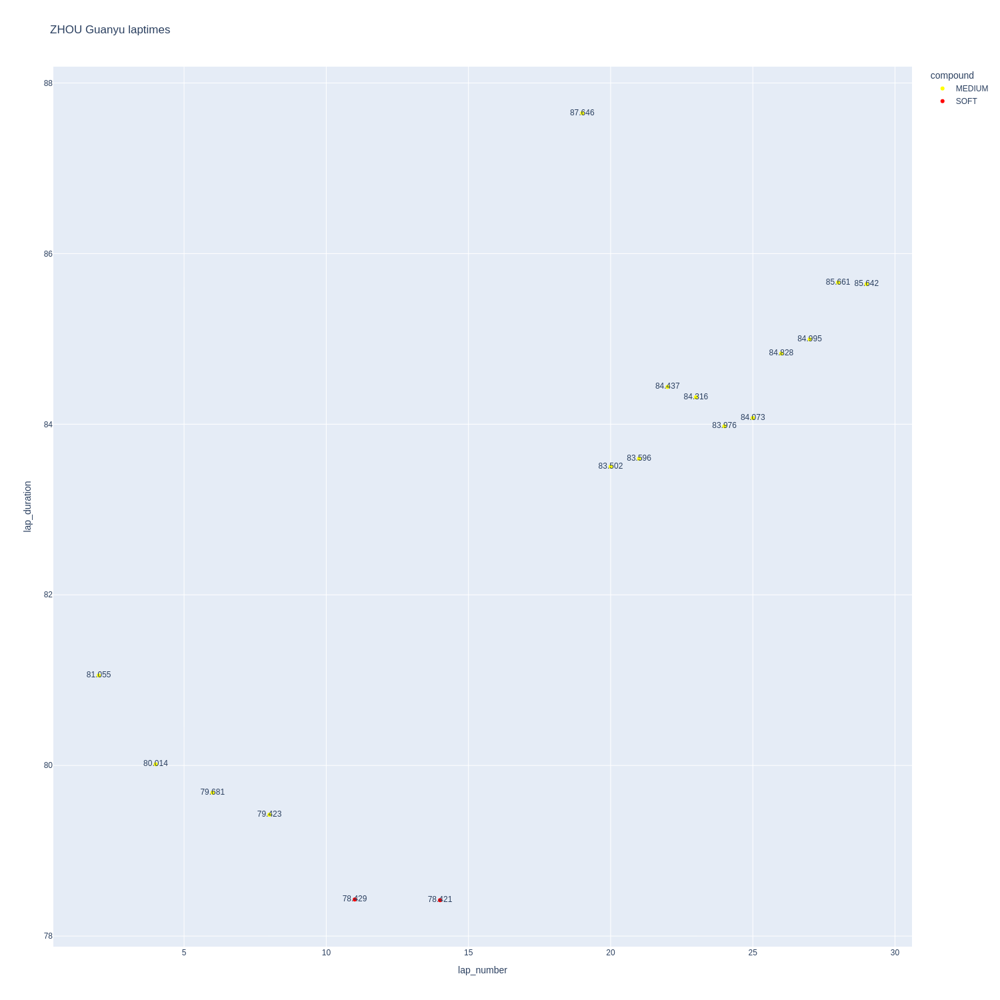

In [95]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

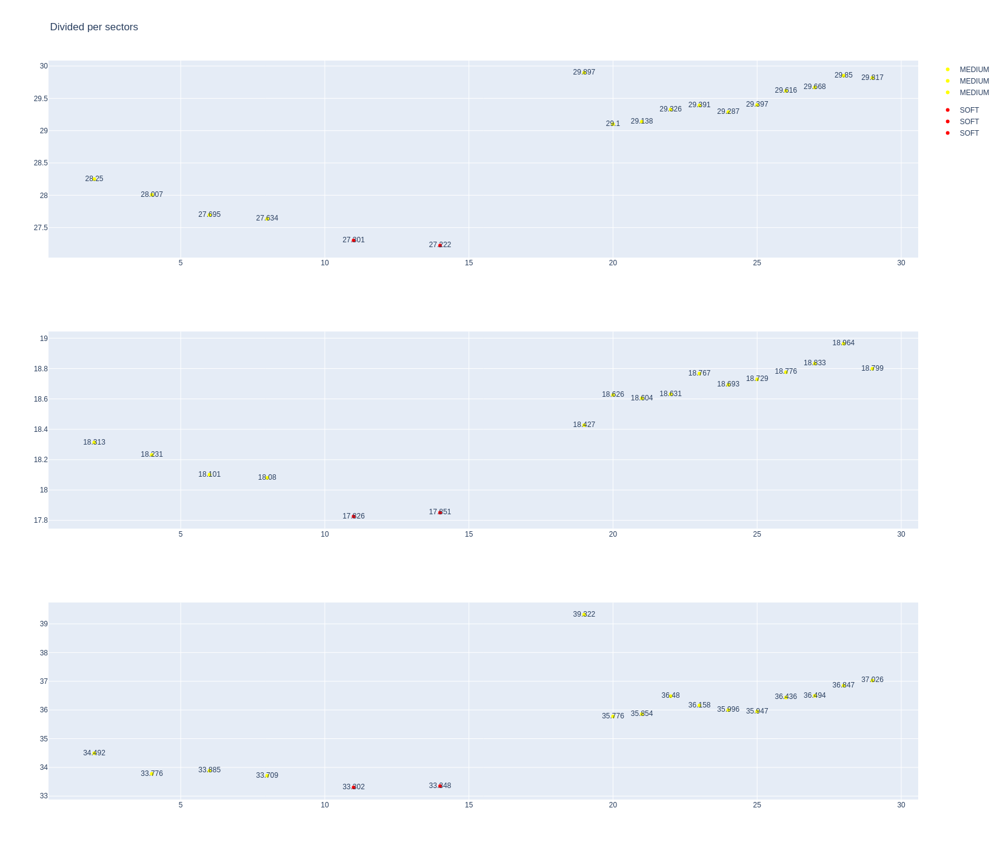

In [96]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [97]:
data = libraryDataF1.getinfolongruns(jointables2,77,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
13,Valtteri BOTTAS,MEDIUM,2024-03-22T05:01:40.826000+00:00,2,28.286,18.218,34.683,81.187
41,Valtteri BOTTAS,MEDIUM,2024-03-22T05:04:56.296000+00:00,4,27.929,18.320,34.167,80.416
74,Valtteri BOTTAS,MEDIUM,2024-03-22T05:08:01.020000+00:00,6,27.647,18.080,33.810,79.537
103,Valtteri BOTTAS,MEDIUM,2024-03-22T05:11:09.634000+00:00,8,27.548,18.027,33.759,79.334
154,Valtteri BOTTAS,SOFT,2024-03-22T05:22:27.142000+00:00,11,27.025,17.992,33.568,78.585
293,Valtteri BOTTAS,MEDIUM,2024-03-22T05:41:56.779000+00:00,18,29.025,19.231,36.027,84.283
303,Valtteri BOTTAS,MEDIUM,2024-03-22T05:43:21.033000+00:00,19,28.843,18.788,35.784,83.415
316,Valtteri BOTTAS,MEDIUM,2024-03-22T05:44:44.443000+00:00,20,29.090,18.760,35.907,83.757
329,Valtteri BOTTAS,MEDIUM,2024-03-22T05:46:08.257000+00:00,21,28.921,18.585,35.664,83.170
346,Valtteri BOTTAS,MEDIUM,2024-03-22T05:47:31.382000+00:00,22,28.961,18.759,38.183,85.903


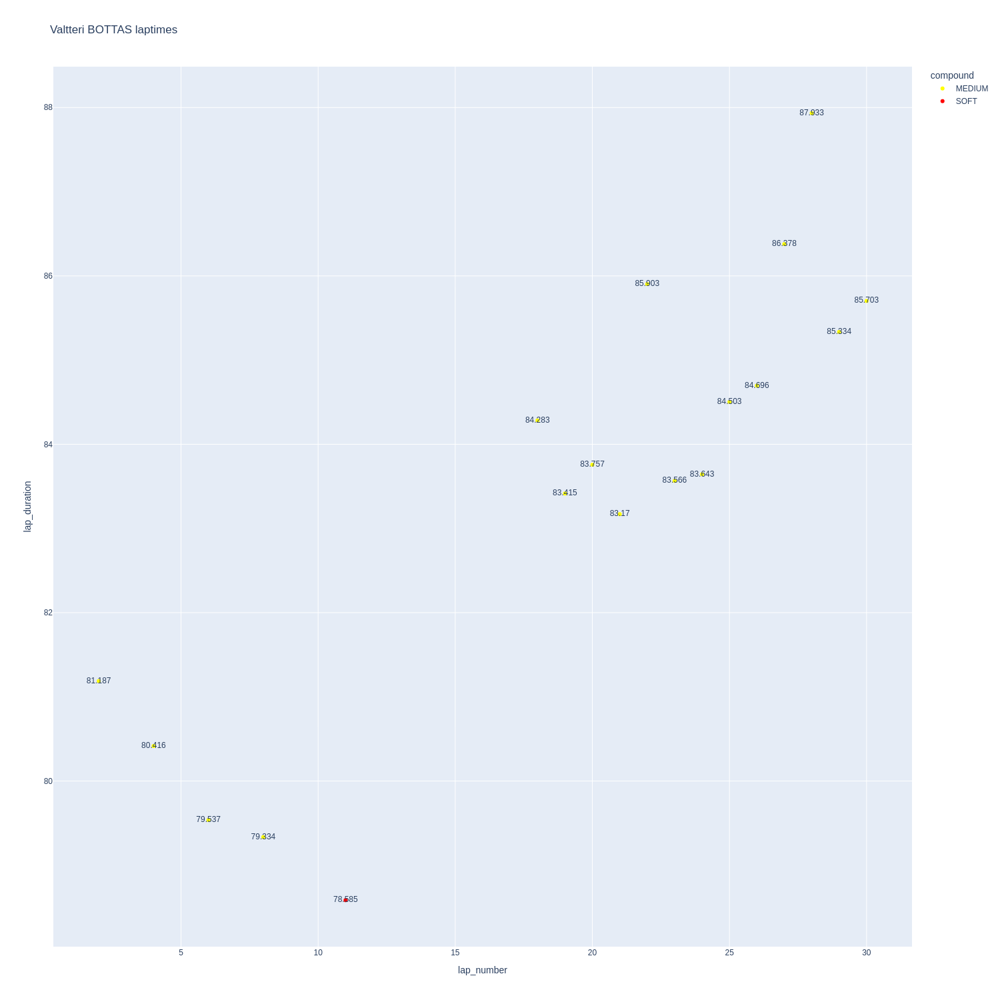

In [98]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

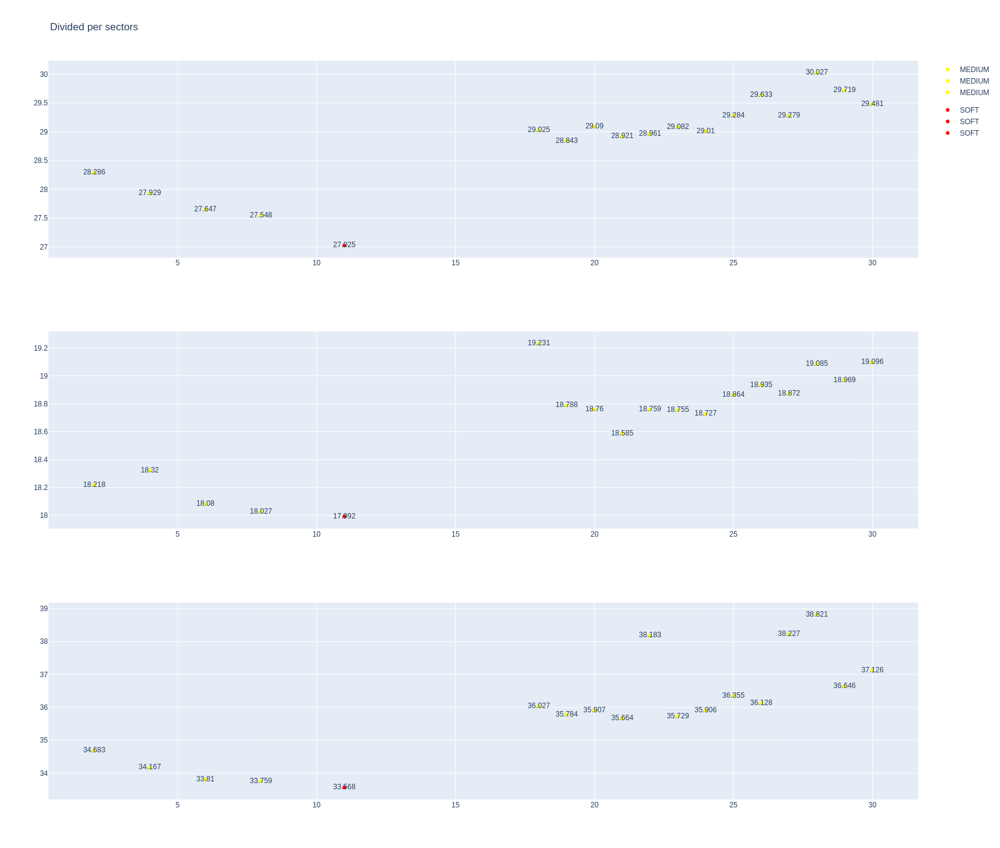

In [99]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [100]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration

In [101]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [102]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3
0,Max VERSTAPPEN,MEDIUM,80.734111,27.848556,18.136000,34.749556
7,Charles LECLERC,MEDIUM,81.787615,28.672846,18.315308,34.799462
3,Lando NORRIS,MEDIUM,81.859182,28.404273,18.253091,35.201818
4,Pierre GASLY,MEDIUM,81.953722,28.388611,18.352722,35.212389
15,Carlos SAINZ,MEDIUM,81.961929,28.341714,18.485571,35.134643
18,Oscar PIASTRI,MEDIUM,81.991944,28.524444,18.308333,35.159167
5,Sergio PEREZ,MEDIUM,82.074824,28.442294,18.287588,35.344941
16,George RUSSELL,MEDIUM,82.252091,28.335727,18.244545,35.671818
10,Yuki TSUNODA,MEDIUM,82.325714,28.512000,18.473000,35.340714
2,Daniel RICCIARDO,MEDIUM,82.438733,28.548933,18.549133,35.340667


##### Sorted by sector 1

In [103]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1
0,Max VERSTAPPEN,MEDIUM,27.848556
16,George RUSSELL,MEDIUM,28.335727
15,Carlos SAINZ,MEDIUM,28.341714
4,Pierre GASLY,MEDIUM,28.388611
3,Lando NORRIS,MEDIUM,28.404273
5,Sergio PEREZ,MEDIUM,28.442294
14,Lewis HAMILTON,MEDIUM,28.469250
8,Lance STROLL,MEDIUM,28.474118
10,Yuki TSUNODA,MEDIUM,28.512000
18,Oscar PIASTRI,MEDIUM,28.524444


##### Sorted by sector 2

In [104]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2
0,Max VERSTAPPEN,MEDIUM,18.136000
16,George RUSSELL,MEDIUM,18.244545
3,Lando NORRIS,MEDIUM,18.253091
5,Sergio PEREZ,MEDIUM,18.287588
14,Lewis HAMILTON,MEDIUM,18.291250
18,Oscar PIASTRI,MEDIUM,18.308333
1,Logan SARGEANT,SOFT,18.312200
7,Charles LECLERC,MEDIUM,18.315308
4,Pierre GASLY,MEDIUM,18.352722
8,Lance STROLL,MEDIUM,18.424824


##### Sorted by sector 3

In [105]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3
0,Max VERSTAPPEN,MEDIUM,34.749556
7,Charles LECLERC,MEDIUM,34.799462
15,Carlos SAINZ,MEDIUM,35.134643
18,Oscar PIASTRI,MEDIUM,35.159167
3,Lando NORRIS,MEDIUM,35.201818
4,Pierre GASLY,MEDIUM,35.212389
2,Daniel RICCIARDO,MEDIUM,35.340667
10,Yuki TSUNODA,MEDIUM,35.340714
5,Sergio PEREZ,MEDIUM,35.344941
1,Logan SARGEANT,SOFT,35.367000


#### Long runs mean

In [106]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [107]:
libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
0,M VERSTAPPEN,81.606
3,L NORRIS,82.230
4,P GASLY,82.401
7,C LECLERC,82.594
18,O PIASTRI,82.610
15,C SAINZ,82.650
10,Y TSUNODA,82.961
5,S PEREZ,82.965
2,D RICCIARDO,83.015
14,L HAMILTON,83.072


In [108]:
libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
1,L SARGEANT,83.524


In [109]:
libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time


## Free Practice 3
### Obtain setup

In [110]:
practice = libraryDataF1.obtain_information('laps',session_key=9483)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9483)
drivers = libraryDataF1.obtain_information('drivers',session_key=9483)

In [111]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

In [112]:
session = ff1.get_session(2024, 3, 'FP3')
session.load();

req         WARNING 	DEFAULT CACHE ENABLED! (1.44 GB) /home/frank/.cache/fastf1
core           INFO 	Loading data for Australian Grand Prix - Practice 3 [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for _extended_timing_data. Loading data...
_api           INFO 	Fetch

### Speed trap

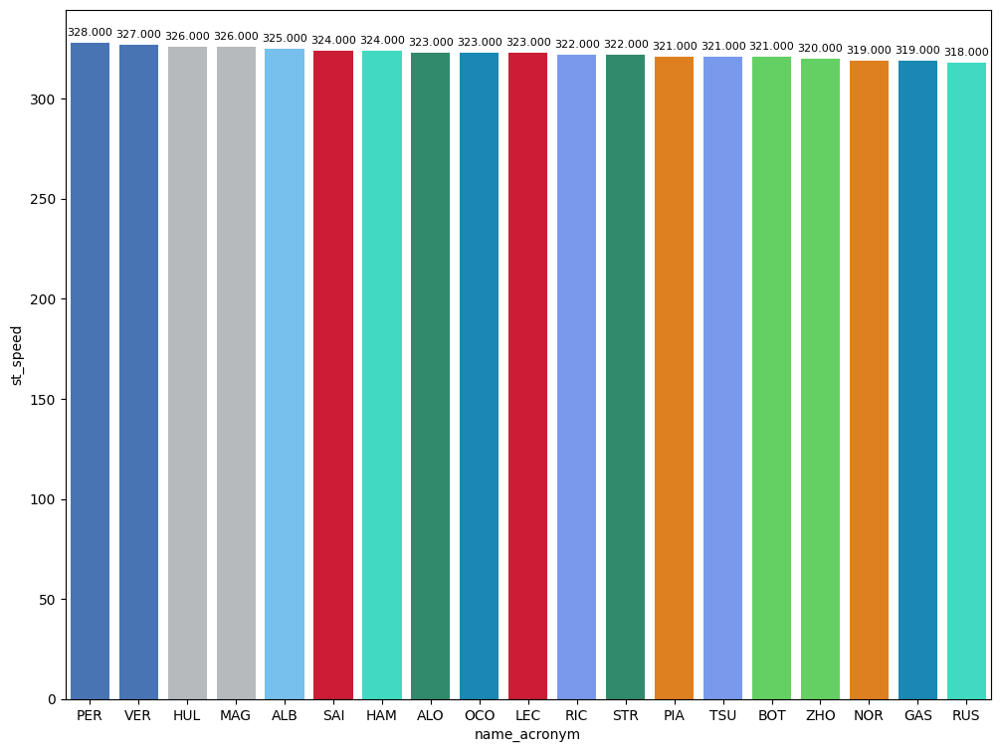

In [113]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

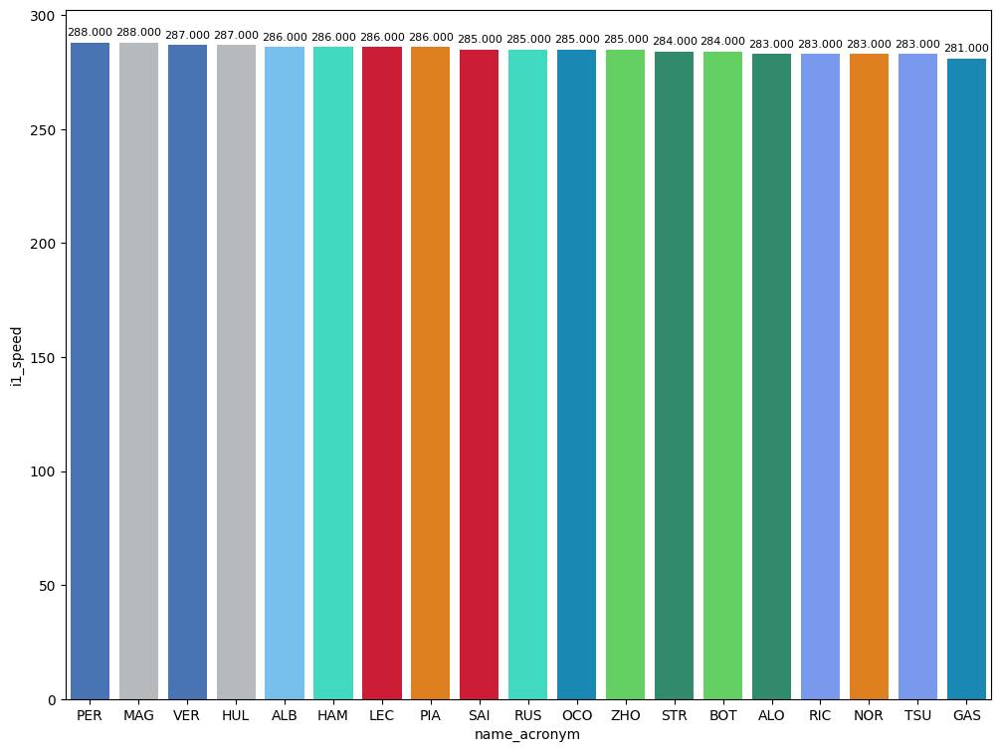

In [114]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

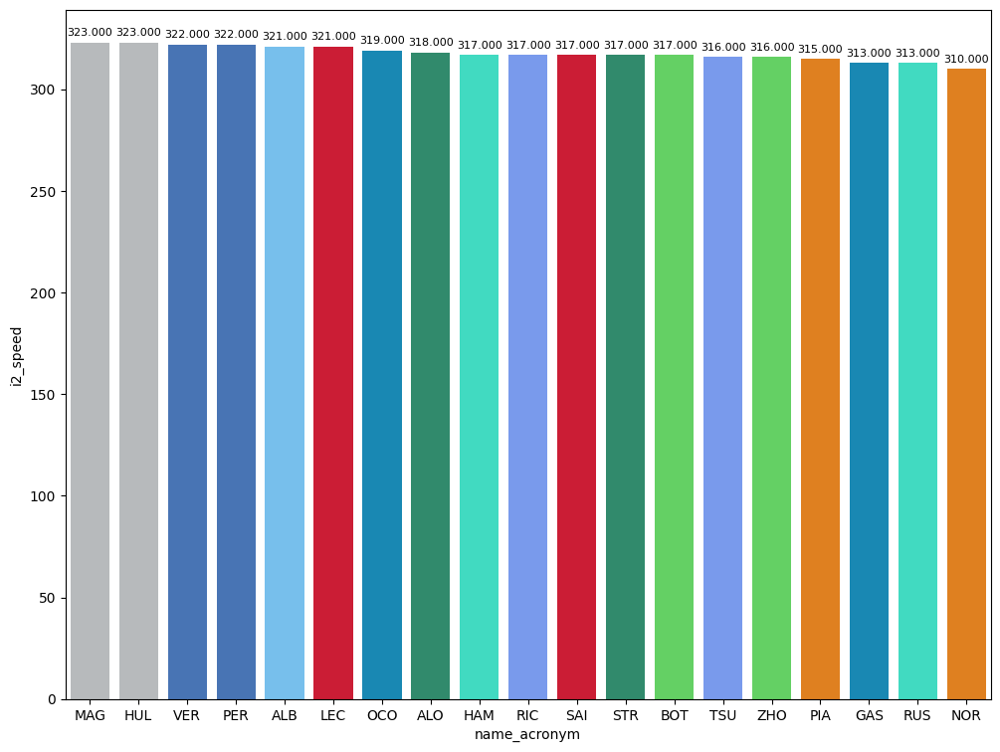

In [115]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [116]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
58,Valtteri BOTTAS,HARD,37.756,19.030,37.126,93.912
51,Carlos SAINZ,MEDIUM,26.703,17.584,32.504,76.791
360,Charles LECLERC,SOFT,26.715,17.434,32.565,76.714


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [117]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


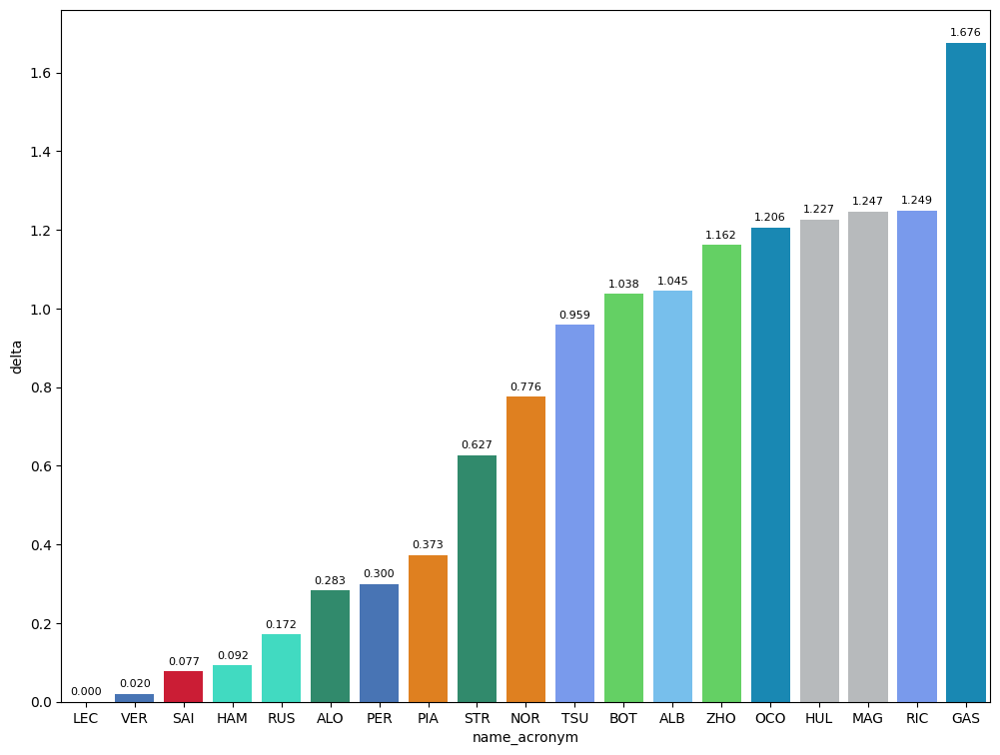

In [118]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

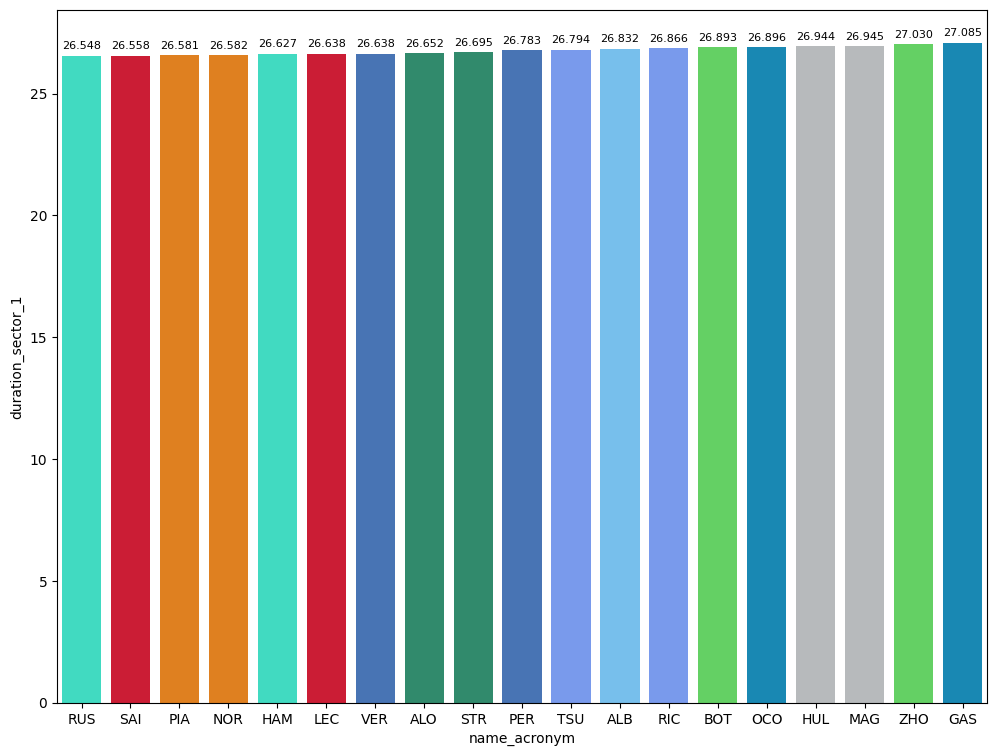

In [119]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

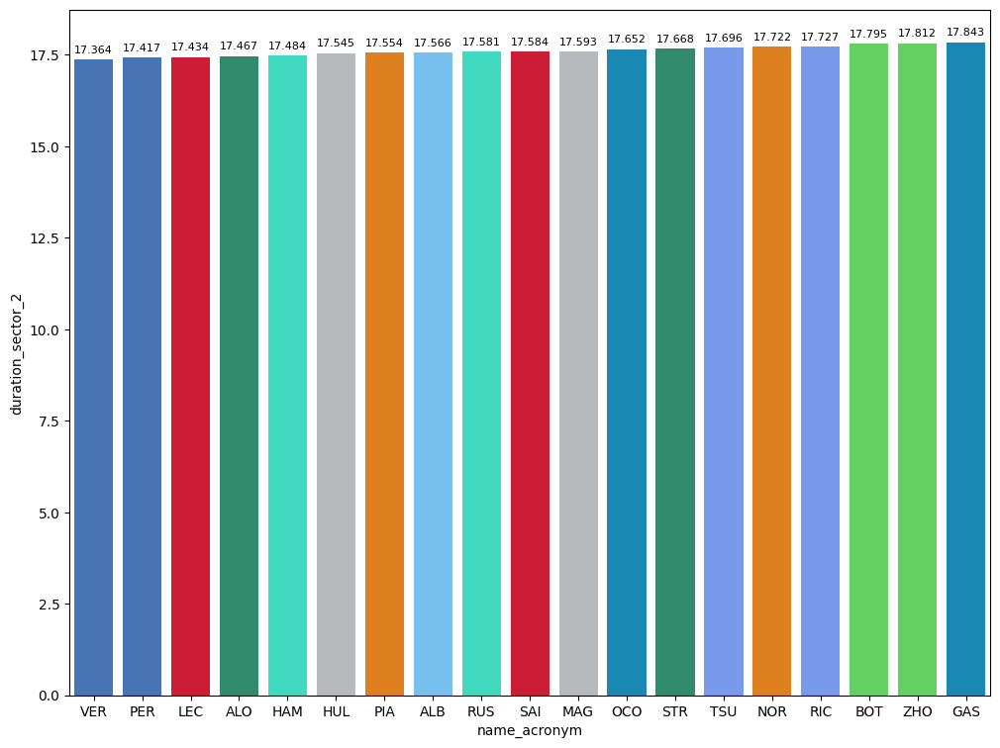

In [120]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

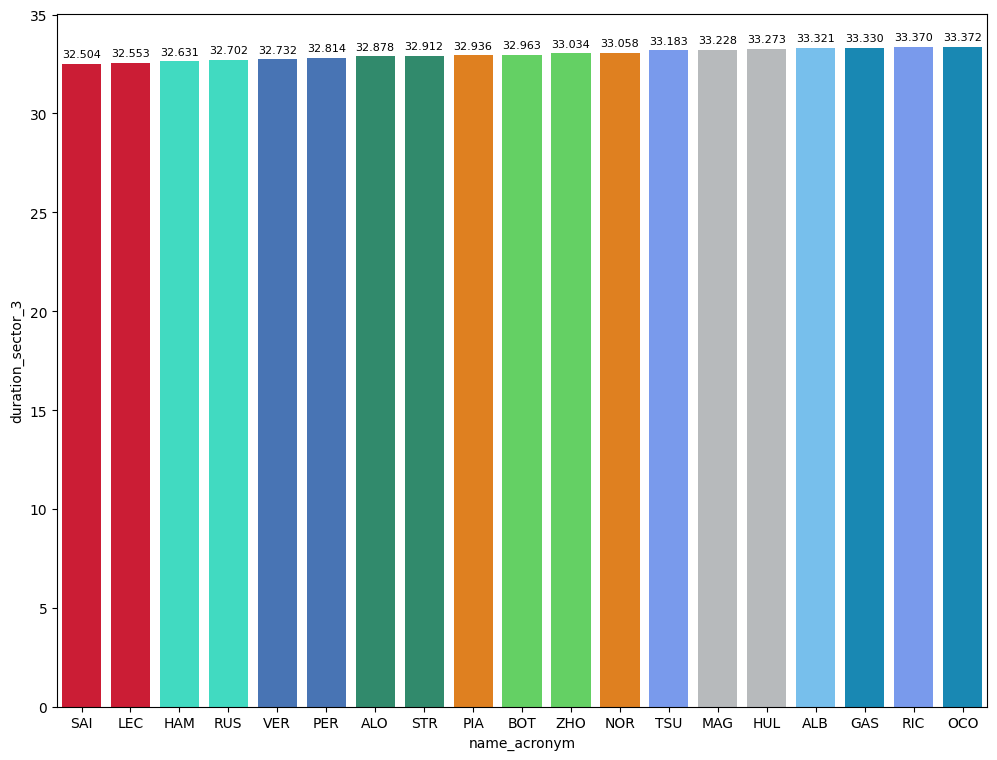

In [121]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [122]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 108").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
MEDIUM,82.044581
SOFT,85.233478


### Comparaison between the poleman and the second

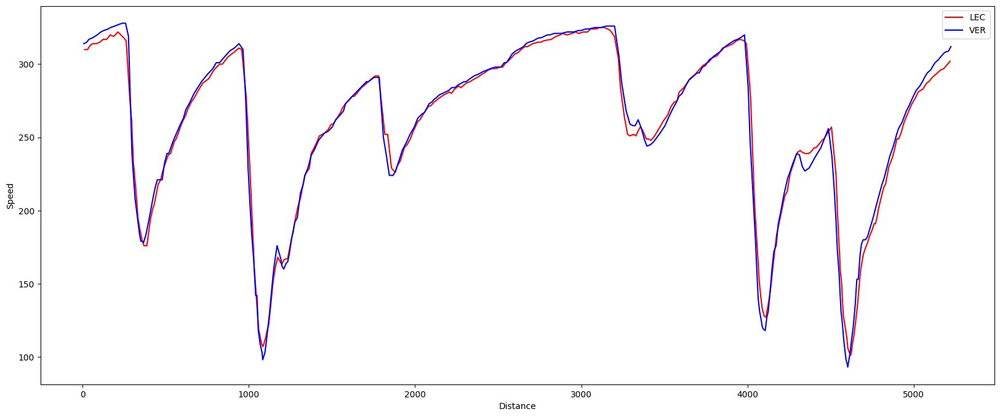

In [124]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

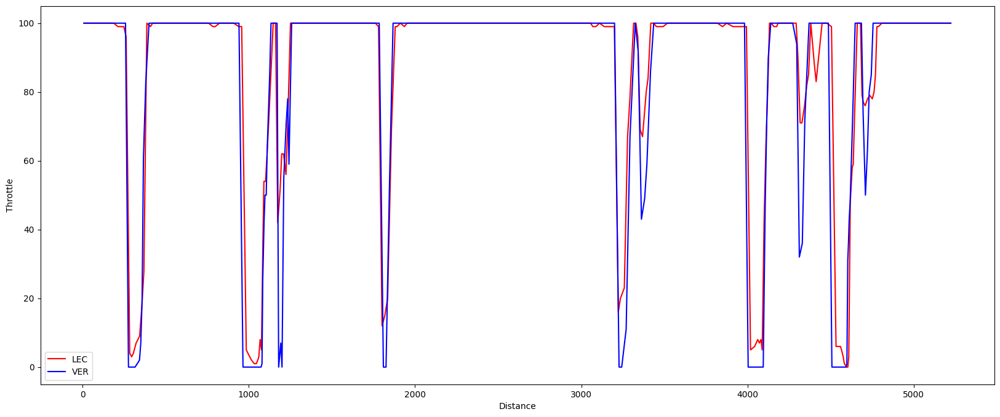

In [125]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

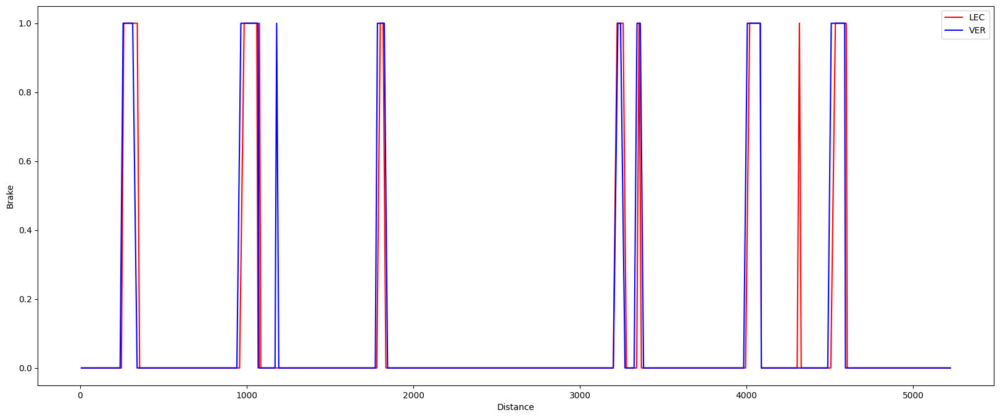

In [126]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

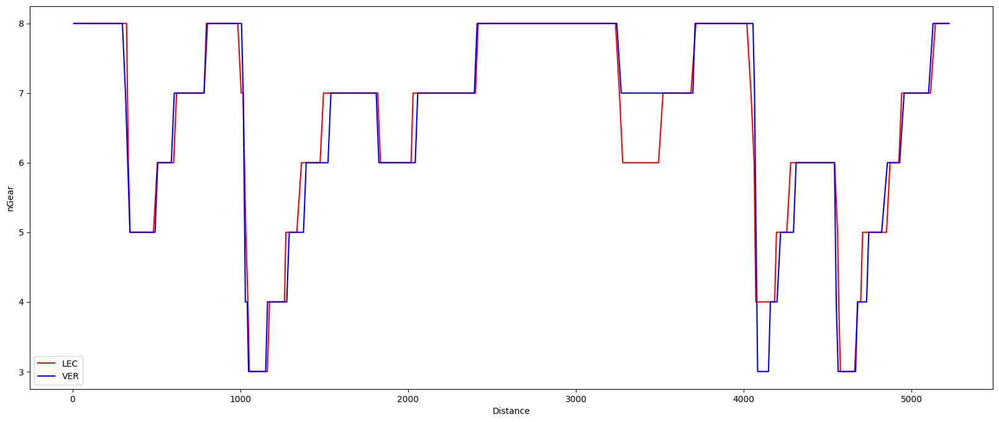

In [127]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session.

In [128]:
libraryDataF1.obtain_information('race_control',session_key=9484)

,session_key,meeting_key,date,category,flag,lap_number,message,driver_number,scope,sector
0,9484,1231,2024-03-23T04:45:13+00:00,Other,None,None,RISK OF RAIN FOR F1 QUALIFYING SESSION IS 0 %,NaN,None,NaN
1,9484,1231,2024-03-23T04:48:45+00:00,Other,None,None,DRS ENABLED IN ZONE 2,NaN,None,NaN
2,9484,1231,2024-03-23T05:00:01+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,NaN,Track,NaN
3,9484,1231,2024-03-23T05:03:21+00:00,Other,None,None,CAR 23 (ALB) TIME 1:18.709 DELETED - TRACK LIM...,NaN,None,NaN
4,9484,1231,2024-03-23T05:04:37+00:00,Other,None,None,TURN 13 INCIDENT INVOLVING CARS 11 (PER) AND 2...,NaN,None,NaN
5,9484,1231,2024-03-23T05:05:40+00:00,Other,None,None,FIA STEWARDS: TURN 13 INCIDENT INVOLVING CARS ...,NaN,None,NaN
6,9484,1231,2024-03-23T05:11:01+00:00,Other,None,None,INCIDENT INVOLVING CAR 10 (GAS) NOTED - FAILIN...,NaN,None,NaN
7,9484,1231,2024-03-23T05:12:14+00:00,Other,None,None,FIA STEWARDS: INCIDENT INVOLVING CAR 10 (GAS) ...,NaN,None,NaN
8,9484,1231,2024-03-23T05:18:00+00:00,Flag,CHEQUERED,None,CHEQUERED FLAG,NaN,Track,NaN
9,9484,1231,2024-03-23T05:18:07+00:00,Other,None,None,FIRST CAR TO TAKE THE FLAG - CAR 24 (ZHO),NaN,None,NaN


### Obtain setup

In [129]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9484)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9484)
drivers = libraryDataF1.obtain_information('drivers',session_key=9484)
libraryDataF1.obtain_drivers_colours(drivers)

In [130]:
session = ff1.get_session(2024, 3, 'Q')
session.load()
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

core           INFO 	Loading data for Australian Grand Prix - Qualifying [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for _extended_timing_data. Loading data...
_api           INFO 	Fetching timing data...
_api           INFO 	Parsing timing data...
req            IN

To obtain a better analysis, those laptimes deleted will be removed from this analysis in order to obtain the data with valid values. So that,taking into account the race control table, it will be neccesary to consult the qualyfing data to obtain the ids. 

In [131]:
qualyfing = qualyfing.drop(131)

In [132]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)
bestlap[0:1]

,meeting_key,session_key,driver_number,i1_speed,i2_speed,st_speed,date_start,lap_duration,is_pit_out_lap,duration_sector_1,duration_sector_2,duration_sector_3,segments_sector_1,segments_sector_2,segments_sector_3,lap_number
297,1231,9484,1,288.0,320,326,2024-03-23T05:58:15.936000+00:00,75.915,False,26.262,17.315,32.338,"[2048, 2048, 2051, 2051, 2049, 2048, 2049, 204...","[2049, 2049, 2049, 2049, 2048]","[2048, 2048, 2048, 2048, 2048, 2048, 2064, 2064]",20


In this case, the fastest lap is 89.165 seconds (1.29.165= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 (95.406 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [133]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration < 95.406")
competitiveLaps

,meeting_key,session_key,driver_number,i1_speed,i2_speed,st_speed,date_start,lap_duration,is_pit_out_lap,duration_sector_1,duration_sector_2,duration_sector_3,segments_sector_1,segments_sector_2,segments_sector_3,lap_number
10,1231,9484,23,285.0,318,321,2024-03-23T05:01:46.155000+00:00,78.709,False,27.200,17.684,33.825,"[2049, 2049, 2049, 2049, 2049, 2049, 2049, 205...","[2049, 2051, 2049, 2049, 2049]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 0]",2
11,1231,9484,31,258.0,300,288,2024-03-23T05:01:51.490000+00:00,86.962,False,31.251,19.380,36.331,"[2049, 2049, 2049, 2049, 2049, 2049, 2049, 204...","[2049, 2049, 2049, 2049, 2049]","[2049, 2049, 2049, 2049, 2049, 2049, 2049, 2048]",2
12,1231,9484,10,NaN,303,291,2024-03-23T05:01:57.423000+00:00,90.475,False,30.104,19.380,40.991,"[2049, 2049, 2049, 2049, 2049, 2049, 2049, 204...","[2049, 2048, 2048, 2049, 2048]","[2049, 2049, 2049, 2049, 2049, 2049, 2048, 2048]",2
13,1231,9484,27,286.0,325,324,2024-03-23T05:02:04.376000+00:00,77.992,False,27.126,17.544,33.322,"[2049, 2049, 2049, 2051, 2051, 2049, 2049, 204...","[2049, 2049, 2051, 2051, 2051]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 2049]",2
15,1231,9484,20,286.0,322,324,2024-03-23T05:02:11.849000+00:00,77.874,False,27.008,17.637,33.229,"[2049, 2049, 2049, 2049, 2049, 2049, 2049, 204...","[2049, 2049, 2049, 2049, 2049]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048]",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,1231,9484,4,287.0,315,320,2024-03-23T05:58:43.932000+00:00,76.315,False,26.393,17.367,32.555,"[2049, 2049, 2049, 2049, 2048, 2048, 2048, 205...","[2049, 2051, 2049, 2049, 2049]","[2048, 2048, 2048, 2048, 2048, 2048, 2052, 0]",18
302,1231,9484,63,286.0,314,320,2024-03-23T05:58:51.222000+00:00,76.724,False,26.501,17.502,32.721,"[None, 2049, 2049, 2049, 2048, 2049, 2048, 204...","[2048, 2049, 2048, 2049, 2048]","[2048, 2048, 2048, 2048, 2048, 2048, 2052, 0]",22
304,1231,9484,18,285.0,317,324,2024-03-23T05:59:06.666000+00:00,77.072,False,26.513,17.505,33.054,"[2049, 2049, 2048, 2048, 2048, 2049, 2048, 204...","[2048, 2048, 2049, 2049, 2049]","[2048, 2048, 2048, 2048, 2048, 2048, 2052, 0]",22
305,1231,9484,22,286.0,317,322,2024-03-23T05:59:14.097000+00:00,76.788,False,26.513,17.507,32.768,"[2049, 2049, 2049, 2049, 2049, 2049, 2049, 204...","[2049, 2049, 2049, 2049, 2049]","[2048, 2048, 2048, 2048, 2048, 2048, 2052, 0]",17


In [134]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
In this chart we can see the deltas with compared with the fastest lap of the session that it could be different than the pole. In this case, this happened with Leclerc taking the best time but not taking the pole because his cest time in Q3 was not the best time of the session.

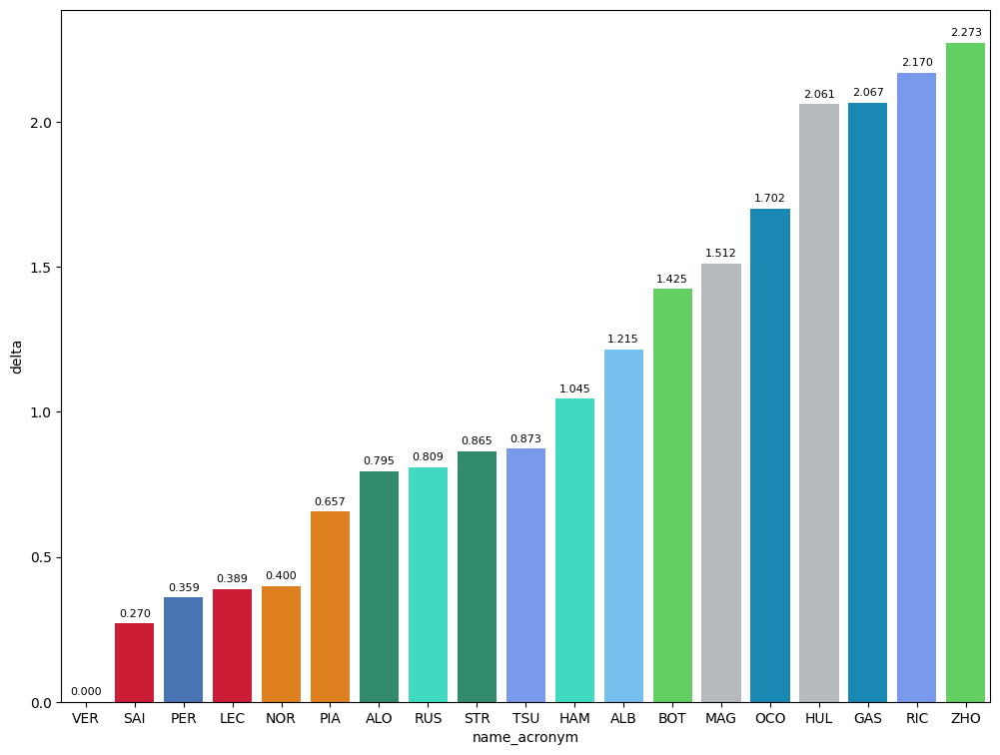

In [135]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap

#### Maximum speed per drivers

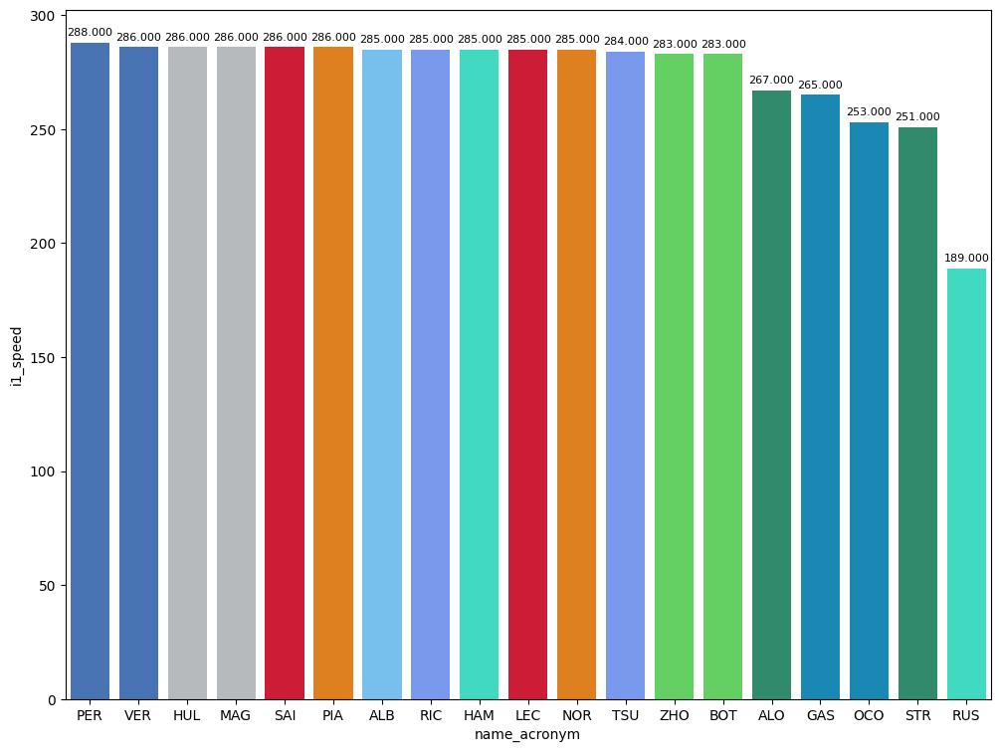

In [136]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

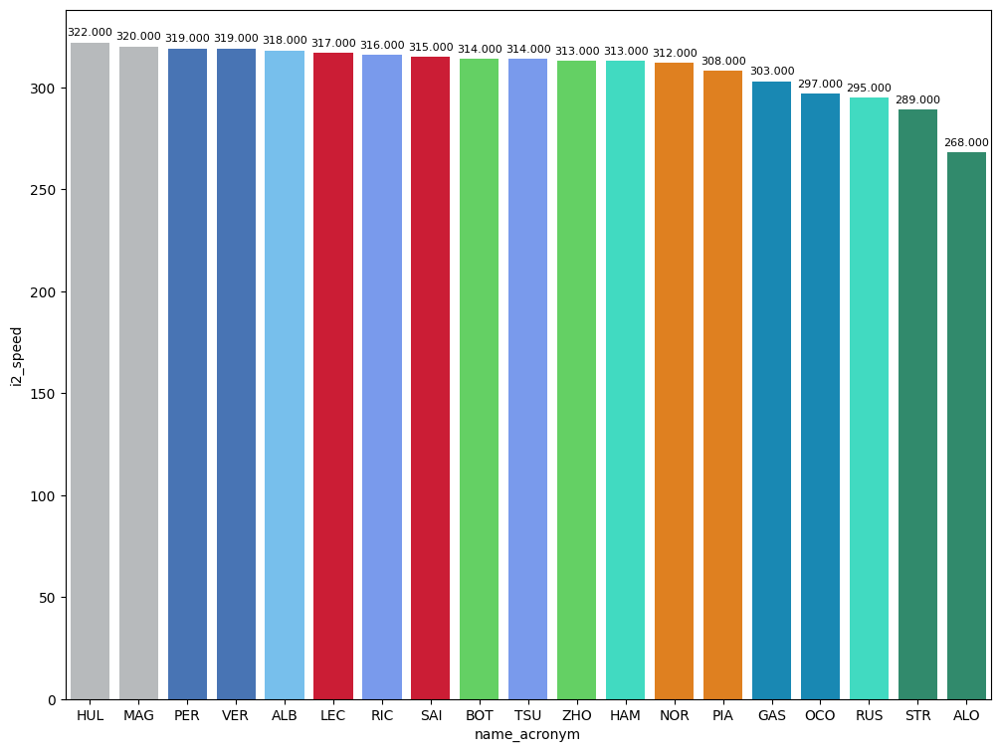

In [137]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

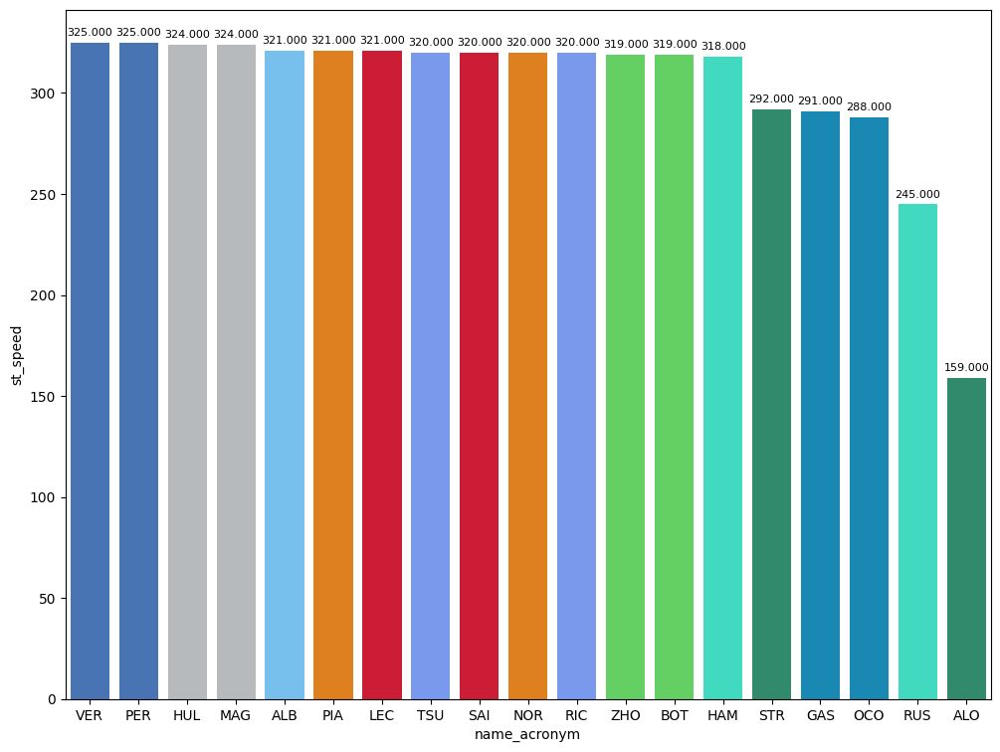

In [138]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

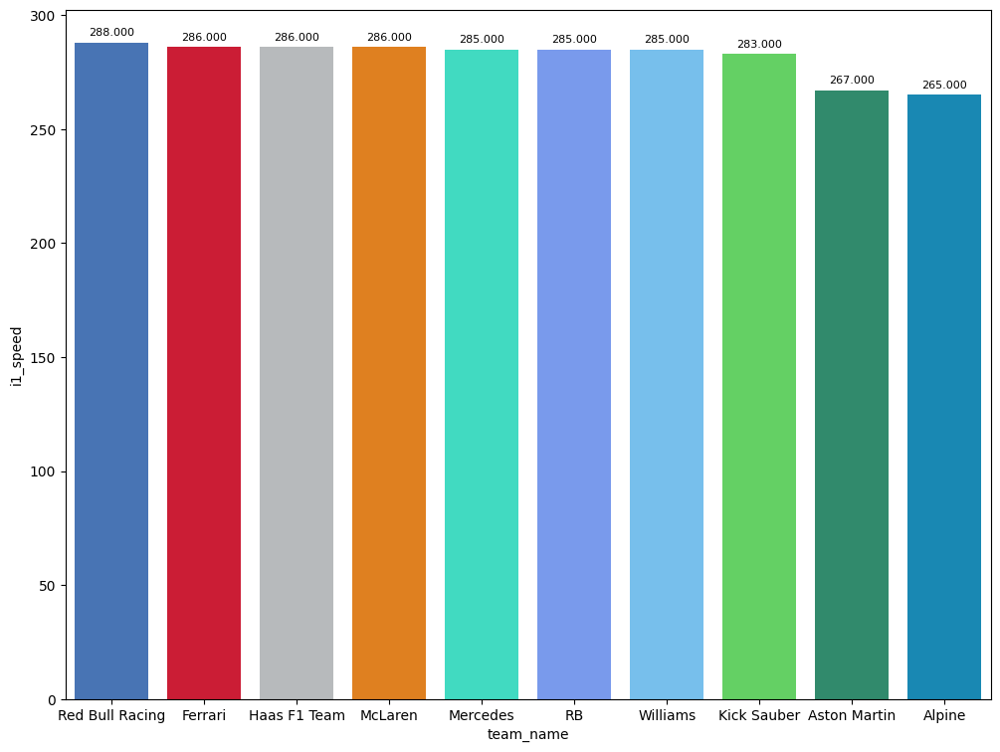

In [139]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

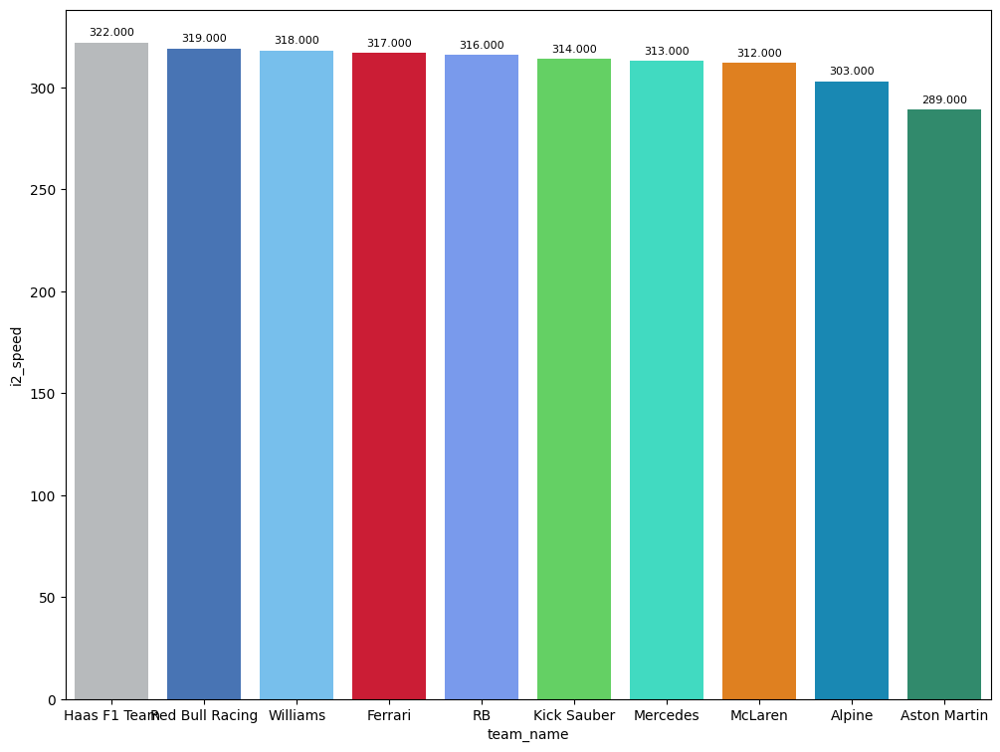

In [140]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

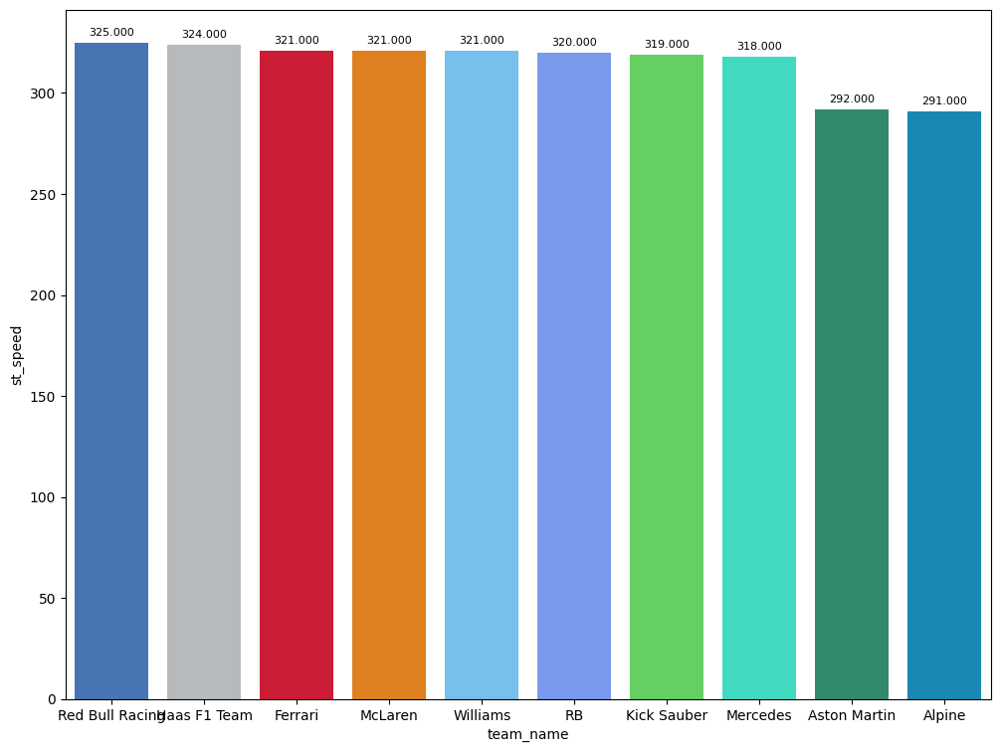

In [141]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [142]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [143]:
maximumDateQ1 = "date_start <'2024-03-23T05:25:01+00:00'"
maximumDateQ2 = "date_start <'2024-03-23T05:48:01+00:00' and date_start >'2024-03-23T05:25:01+00:00'"
maximumDateQ3 = "date_start >'2024-03-23T05:48:01+00:00'"

### Qualyfing 1
In this session, I did not see any surprise with the favourites qualyfing to Q2. As we can in testing, we knew that Alpine was the worst team and that was constrasted in qualyfing finishing P19 and P20. Other team that finished out of Q1 was Kick Sauber finishing Zhou P17 and Bottas P16. Differences beetween sectors will be shown in the following section.

In [144]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will do a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [145]:
#Reference
P15 = q1Data[14:15]

In [146]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Kevin MAGNUSSEN Sector 1:  26.823 Sector 2:  17.531 Sector 3:  33.355


In [147]:
q1Data[15::]

,meeting_key_x,session_key_x,driver_number,i1_speed,i2_speed,st_speed,date_start,lap_duration,is_pit_out_lap,duration_sector_1,...,broadcast_name,country_code,first_name,full_name,headshot_url,last_name,team_colour,team_name,name_acronym,isFastestLap
21,1231,9484,27,289.0,322,324,2024-03-23T05:16:03.388000+00:00,77.976,False,26.782,...,N HULKENBERG,GER,Nico,Nico HULKENBERG,https://media.formula1.com/d_driver_fallback_i...,Hulkenberg,B6BABD,Haas F1 Team,HUL,True
17,1231,9484,10,286.0,317,322,2024-03-23T05:12:14.932000+00:00,77.982,False,26.917,...,P GASLY,FRA,Pierre,Pierre GASLY,https://media.formula1.com/d_driver_fallback_i...,Gasly,0093CC,Alpine,GAS,True
110,1231,9484,3,285.0,316,320,2024-03-23T05:07:30.243000+00:00,78.085,False,27.054,...,D RICCIARDO,AUS,Daniel,Daniel RICCIARDO,https://media.formula1.com/d_driver_fallback_i...,Ricciardo,6692FF,RB,RIC,True
32,1231,9484,24,285.0,313,322,2024-03-23T05:07:52.638000+00:00,78.188,False,26.991,...,G ZHOU,CHN,Guanyu,ZHOU Guanyu,https://media.formula1.com/d_driver_fallback_i...,Zhou,52E252,Kick Sauber,ZHO,True


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
As Ricciardo's best lap was deleted, Magnussen qualified to Q2 but, as I only use the valid lap, I will analyse Magnussen's laptime compared to the eliminated drivers.
Once said this one, we can see that the gap with the eliminated drivers is enough to determine that Magnussen was at risk.

In [148]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,27,0.267,-0.041,0.086,0.222,HUL
1,10,0.273,0.094,0.101,0.078,GAS
2,3,0.376,0.231,0.220,-0.075,RIC
3,24,0.479,0.168,0.413,-0.102,ZHO


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



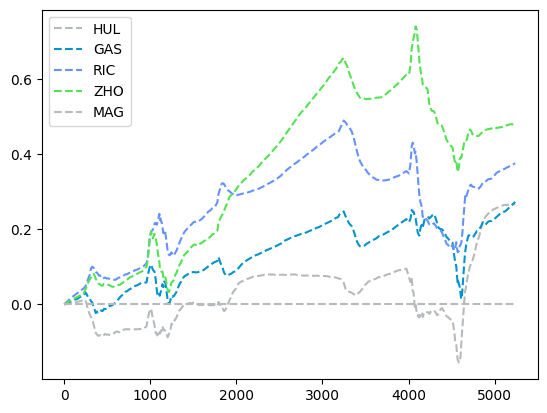

In [149]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
Magnussen's laptime was good in the first and second sector being better than others drivers such as Norris and Hamilton but, his third sector was so slow such as degree that the drivers that were worse laptimes were able to finish in a better postion than the Danish driver.

In [150]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,55,-0.978,-0.119,0.029,-0.888,SAI
1,11,-0.904,-0.144,-0.050,-0.710,PER
2,1,-0.890,-0.278,-0.027,-0.585,VER
3,16,-0.725,0.065,-0.005,-0.785,LEC
4,14,-0.718,-0.185,-0.012,-0.521,ALO
5,63,-0.647,-0.213,0.018,-0.452,RUS
6,23,-0.579,-0.180,0.033,-0.432,ALB
7,22,-0.353,-0.147,0.145,-0.351,TSU
8,81,-0.340,0.008,0.032,-0.380,PIA
9,18,-0.333,-0.124,0.174,-0.383,STR


#### Best sector per driver
In this section we can see the best sector of the session

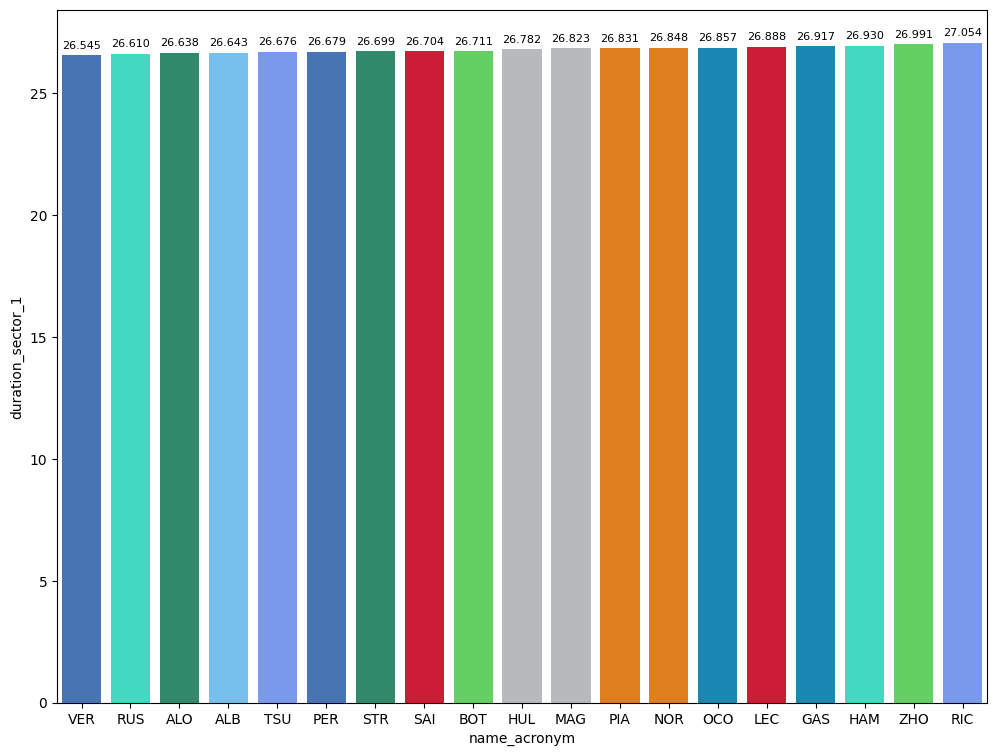

In [151]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

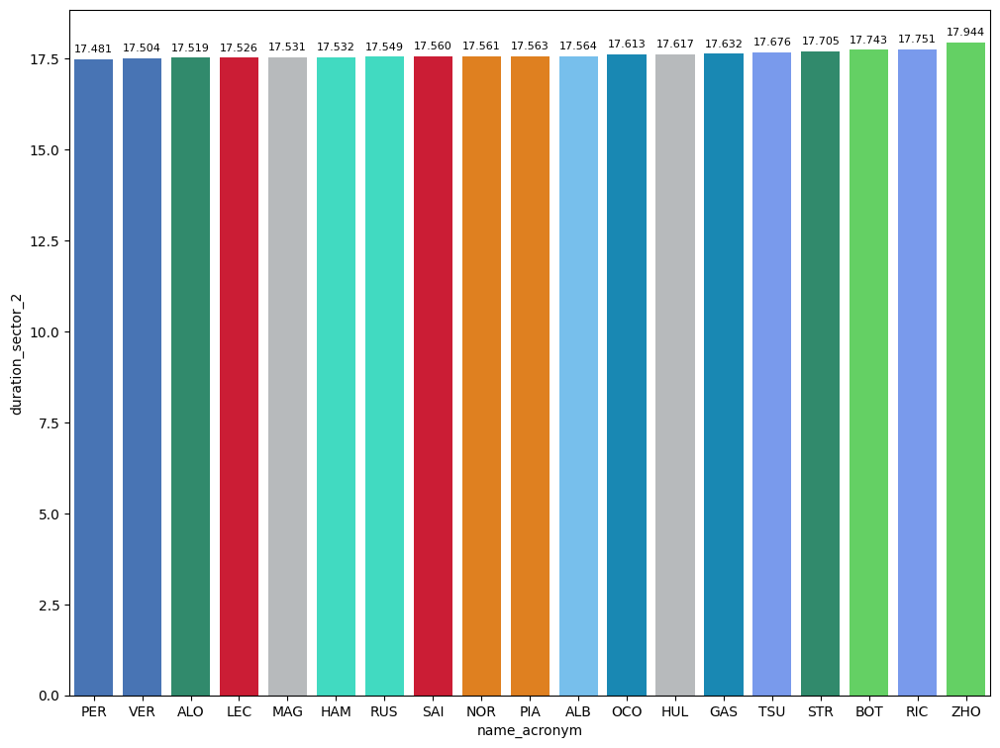

In [152]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

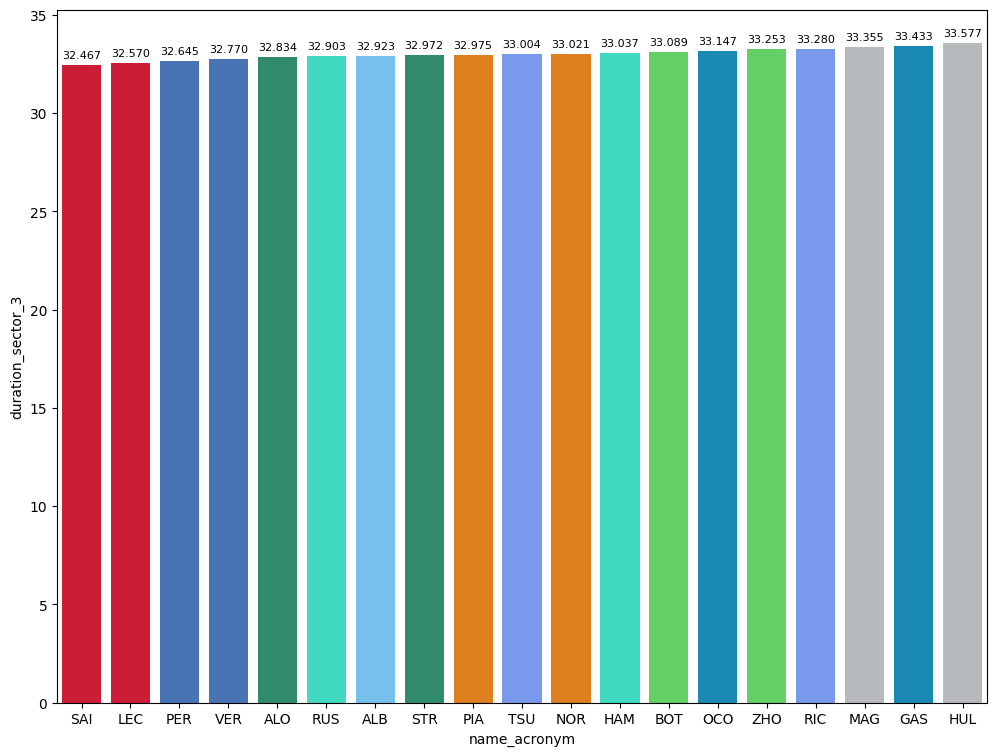

In [153]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 2
In this session, we had the surprise of the fall of Mercedes being Hamilton knocked-out of Q2 and Russell finishing P10. Also, I have to stand out Tsunoda laptime that was able to beat both Mercedes in this session.

In [154]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [155]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: George RUSSELL Sector 1:  26.644 Sector 2:  17.568 Sector 3:  32.689


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
The third sector of Russell was enough to save him to be eliminated. In general, only Hamilton and Albon would have been able to eliminate Russell
In case of Hamilton, after finishing the second sector, he was 0.16 seconds quicker than Russell.
In case of Albon, his second sector was better than Russell being very close to British's laptime (0.19 second worse than Russell) but he lost his chances with a poor third sector, being almost 3 tenth behind Russell

In [156]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,44,0.059,0.076,-0.092,0.075,HAM
1,23,0.266,0.041,-0.022,0.247,ALB
2,77,0.439,0.126,0.036,0.277,BOT
3,20,0.526,0.124,0.007,0.395,MAG
4,31,0.796,0.255,0.013,0.528,OCO


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: Futur

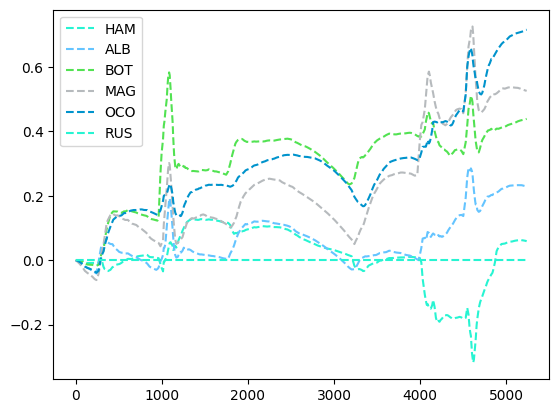

In [157]:
libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
Mercedes suffered a lot in this weekend only being better than his rivals in the third sector.

In [158]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,55,-0.712,-0.343,-0.033,-0.336,SAI
1,16,-0.597,-0.257,-0.145,-0.195,LEC
2,1,-0.514,-0.167,-0.140,-0.207,VER
3,81,-0.300,-0.224,-0.080,0.004,PIA
4,11,-0.270,-0.011,-0.156,-0.103,PER
5,14,-0.191,-0.067,-0.111,-0.013,ALO
6,4,-0.151,-0.211,-0.076,0.136,NOR
7,18,-0.121,-0.198,-0.122,0.199,STR
8,22,-0.110,-0.086,-0.049,0.025,TSU


#### Best sector per driver
In this section we can see the best sector of the session

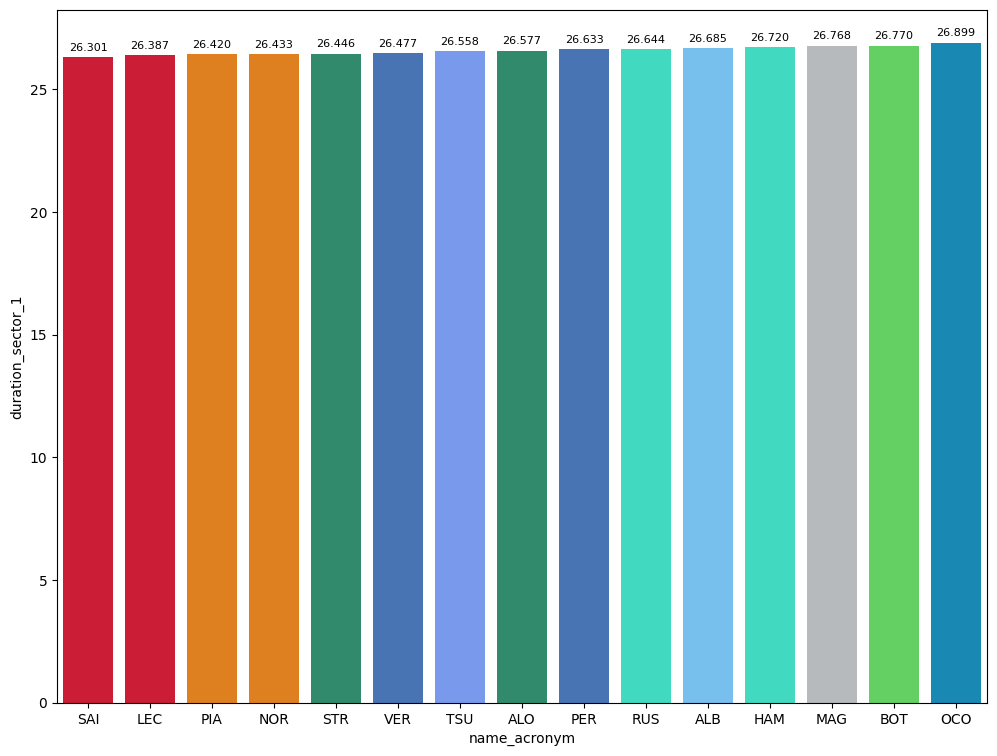

In [159]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

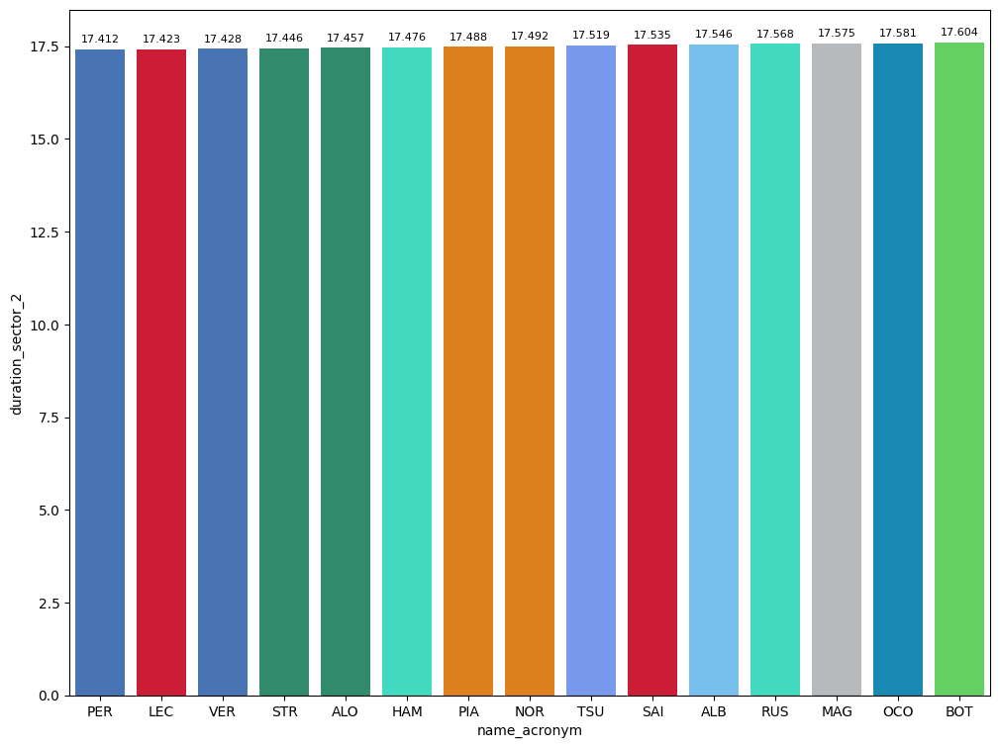

In [160]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

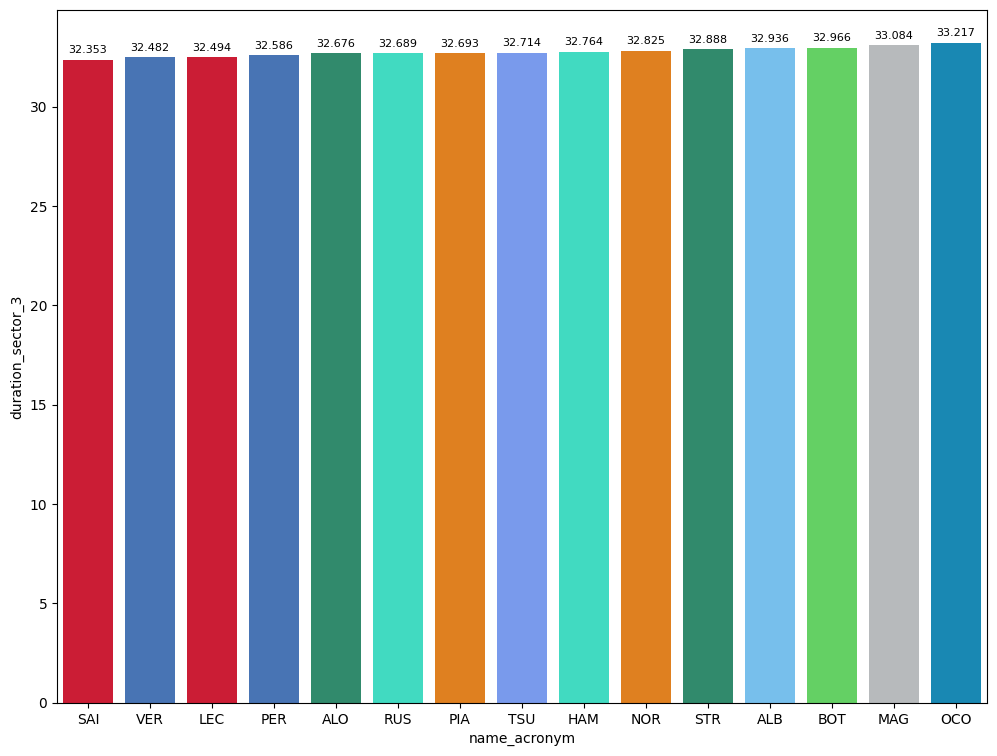

In [161]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [162]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [163]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Max VERSTAPPEN Sector 1:  26.262 Sector 2:  17.315 Sector 3:  32.338


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
Ferrari dominated the first sector, Red Bull the second and the third was disputed beetween them.
Carlos Sainz showed a good pace in all the weekend and this session showed as well. Carlos was fastest in the first sector(as the data in free practice shown), Verstappen in the second but in the third, Carlos made a mistake in the exit of turn 12 and this costed the pole.

In [164]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,55,0.270,-0.040,0.119,0.191,SAI
1,11,0.359,0.205,-0.026,0.180,PER
2,4,0.400,0.131,0.052,0.217,NOR
3,16,0.520,0.176,0.226,0.118,LEC
4,81,0.657,0.232,0.128,0.297,PIA
5,63,0.809,0.239,0.187,0.383,RUS
6,22,0.873,0.251,0.192,0.430,TSU
7,18,1.157,0.251,0.190,0.716,STR
8,14,1.637,0.576,0.240,0.821,ALO


#### Best sector per driver
In this section we can see the best sector of the session

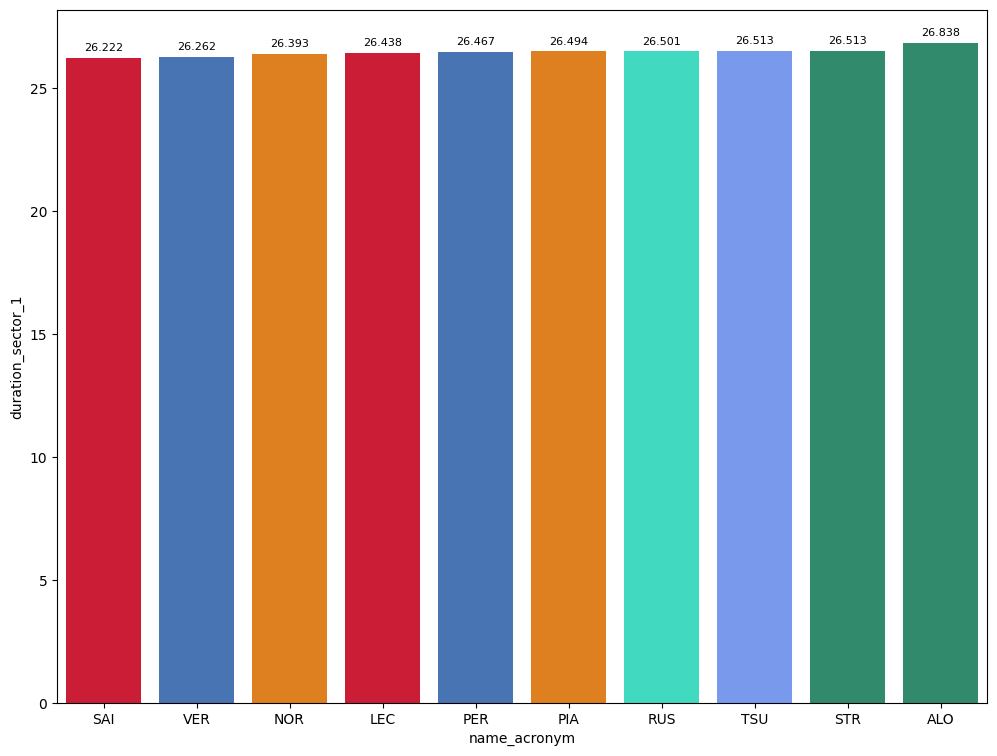

In [165]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

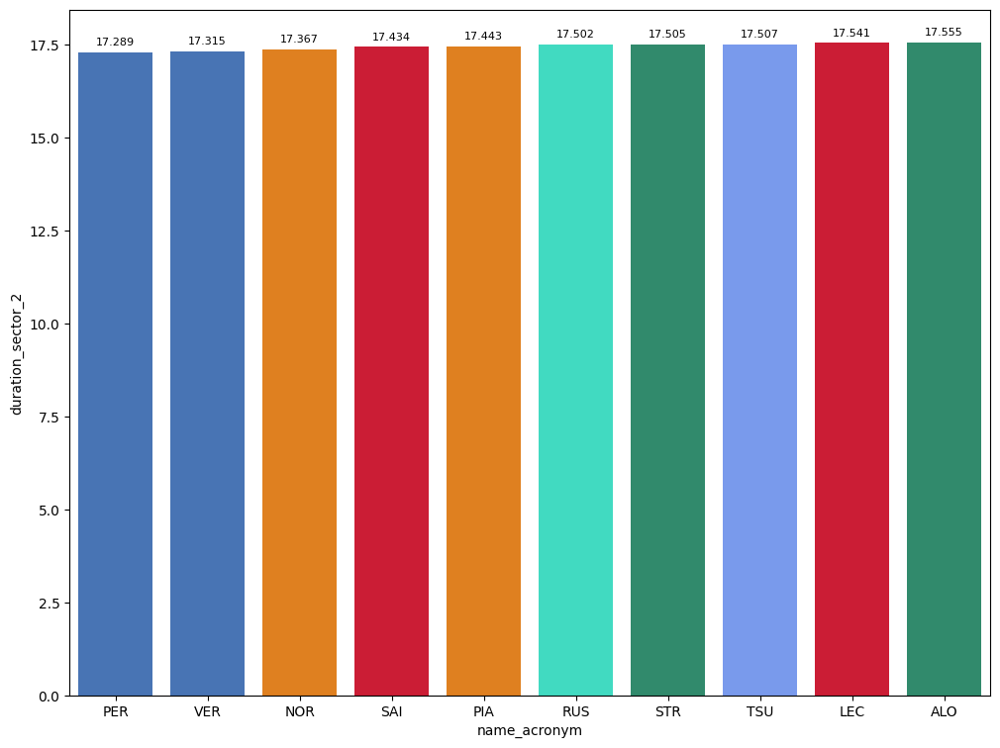

In [166]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

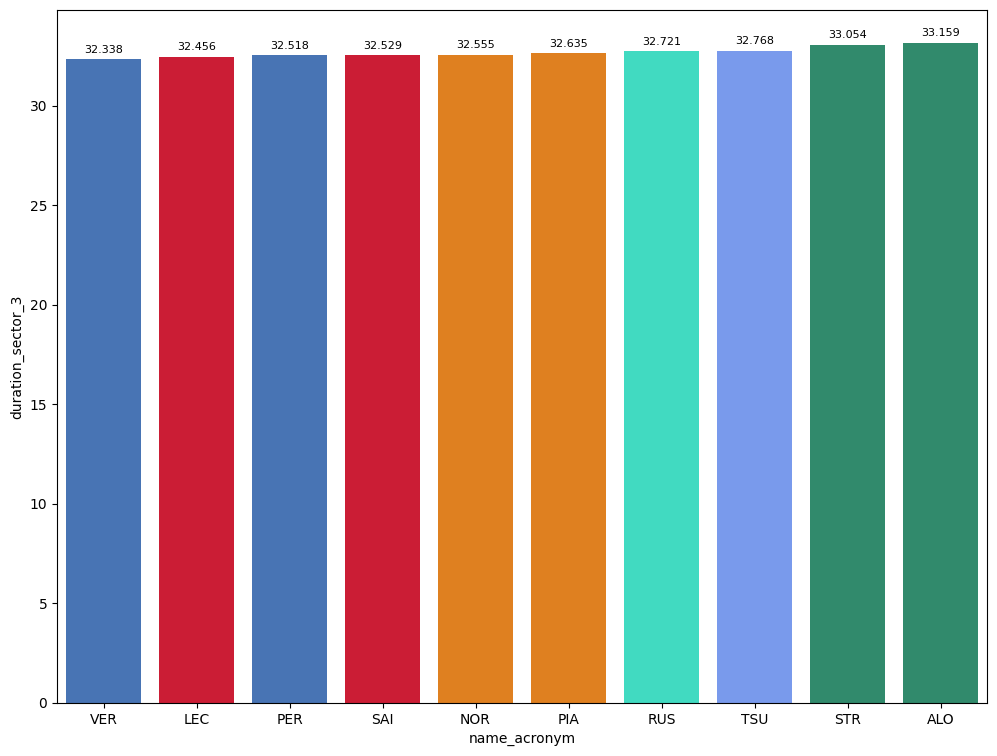

In [167]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Best sector per driver of the session (in general)

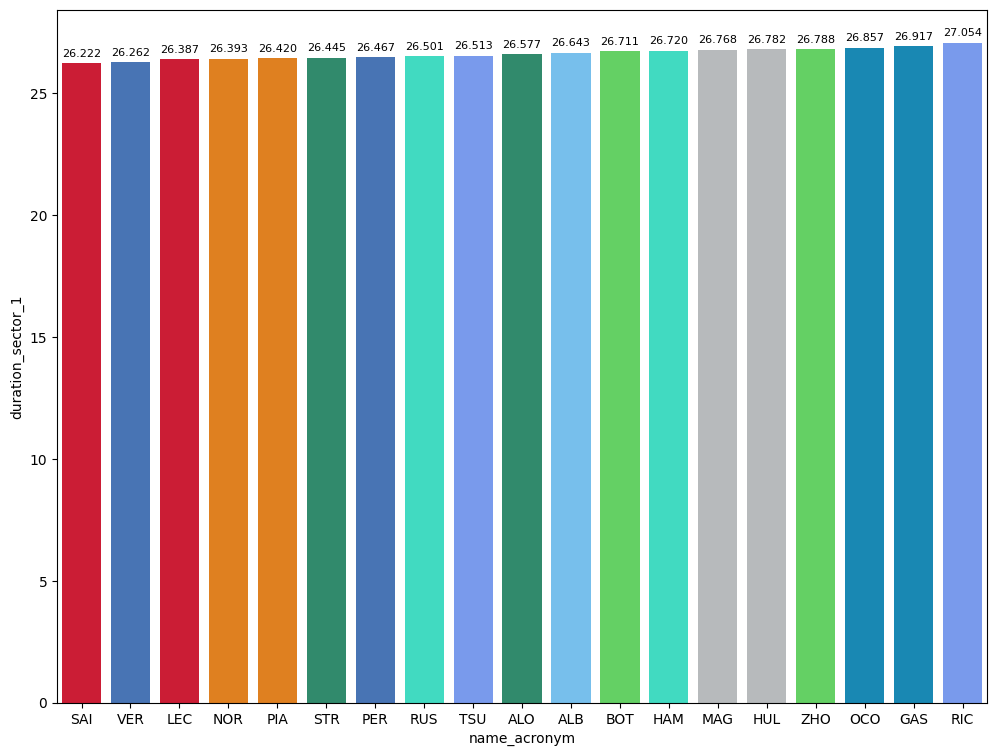

In [168]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

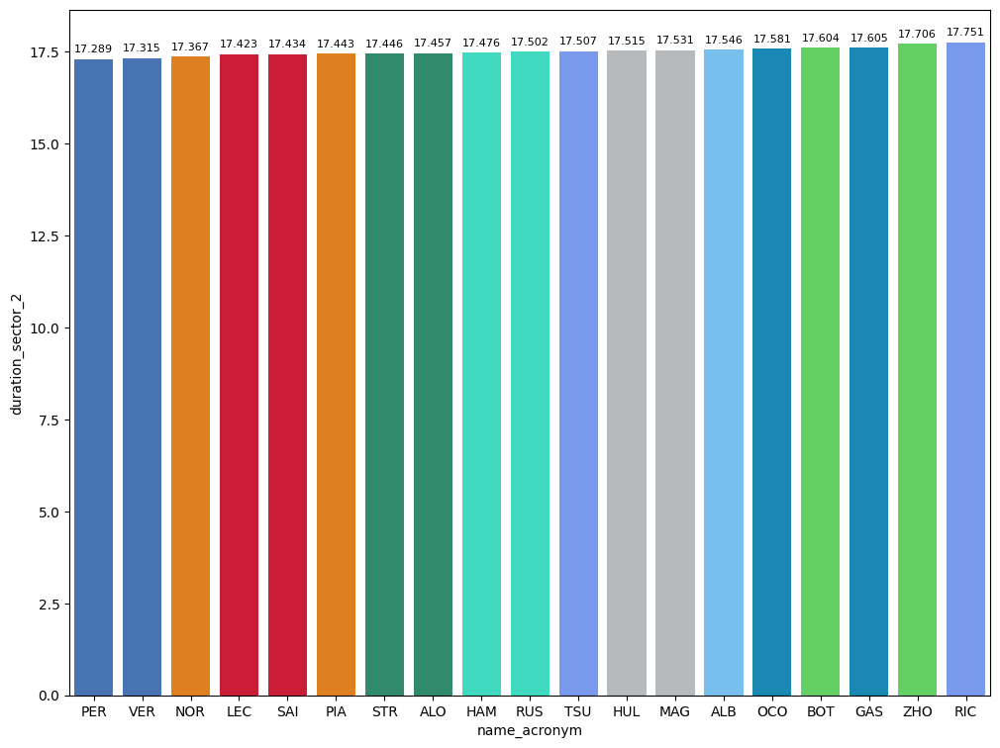

In [169]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

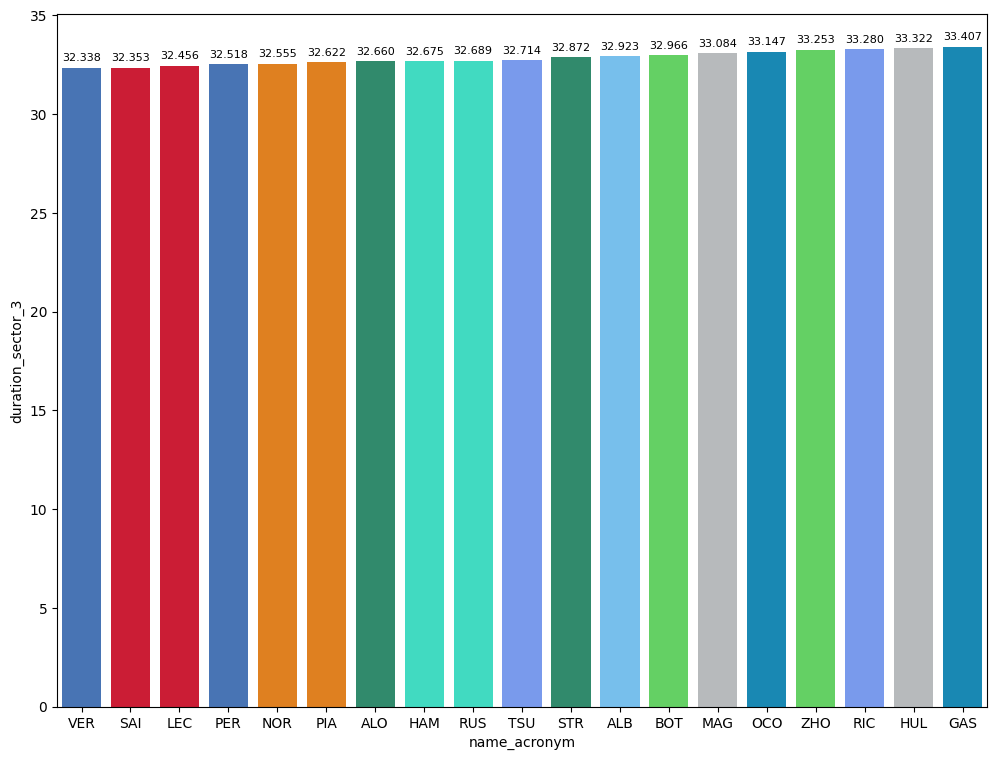

In [170]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Comparaison between the poleman and the second

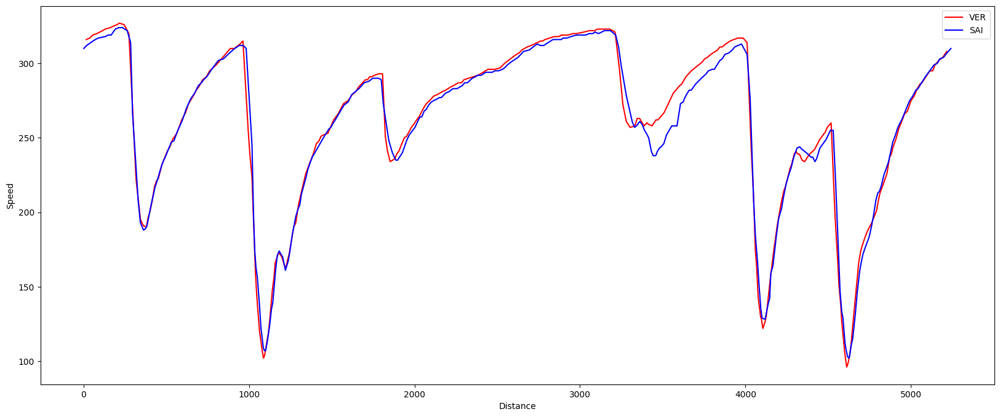

In [172]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

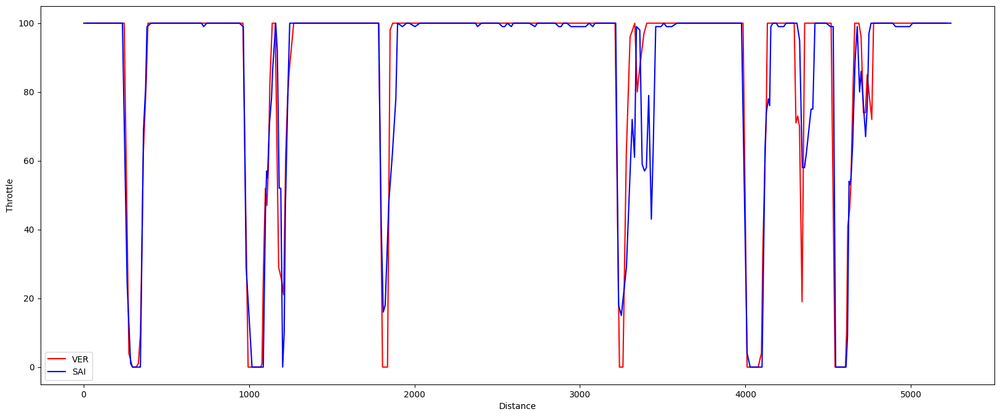

In [173]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

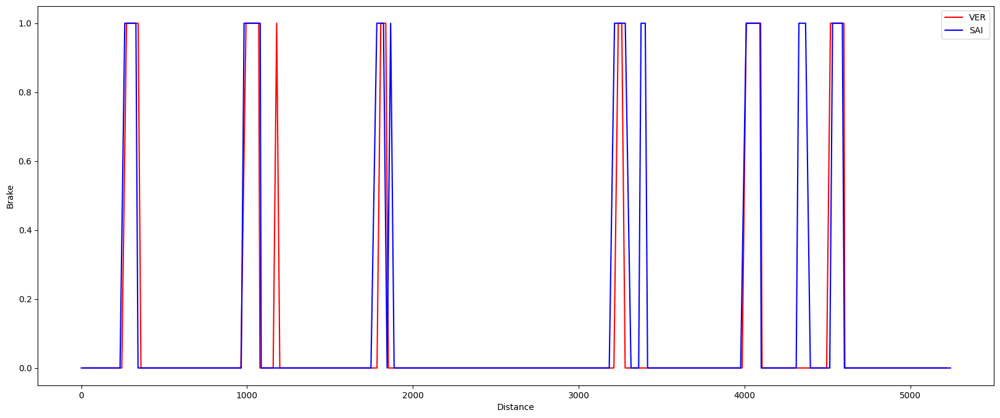

In [174]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

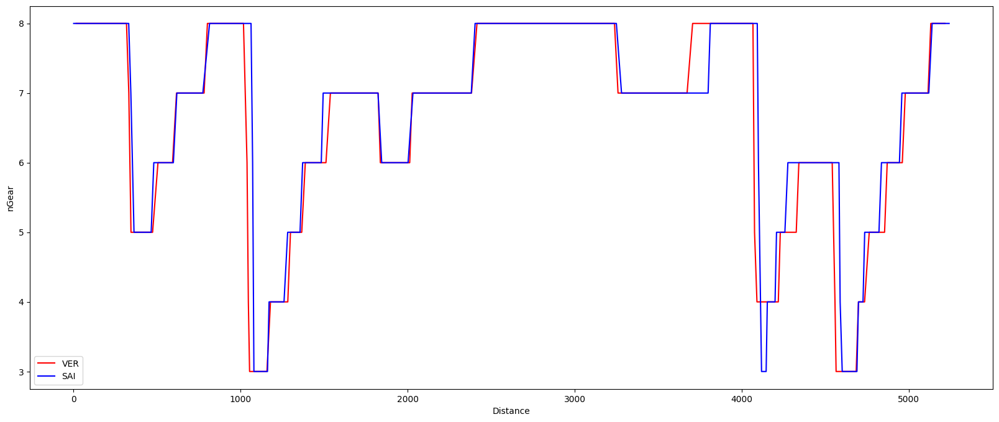

In [175]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [176]:
race = libraryDataF1.obtain_information('laps',session_key=9488)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9488)
drivers = libraryDataF1.obtain_information('drivers',session_key=9488)
libraryDataF1.obtain_drivers_colours(drivers)

In [177]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [178]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Mean pace with the different compound used on the session

In [179]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
HARD,82.401133
MEDIUM,83.143676
SOFT,83.870250


### Speed trap

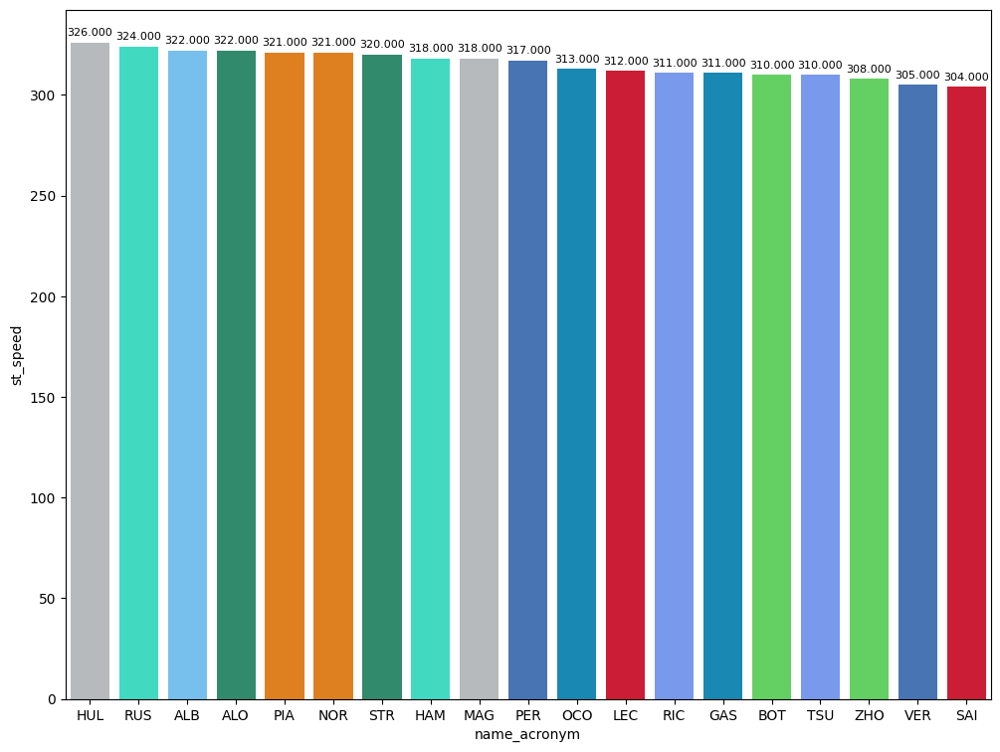

In [180]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

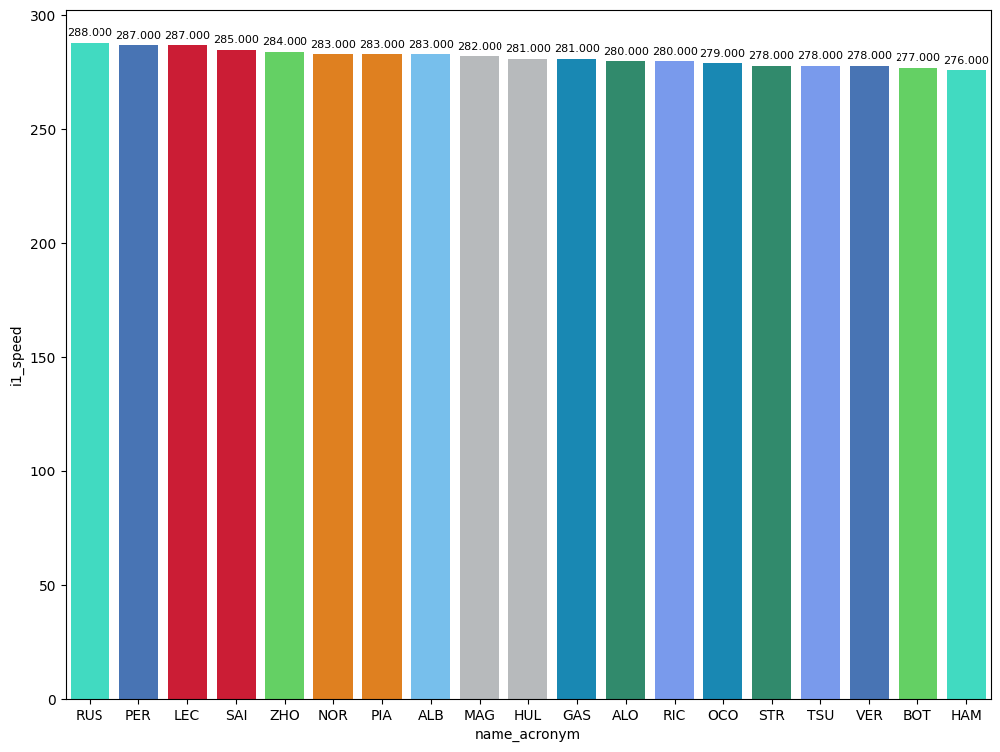

In [181]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

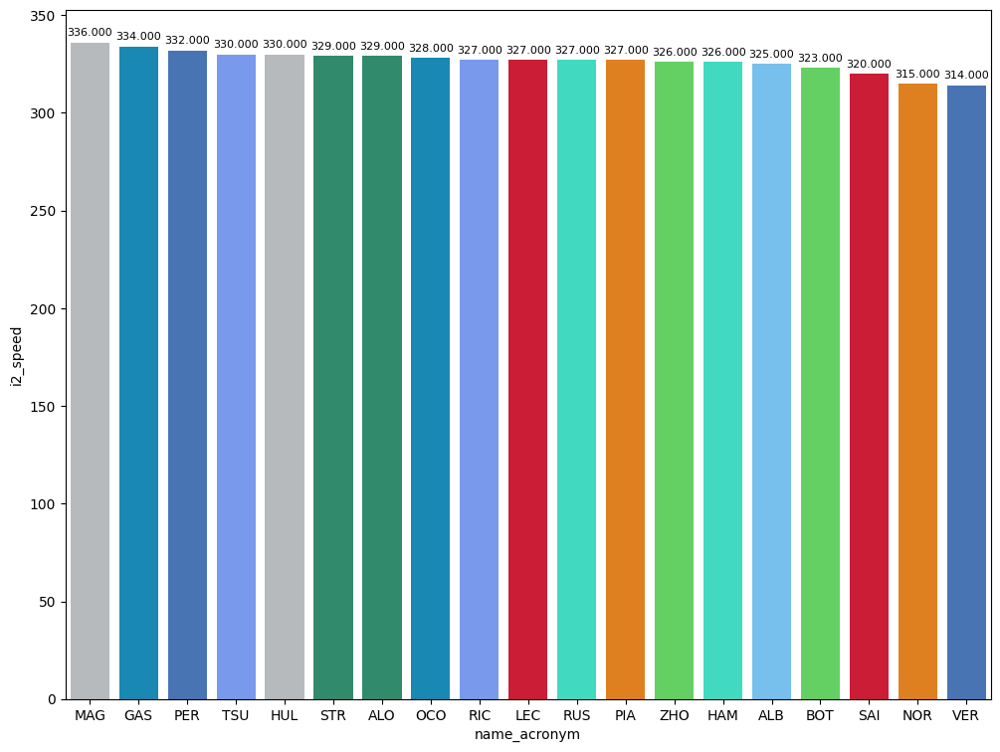

In [182]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Race pace
General explanation
Explanation per teams

In [183]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
Ferrari,81.768724
McLaren,81.863882
Red Bull Racing,82.373250
Aston Martin,82.575253
Mercedes,82.632688
RB,82.901547
Haas F1 Team,82.919905
Kick Sauber,82.948127
Williams,83.077257


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1
General explanation

In [184]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
Ferrari,28.587737
McLaren,28.617000
Red Bull Racing,28.710400
Aston Martin,28.738494
Mercedes,28.794729
Kick Sauber,28.905962
Haas F1 Team,28.916698
Alpine,28.927732
RB,28.936547


#### Sector 2
General explanation

In [185]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
Red Bull Racing,17.927600
McLaren,17.978906
Haas F1 Team,18.063333
Ferrari,18.094382
Mercedes,18.125396
Alpine,18.136042
Aston Martin,18.185193
RB,18.187062
Williams,18.198171


#### Sector 3
General explanation

In [186]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
Ferrari,35.086605
McLaren,35.267976
Aston Martin,35.651566
Mercedes,35.712562
Kick Sauber,35.718911
Red Bull Racing,35.735250
RB,35.777938
Williams,35.827371
Haas F1 Team,35.939873


### Long runs

In [187]:
MINIMUN_SECONDS = 80
MAXIMUM_SECONDS = 98

#### Red Bull Racing

In [188]:
stintInformation.query('driver_number == 1 or driver_number == 11')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1231,9488,1,1,1,4,MEDIUM,0
14,1231,9488,1,11,1,14,MEDIUM,0
31,1231,9488,2,11,15,35,HARD,0
43,1231,9488,3,11,36,59,HARD,0


In [189]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
19,Max VERSTAPPEN,MEDIUM,2024-03-24T04:04:40.349000+00:00,2,29.623,18.375,36.101,84.099
38,Max VERSTAPPEN,MEDIUM,2024-03-24T04:06:04.412000+00:00,3,28.793,18.573,35.749,83.115


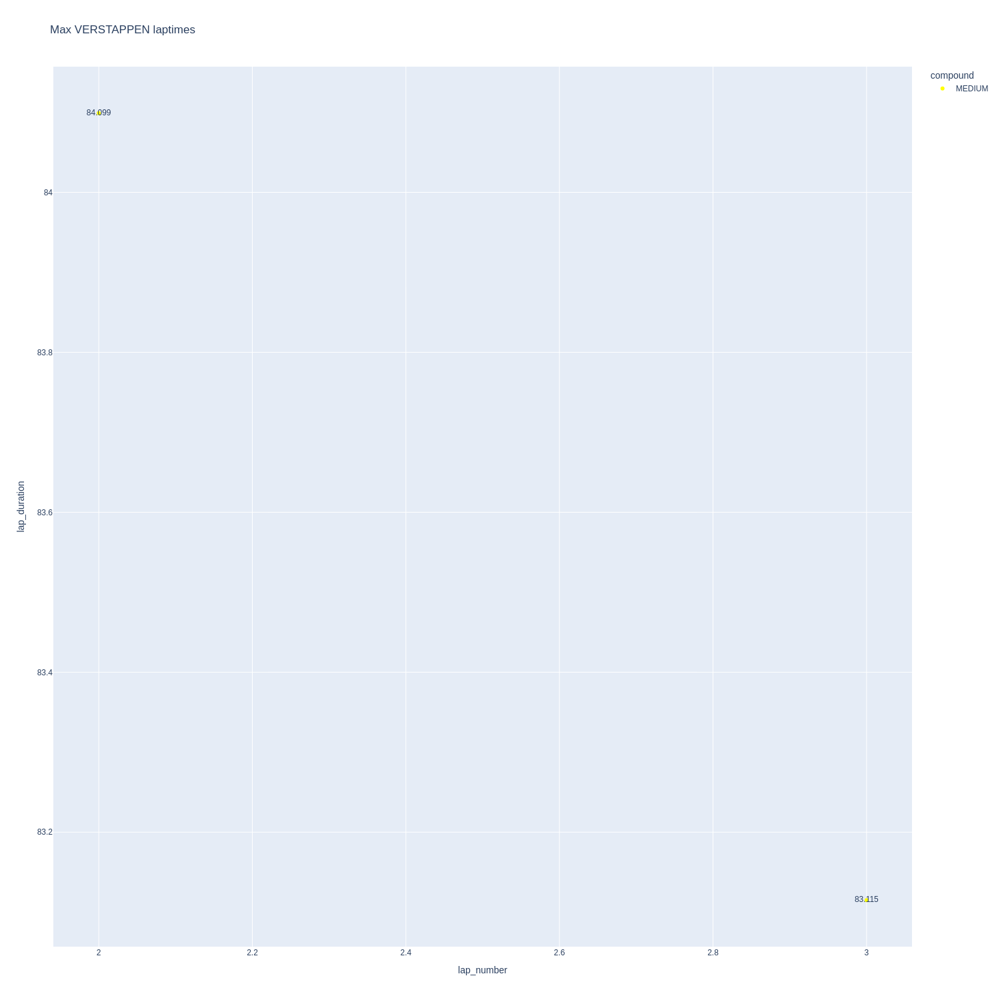

In [190]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

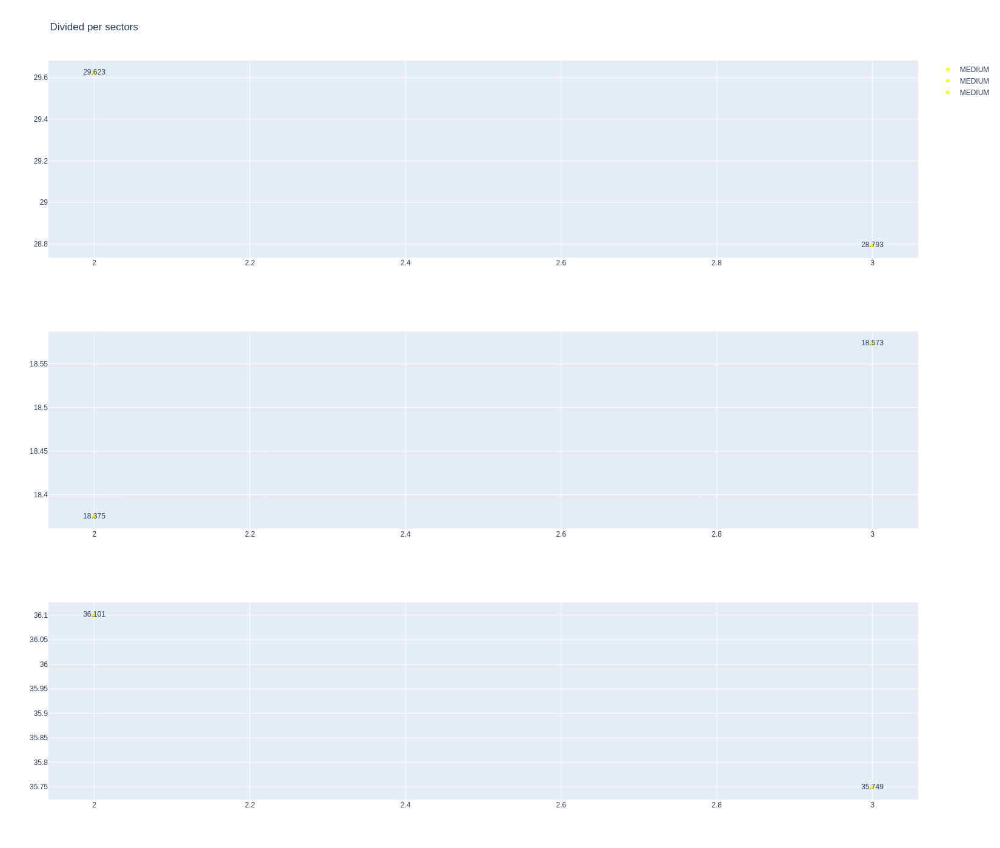

In [191]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [192]:
data = libraryDataF1.getinfolongruns(jointables,11,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
23,Sergio PEREZ,MEDIUM,2024-03-24T04:04:45.400000+00:00,2,29.370,17.903,36.108,83.381
42,Sergio PEREZ,MEDIUM,2024-03-24T04:06:08.728000+00:00,3,29.005,17.939,36.221,83.165
61,Sergio PEREZ,MEDIUM,2024-03-24T04:07:31.776000+00:00,4,28.848,18.020,36.530,83.398
79,Sergio PEREZ,MEDIUM,2024-03-24T04:08:55.055000+00:00,5,28.964,17.747,36.653,83.364
96,Sergio PEREZ,MEDIUM,2024-03-24T04:10:18.512000+00:00,6,28.808,17.868,36.348,83.024
114,Sergio PEREZ,MEDIUM,2024-03-24T04:11:41.673000+00:00,7,28.962,17.896,35.946,82.804
130,Sergio PEREZ,MEDIUM,2024-03-24T04:13:04.468000+00:00,8,28.744,17.746,36.558,83.048
146,Sergio PEREZ,MEDIUM,2024-03-24T04:14:27.407000+00:00,9,28.758,18.147,36.065,82.970
161,Sergio PEREZ,MEDIUM,2024-03-24T04:15:50.358000+00:00,10,28.928,18.188,35.564,82.680
175,Sergio PEREZ,MEDIUM,2024-03-24T04:17:13.103000+00:00,11,29.025,18.117,35.779,82.921


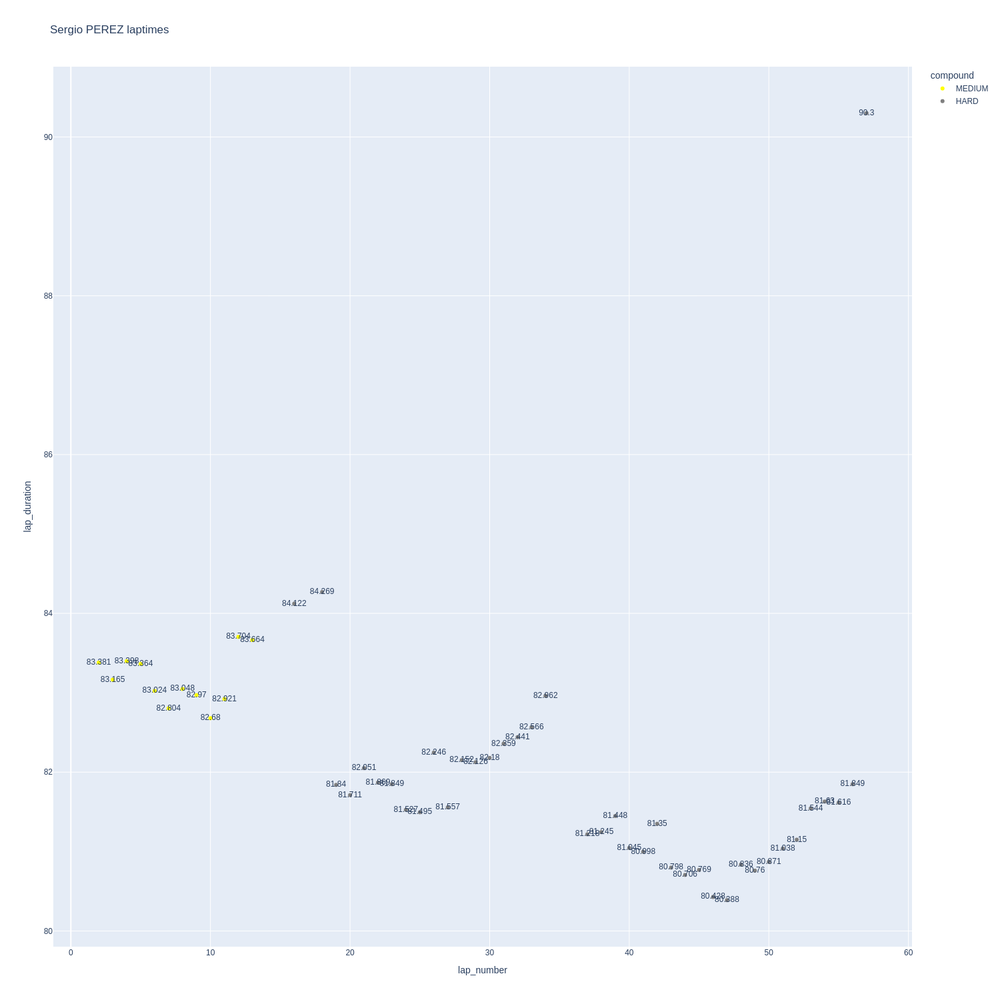

In [193]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

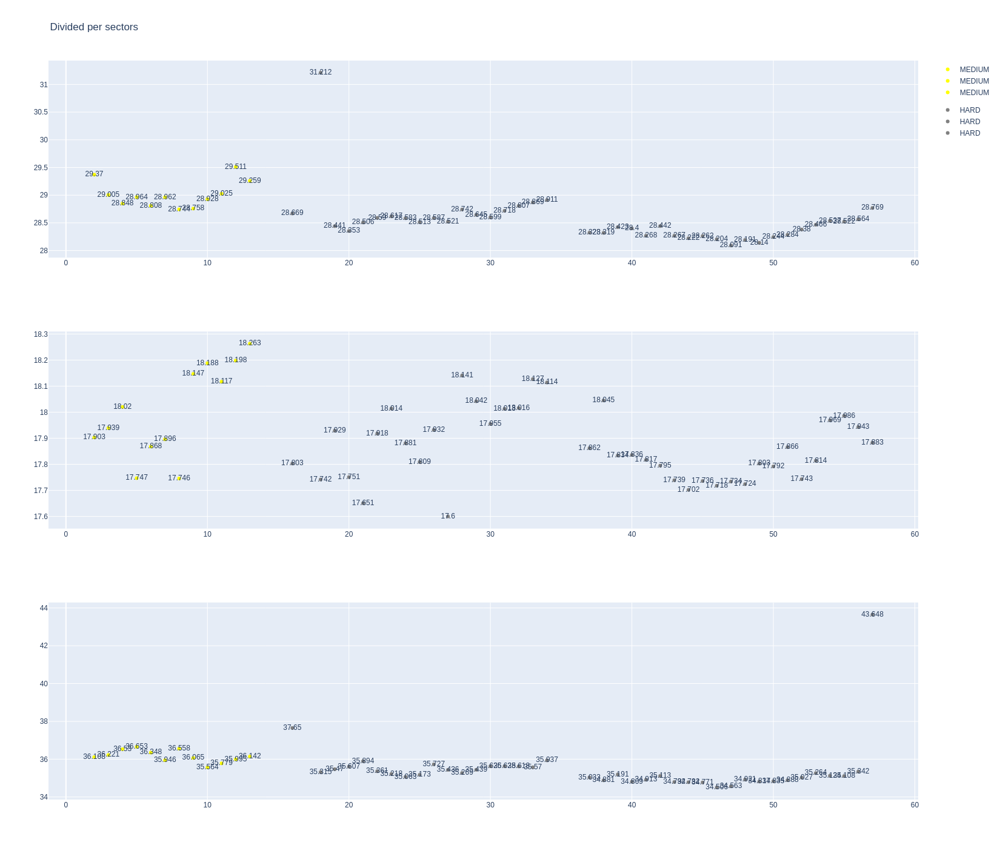

In [194]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [195]:
stintInformation.query('driver_number == 55 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1231,9488,1,16,1,9,MEDIUM,0
15,1231,9488,1,55,1,16,MEDIUM,0
28,1231,9488,2,16,10,34,HARD,0
33,1231,9488,2,55,17,41,HARD,0
41,1231,9488,3,16,35,59,HARD,0
52,1231,9488,3,55,42,59,HARD,0


In [196]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
25,Charles LECLERC,MEDIUM,2024-03-24T04:04:43.419000+00:00,2,28.731,17.982,36.301,83.014
44,Charles LECLERC,MEDIUM,2024-03-24T04:06:06.378000+00:00,3,28.753,17.912,36.111,82.776
63,Charles LECLERC,MEDIUM,2024-03-24T04:07:29.213000+00:00,4,28.753,18.015,35.751,82.519
81,Charles LECLERC,MEDIUM,2024-03-24T04:08:51.626000+00:00,5,28.895,17.930,35.807,82.632
98,Charles LECLERC,MEDIUM,2024-03-24T04:10:14.287000+00:00,6,28.817,17.824,36.032,82.673
116,Charles LECLERC,MEDIUM,2024-03-24T04:11:36.961000+00:00,7,28.963,17.949,35.772,82.684
132,Charles LECLERC,MEDIUM,2024-03-24T04:12:59.682000+00:00,8,28.769,17.823,36.391,82.983
148,Charles LECLERC,MEDIUM,2024-03-24T04:14:22.626000+00:00,9,28.769,17.994,49.273,96.036
177,Charles LECLERC,HARD,2024-03-24T04:17:26.591000+00:00,11,28.900,18.018,35.729,82.647
195,Charles LECLERC,HARD,2024-03-24T04:18:49.190000+00:00,12,28.454,18.244,35.143,81.841


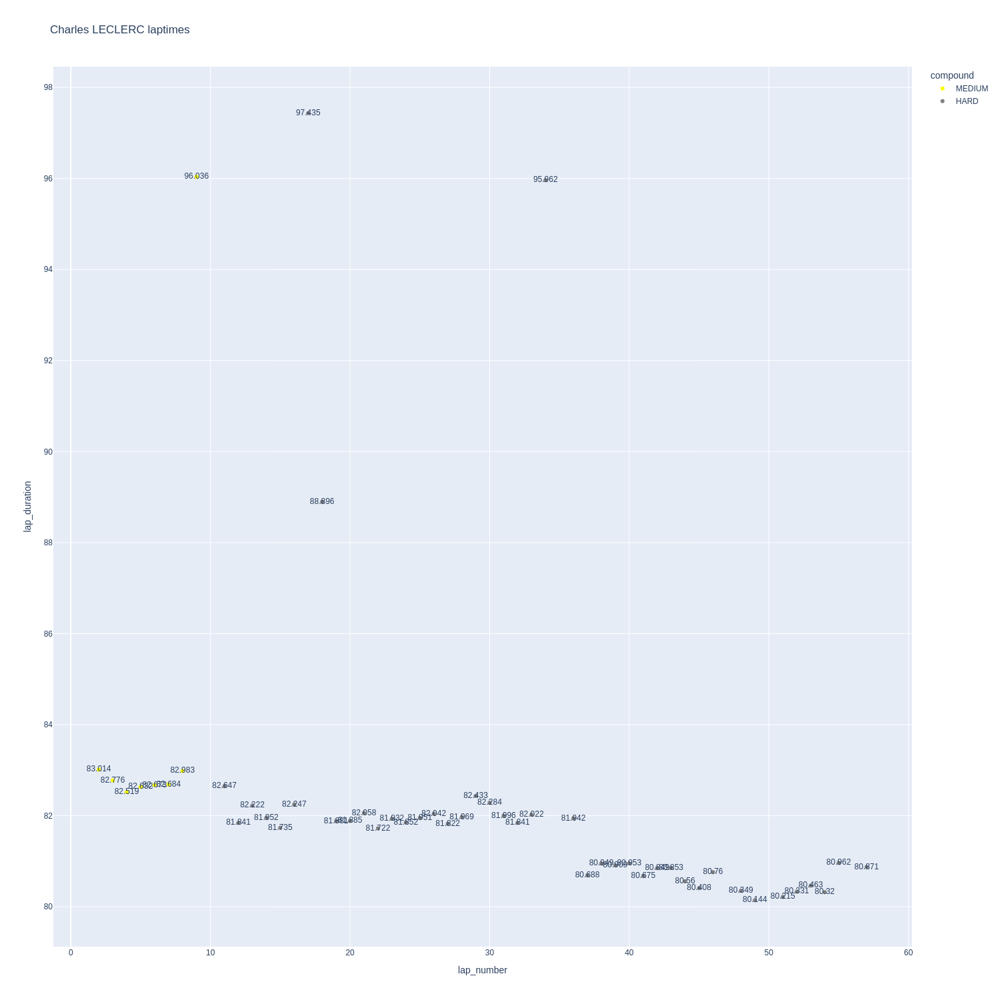

In [197]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

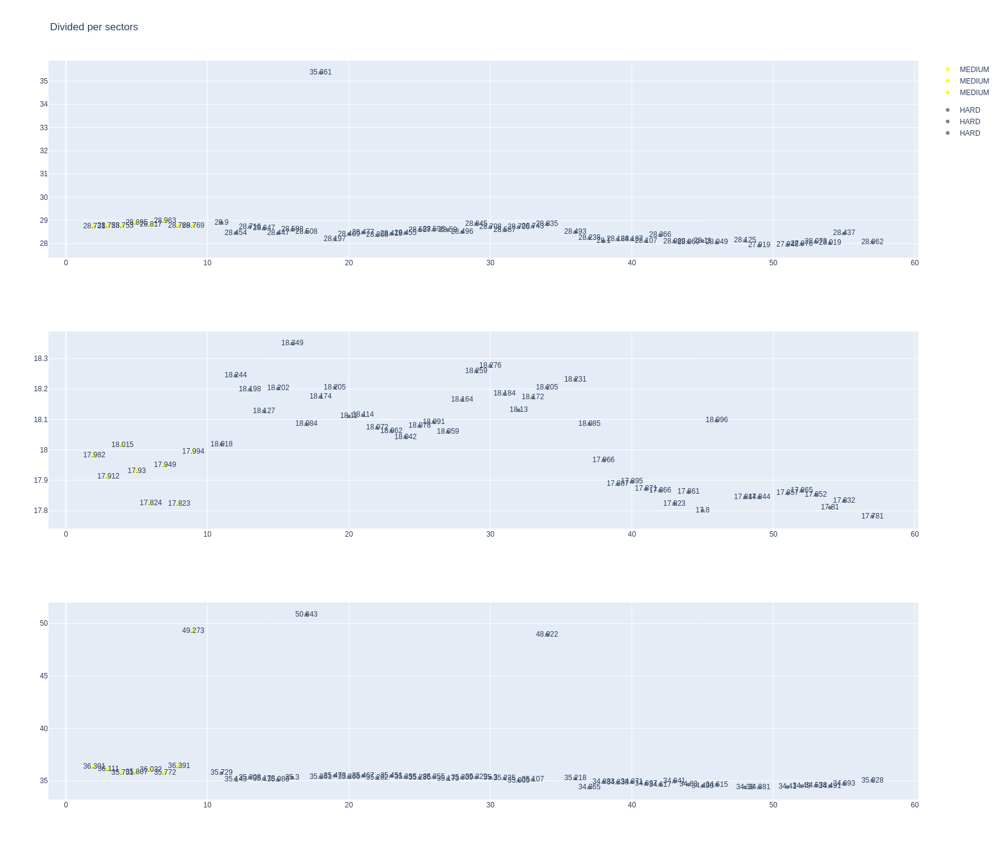

In [198]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [199]:
data = libraryDataF1.getinfolongruns(jointables,55,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
34,Carlos SAINZ,MEDIUM,2024-03-24T04:04:41.130000+00:00,2,29.006,18.026,35.568,82.600
53,Carlos SAINZ,MEDIUM,2024-03-24T04:06:04.021000+00:00,3,29.002,18.548,35.456,83.006
72,Carlos SAINZ,MEDIUM,2024-03-24T04:07:26.936000+00:00,4,28.643,18.497,35.293,82.433
90,Carlos SAINZ,MEDIUM,2024-03-24T04:08:49.338000+00:00,5,28.705,18.504,35.420,82.629
107,Carlos SAINZ,MEDIUM,2024-03-24T04:10:12.002000+00:00,6,28.648,18.453,35.471,82.572
123,Carlos SAINZ,MEDIUM,2024-03-24T04:11:34.528000+00:00,7,28.670,18.462,35.302,82.434
139,Carlos SAINZ,MEDIUM,2024-03-24T04:12:56.883000+00:00,8,28.562,18.397,35.344,82.303
156,Carlos SAINZ,MEDIUM,2024-03-24T04:14:19.169000+00:00,9,28.594,18.290,35.141,82.025
169,Carlos SAINZ,MEDIUM,2024-03-24T04:15:41.329000+00:00,10,28.426,18.281,35.008,81.715
186,Carlos SAINZ,MEDIUM,2024-03-24T04:17:03.018000+00:00,11,28.460,18.272,35.206,81.938


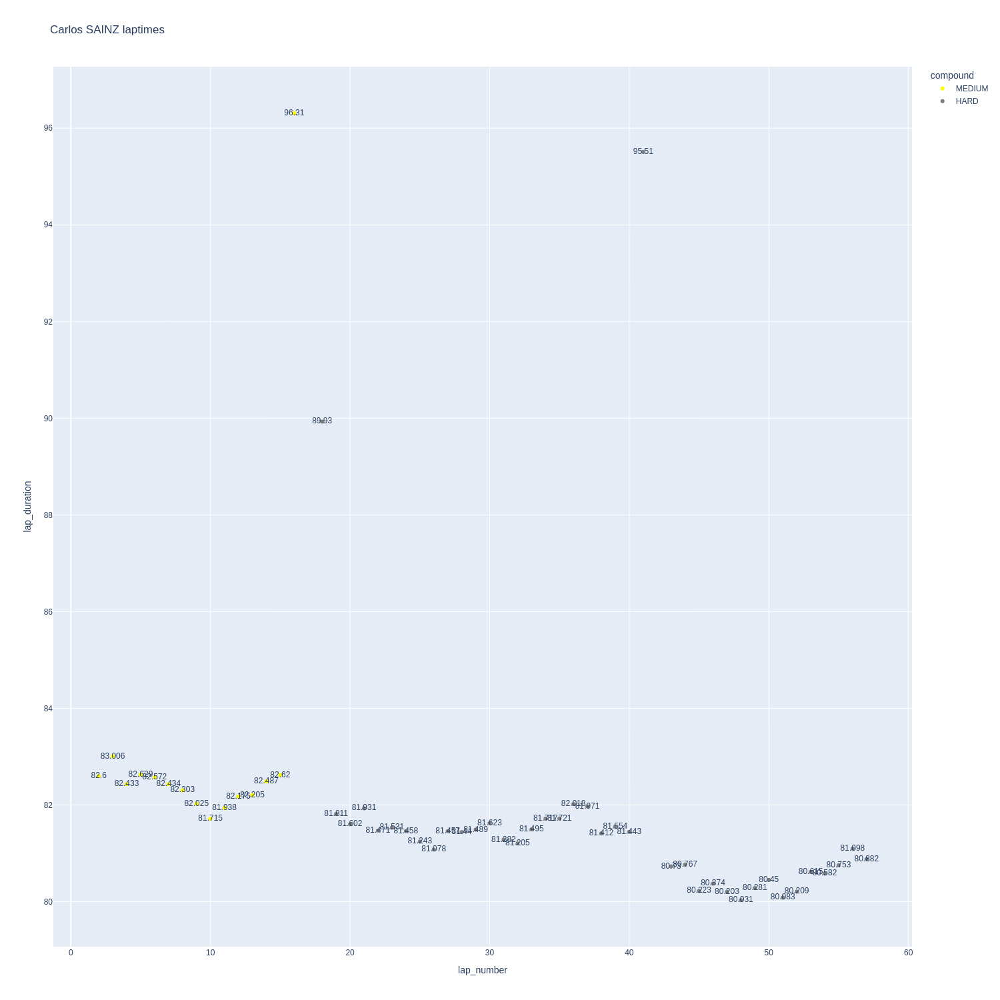

In [200]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

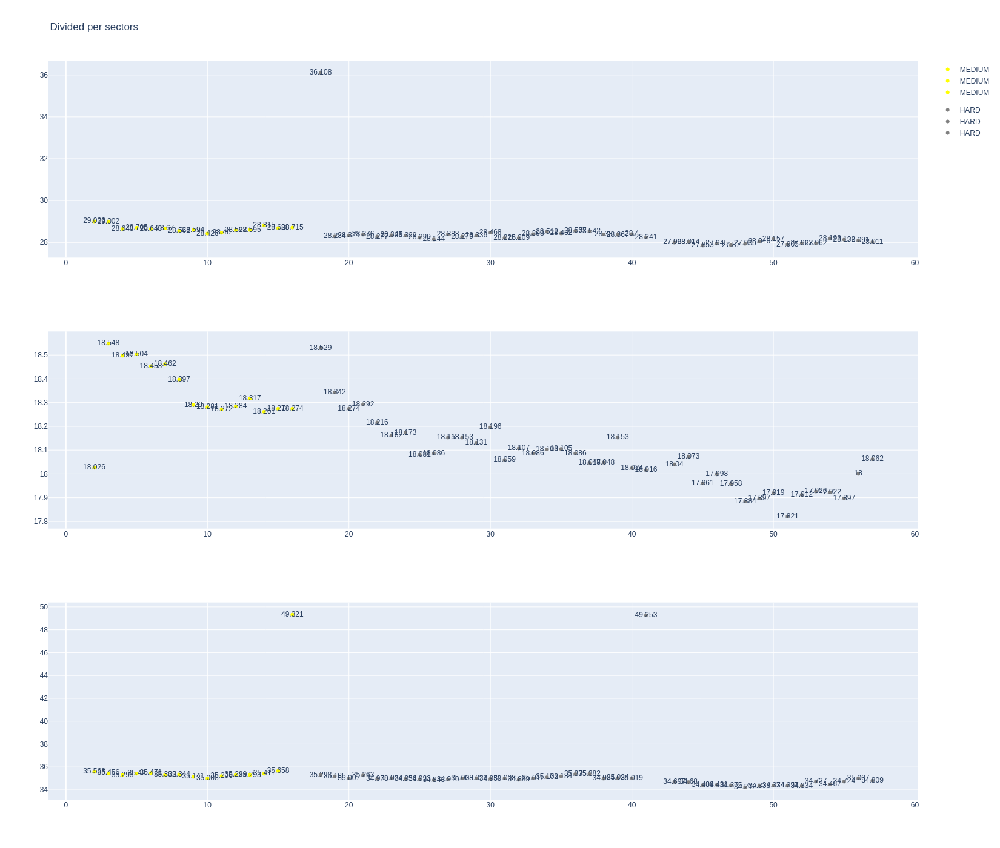

In [201]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [202]:
stintInformation.query('driver_number == 63 or driver_number == 44')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1231,9488,1,44,1,7,SOFT,0
7,1231,9488,1,63,1,8,MEDIUM,0
22,1231,9488,2,44,8,16,HARD,0
26,1231,9488,2,63,9,45,HARD,0
54,1231,9488,3,63,46,57,HARD,0


In [203]:
data = libraryDataF1.getinfolongruns(jointables,44,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
33,Lewis HAMILTON,SOFT,2024-03-24T04:04:46.549000+00:00,2,29.971,18.028,36.056,84.055
52,Lewis HAMILTON,SOFT,2024-03-24T04:06:10.572000+00:00,3,29.083,18.050,35.937,83.070
71,Lewis HAMILTON,SOFT,2024-03-24T04:07:33.713000+00:00,4,29.088,18.015,36.333,83.436
89,Lewis HAMILTON,SOFT,2024-03-24T04:08:57.046000+00:00,5,28.930,18.561,36.065,83.556
106,Lewis HAMILTON,SOFT,2024-03-24T04:10:20.639000+00:00,6,29.165,18.154,35.846,83.165
122,Lewis HAMILTON,SOFT,2024-03-24T04:11:43.950000+00:00,7,28.973,17.875,50.010,96.858
155,Lewis HAMILTON,HARD,2024-03-24T04:14:48.784000+00:00,9,28.842,17.977,35.736,82.555
168,Lewis HAMILTON,HARD,2024-03-24T04:16:11.281000+00:00,10,30.157,18.345,35.793,84.295
185,Lewis HAMILTON,HARD,2024-03-24T04:17:35.795000+00:00,11,28.718,18.168,35.558,82.444
203,Lewis HAMILTON,HARD,2024-03-24T04:18:58.166000+00:00,12,29.006,18.193,35.842,83.041


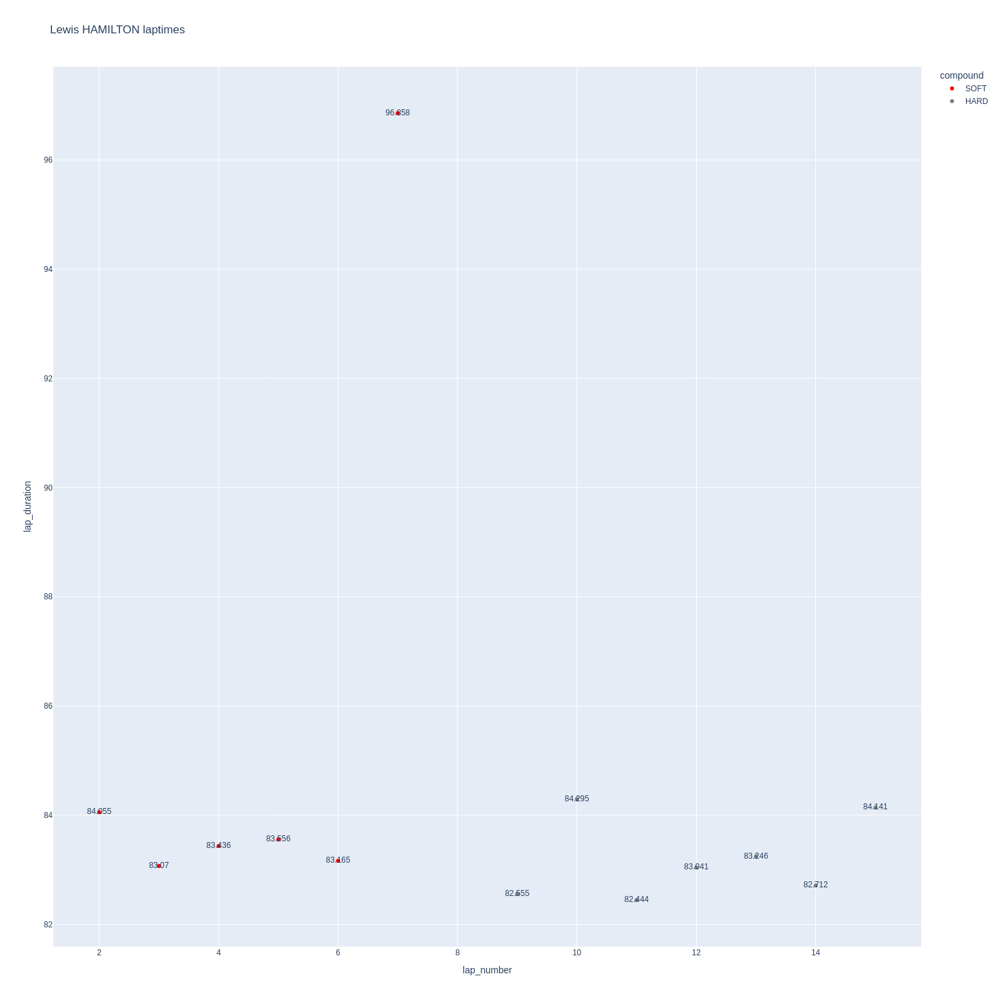

In [204]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

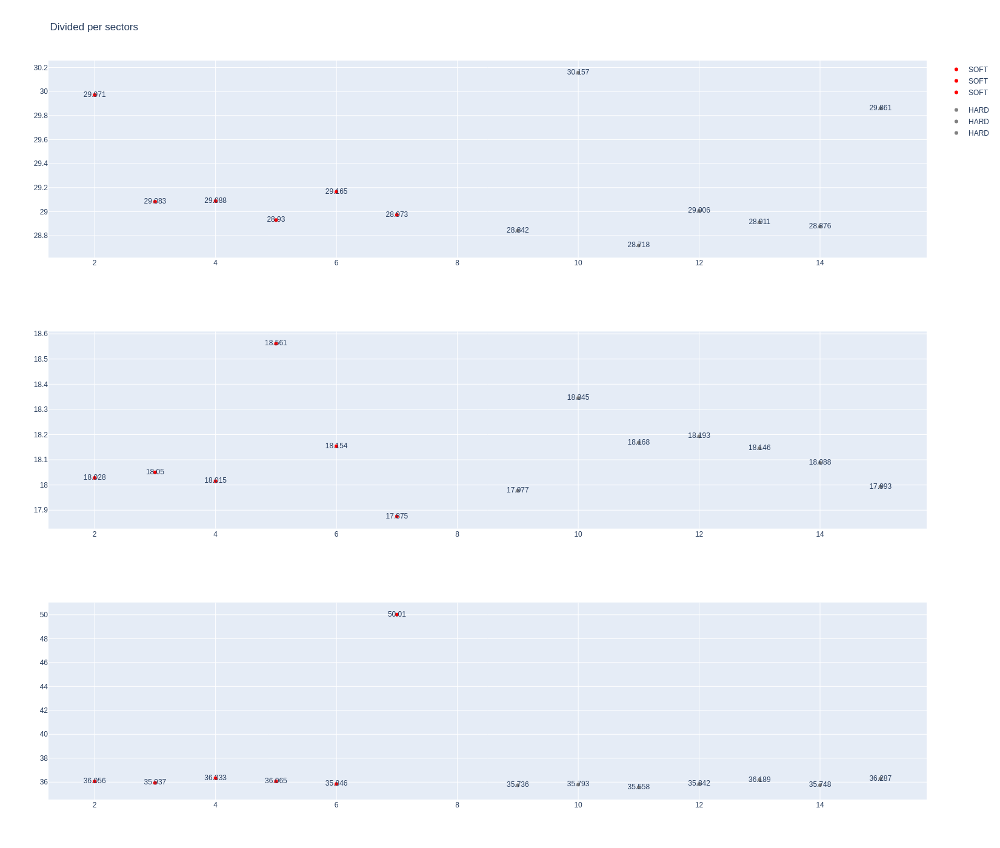

In [205]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [206]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
35,George RUSSELL,MEDIUM,2024-03-24T04:04:44.721000+00:00,2,29.070,18.099,36.178,83.347
54,George RUSSELL,MEDIUM,2024-03-24T04:06:08.136000+00:00,3,28.745,18.137,36.155,83.037
73,George RUSSELL,MEDIUM,2024-03-24T04:07:31.149000+00:00,4,28.894,18.318,36.359,83.571
91,George RUSSELL,MEDIUM,2024-03-24T04:08:54.693000+00:00,5,28.763,18.297,36.112,83.172
108,George RUSSELL,MEDIUM,2024-03-24T04:10:17.889000+00:00,6,28.725,18.354,36.040,83.119
124,George RUSSELL,MEDIUM,2024-03-24T04:11:40.989000+00:00,7,28.797,18.279,35.688,82.764
140,George RUSSELL,MEDIUM,2024-03-24T04:13:03.719000+00:00,8,28.679,18.251,49.990,96.920
170,George RUSSELL,HARD,2024-03-24T04:16:09.084000+00:00,10,28.814,18.308,35.615,82.737
187,George RUSSELL,HARD,2024-03-24T04:17:31.745000+00:00,11,28.731,18.303,35.682,82.716
205,George RUSSELL,HARD,2024-03-24T04:18:54.555000+00:00,12,28.851,18.243,35.928,83.022


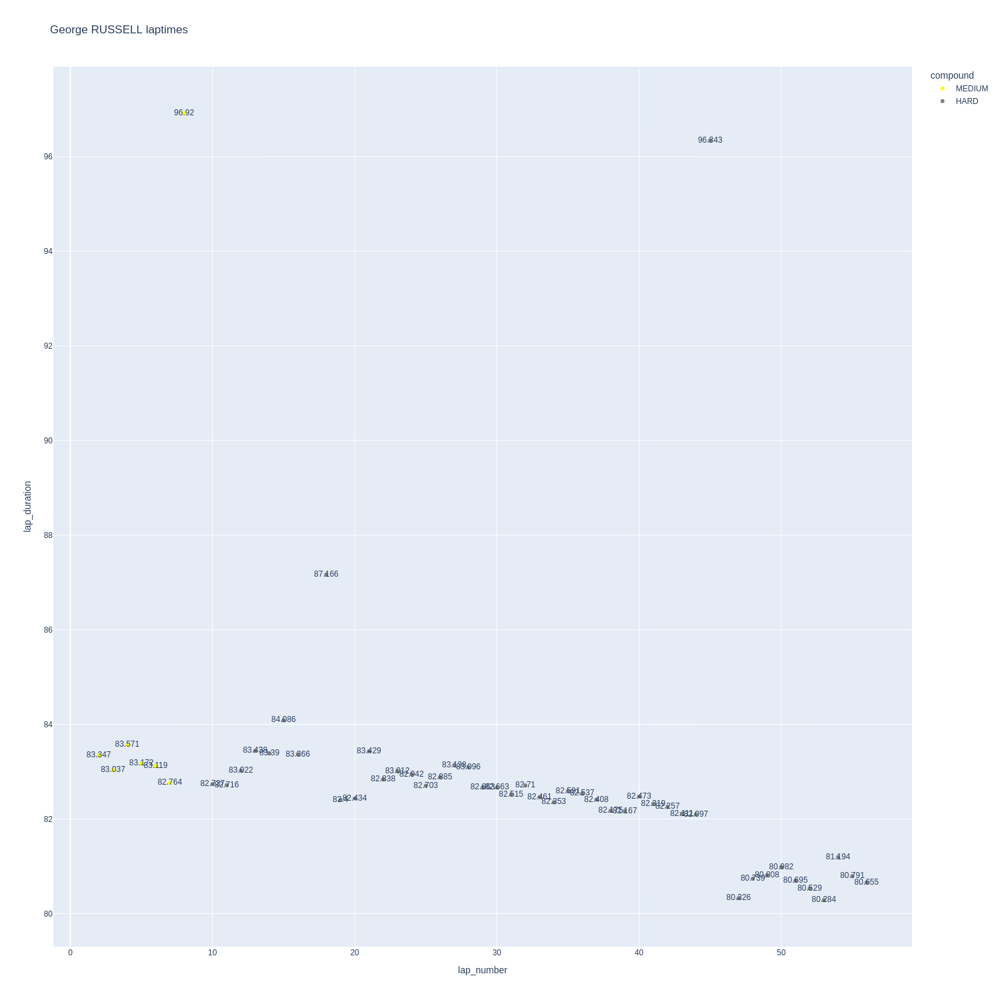

In [207]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

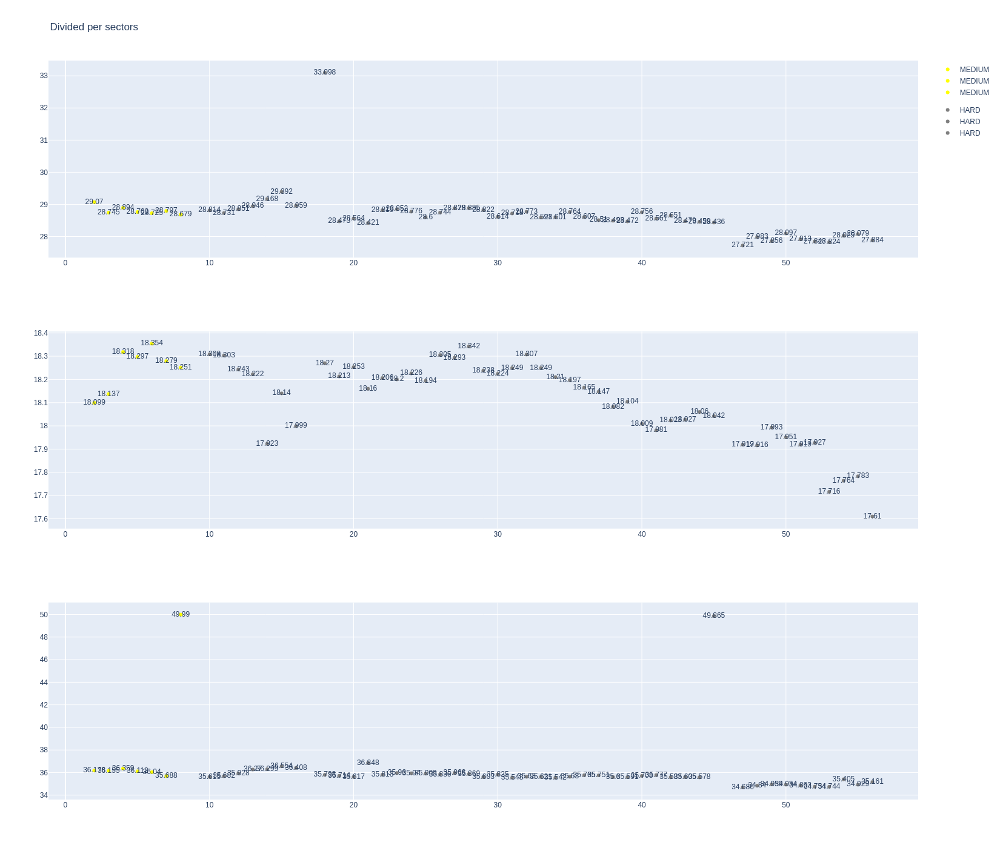

In [208]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [209]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1231,9488,1,81,1,9,MEDIUM,0
13,1231,9488,1,4,1,14,MEDIUM,0
30,1231,9488,2,81,10,39,HARD,1
32,1231,9488,2,4,15,40,HARD,1
48,1231,9488,3,81,40,59,HARD,1
49,1231,9488,3,4,41,59,HARD,1


In [210]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
21,Lando NORRIS,MEDIUM,2024-03-24T04:04:42.700000+00:00,2,28.814,18.319,36.050,83.183
40,Lando NORRIS,MEDIUM,2024-03-24T04:06:05.908000+00:00,3,28.750,18.204,35.702,82.656
59,Lando NORRIS,MEDIUM,2024-03-24T04:07:28.443000+00:00,4,28.749,18.059,35.801,82.609
77,Lando NORRIS,MEDIUM,2024-03-24T04:08:51.055000+00:00,5,28.740,18.302,35.643,82.685
94,Lando NORRIS,MEDIUM,2024-03-24T04:10:13.759000+00:00,6,28.717,18.248,35.667,82.632
112,Lando NORRIS,MEDIUM,2024-03-24T04:11:36.408000+00:00,7,28.881,18.232,35.631,82.744
128,Lando NORRIS,MEDIUM,2024-03-24T04:12:59.158000+00:00,8,28.705,18.245,35.680,82.630
144,Lando NORRIS,MEDIUM,2024-03-24T04:14:21.861000+00:00,9,28.832,18.238,35.657,82.727
159,Lando NORRIS,MEDIUM,2024-03-24T04:15:44.539000+00:00,10,28.756,18.235,35.704,82.695
173,Lando NORRIS,MEDIUM,2024-03-24T04:17:07.203000+00:00,11,28.880,18.277,35.779,82.936


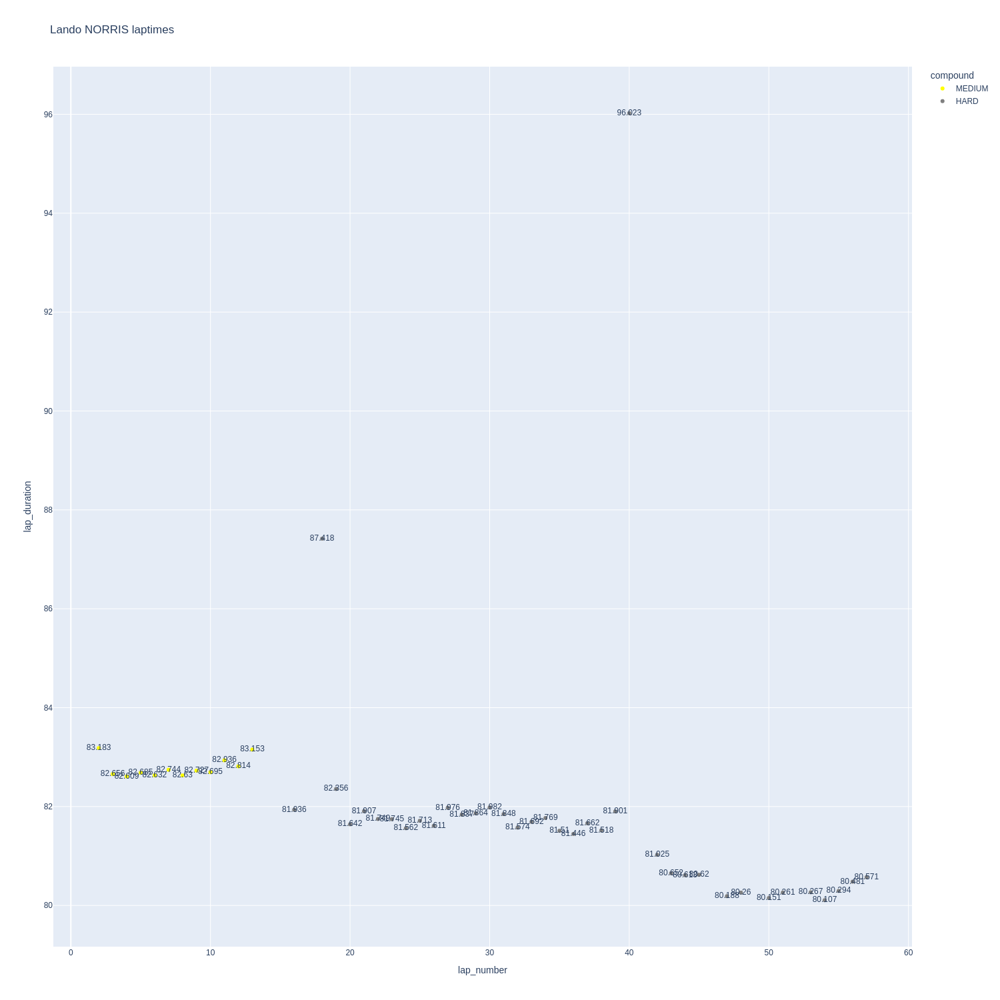

In [211]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

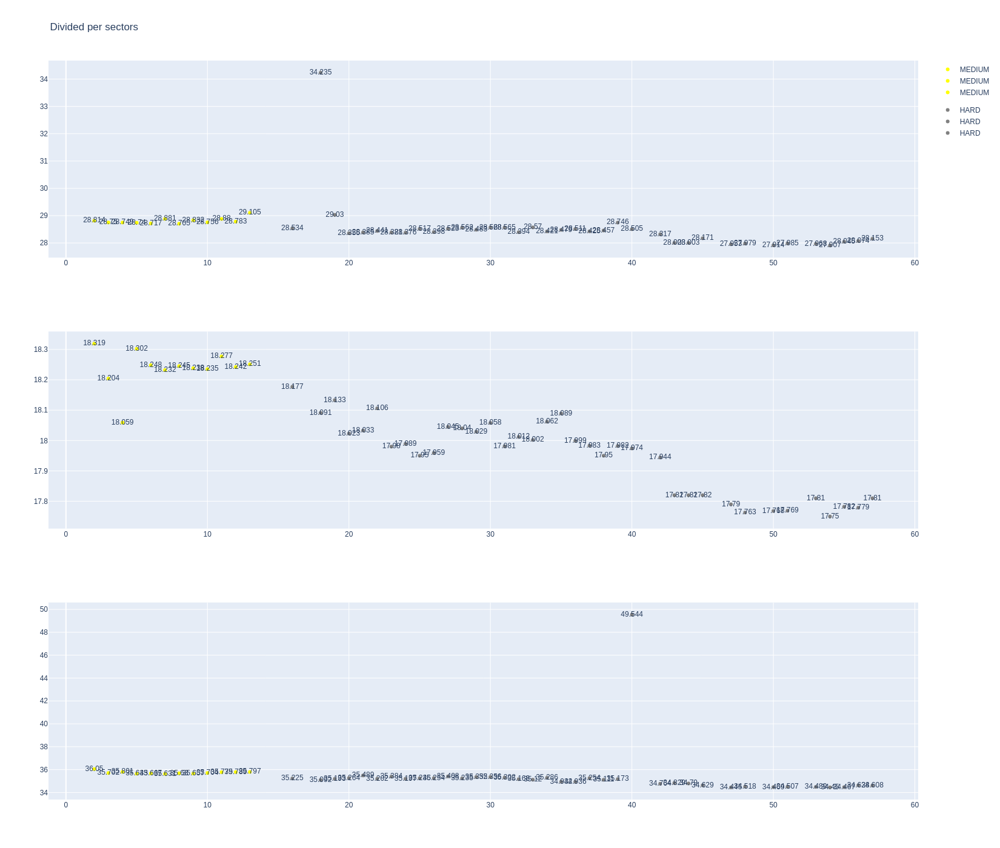

In [212]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [213]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
37,Oscar PIASTRI,MEDIUM,2024-03-24T04:04:43.928000+00:00,2,29.201,18.266,35.765,83.232
56,Oscar PIASTRI,MEDIUM,2024-03-24T04:06:07.073000+00:00,3,28.862,18.065,35.742,82.669
75,Oscar PIASTRI,MEDIUM,2024-03-24T04:07:29.782000+00:00,4,28.914,18.092,35.575,82.581
93,Oscar PIASTRI,MEDIUM,2024-03-24T04:08:52.326000+00:00,5,28.691,17.918,35.985,82.594
110,Oscar PIASTRI,MEDIUM,2024-03-24T04:10:14.972000+00:00,6,28.860,17.959,35.763,82.582
126,Oscar PIASTRI,MEDIUM,2024-03-24T04:11:37.596000+00:00,7,28.930,17.931,36.016,82.877
142,Oscar PIASTRI,MEDIUM,2024-03-24T04:13:00.522000+00:00,8,28.843,18.018,36.191,83.052
157,Oscar PIASTRI,MEDIUM,2024-03-24T04:14:23.521000+00:00,9,28.804,17.895,49.802,96.501
189,Oscar PIASTRI,HARD,2024-03-24T04:17:27.870000+00:00,11,28.662,17.907,36.159,82.728
207,Oscar PIASTRI,HARD,2024-03-24T04:18:50.513000+00:00,12,29.063,18.222,35.663,82.948


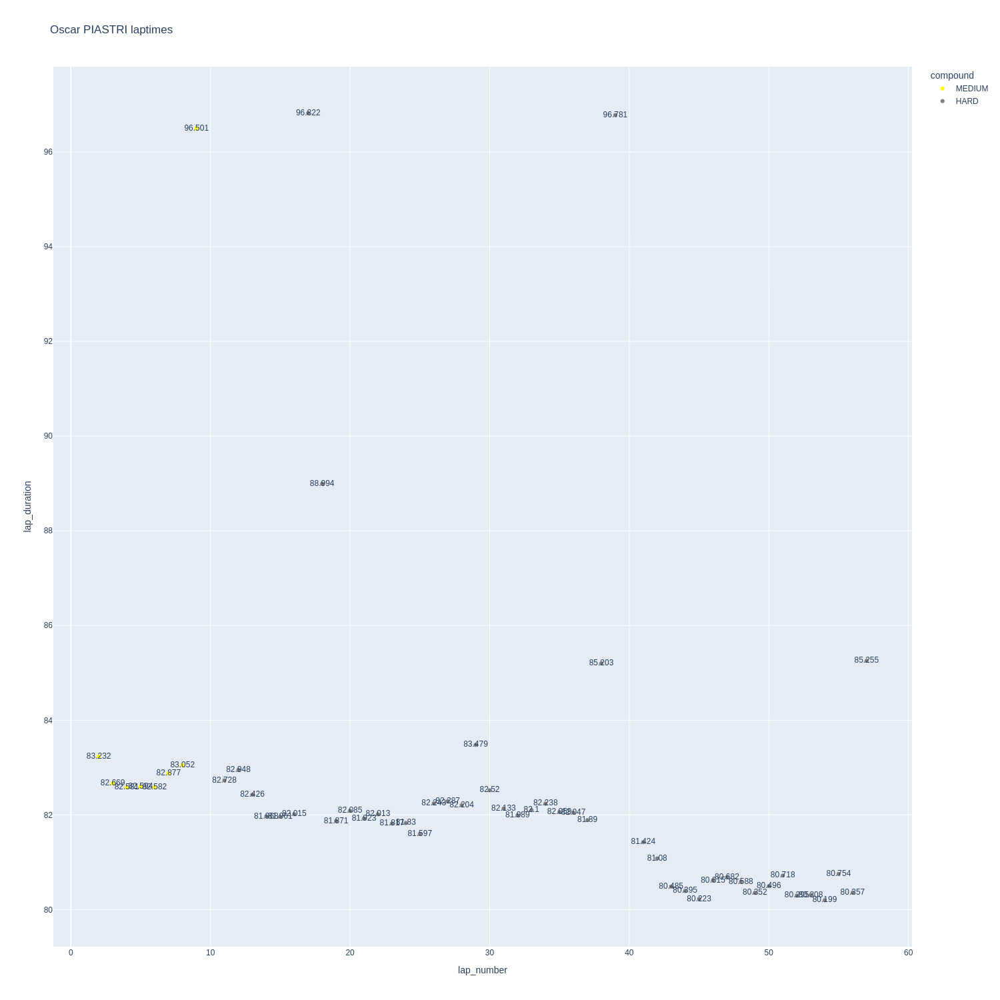

In [214]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

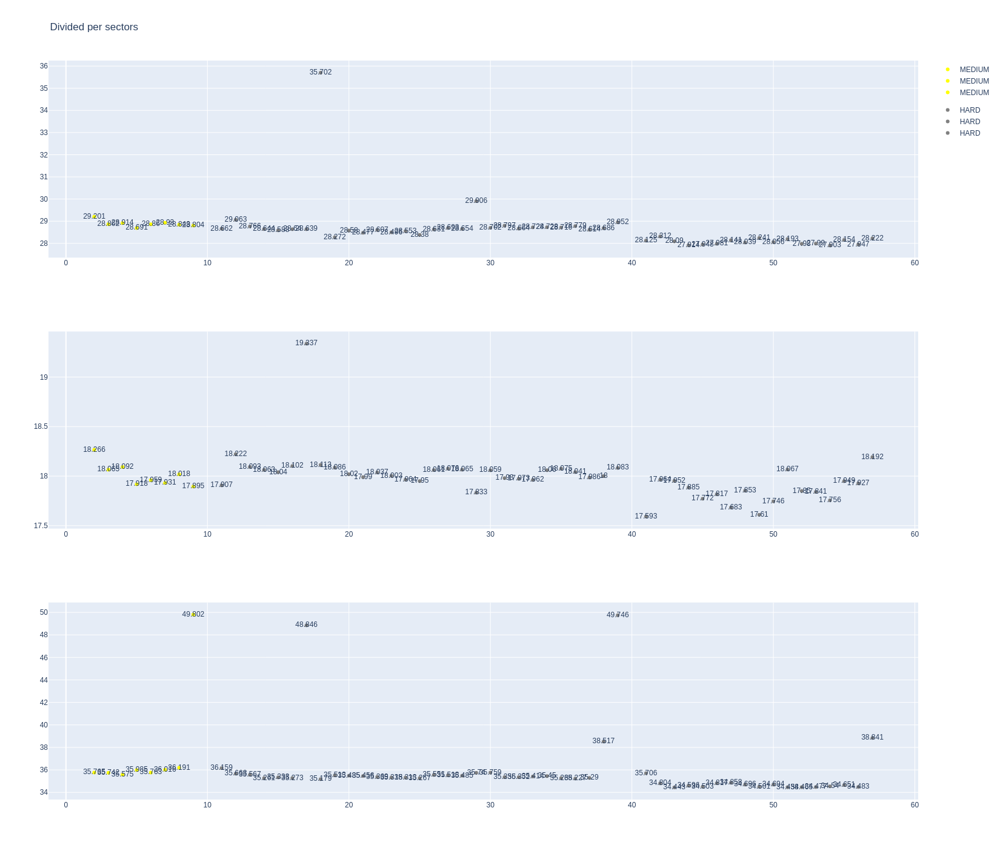

In [215]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [216]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1231,9488,1,18,1,8,MEDIUM,1
17,1231,9488,1,14,1,17,HARD,1
25,1231,9488,2,18,9,37,HARD,1
37,1231,9488,2,14,18,41,MEDIUM,1
47,1231,9488,3,18,38,59,HARD,0
51,1231,9488,3,14,42,59,HARD,1


In [217]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
24,Fernando ALONSO,HARD,2024-03-24T04:04:47.334000+00:00,2,29.590,18.419,36.275,84.284
43,Fernando ALONSO,HARD,2024-03-24T04:06:11.730000+00:00,3,28.865,18.223,35.890,82.978
62,Fernando ALONSO,HARD,2024-03-24T04:07:34.672000+00:00,4,29.019,18.082,36.641,83.742
80,Fernando ALONSO,HARD,2024-03-24T04:08:58.306000+00:00,5,28.967,18.355,35.972,83.294
97,Fernando ALONSO,HARD,2024-03-24T04:10:21.745000+00:00,6,29.130,18.130,35.936,83.196
115,Fernando ALONSO,HARD,2024-03-24T04:11:44.865000+00:00,7,28.901,18.077,35.817,82.795
131,Fernando ALONSO,HARD,2024-03-24T04:13:07.626000+00:00,8,28.605,18.317,35.847,82.769
147,Fernando ALONSO,HARD,2024-03-24T04:14:30.321000+00:00,9,29.058,18.168,36.119,83.345
162,Fernando ALONSO,HARD,2024-03-24T04:15:53.661000+00:00,10,28.563,18.363,35.682,82.608
176,Fernando ALONSO,HARD,2024-03-24T04:17:16.428000+00:00,11,28.895,18.338,35.706,82.939


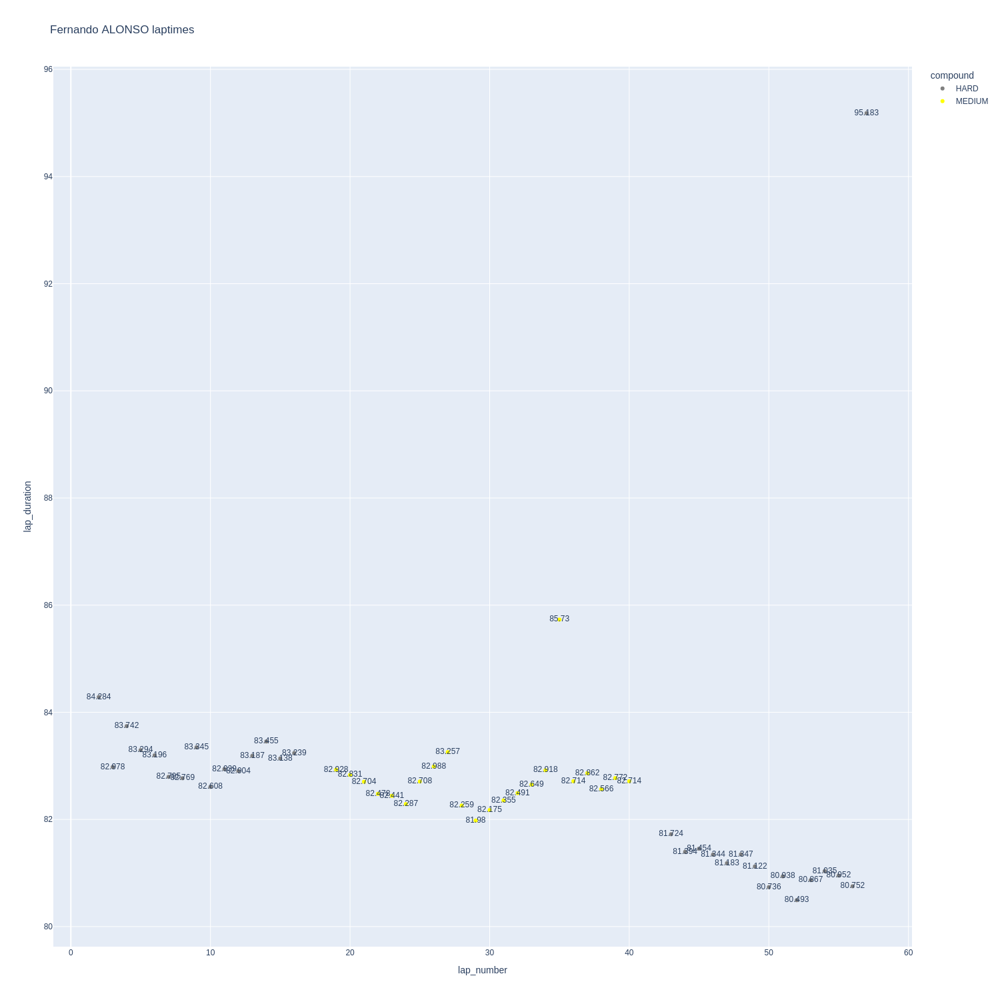

In [218]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

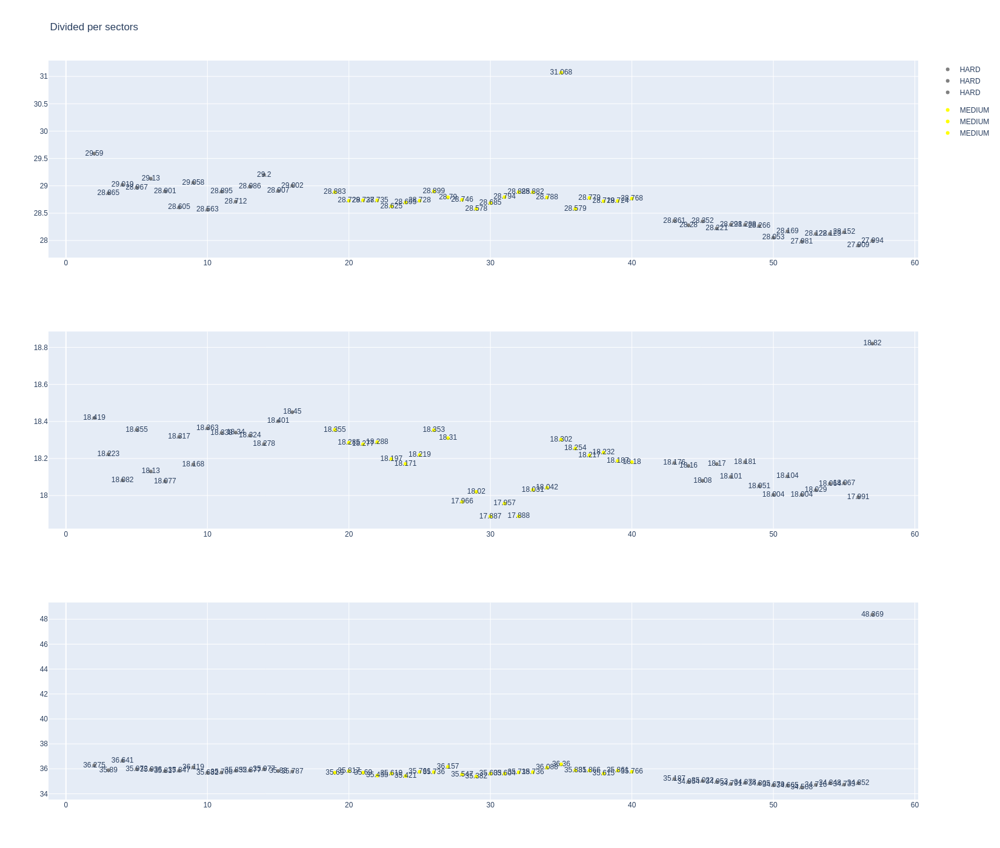

In [219]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [220]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
26,Lance STROLL,MEDIUM,2024-03-24T04:04:45.727000+00:00,2,29.507,18.117,35.927,83.551
45,Lance STROLL,MEDIUM,2024-03-24T04:06:09.215000+00:00,3,29.015,18.169,36.012,83.196
64,Lance STROLL,MEDIUM,2024-03-24T04:07:32.429000+00:00,4,28.949,18.130,36.375,83.454
82,Lance STROLL,MEDIUM,2024-03-24T04:08:55.843000+00:00,5,28.941,18.062,36.334,83.337
99,Lance STROLL,MEDIUM,2024-03-24T04:10:19.302000+00:00,6,28.902,18.106,36.019,83.027
117,Lance STROLL,MEDIUM,2024-03-24T04:11:42.268000+00:00,7,28.945,18.021,36.053,83.019
133,Lance STROLL,MEDIUM,2024-03-24T04:13:05.271000+00:00,8,28.791,18.042,50.529,97.362
163,Lance STROLL,HARD,2024-03-24T04:16:10.592000+00:00,10,28.763,18.299,35.821,82.883
178,Lance STROLL,HARD,2024-03-24T04:17:33.378000+00:00,11,28.755,18.212,35.751,82.718
196,Lance STROLL,HARD,2024-03-24T04:18:56.182000+00:00,12,28.858,18.308,35.897,83.063


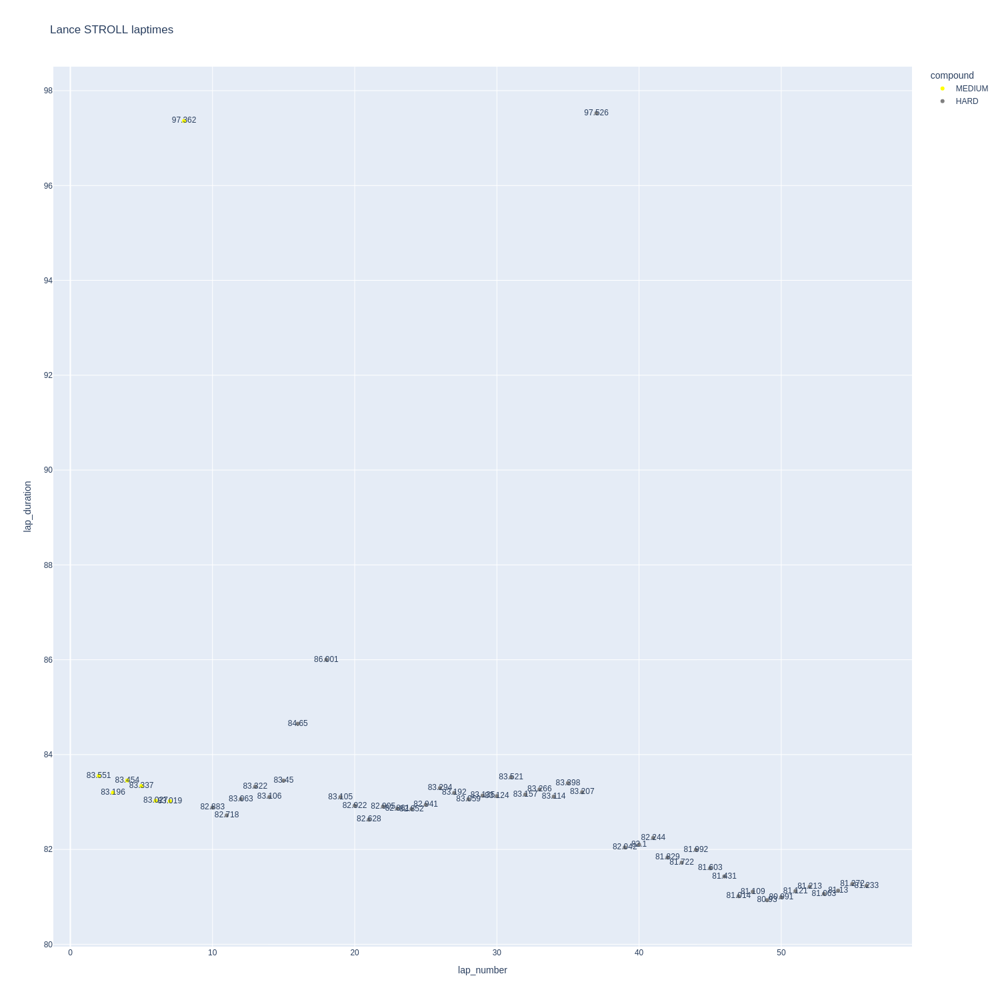

In [221]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

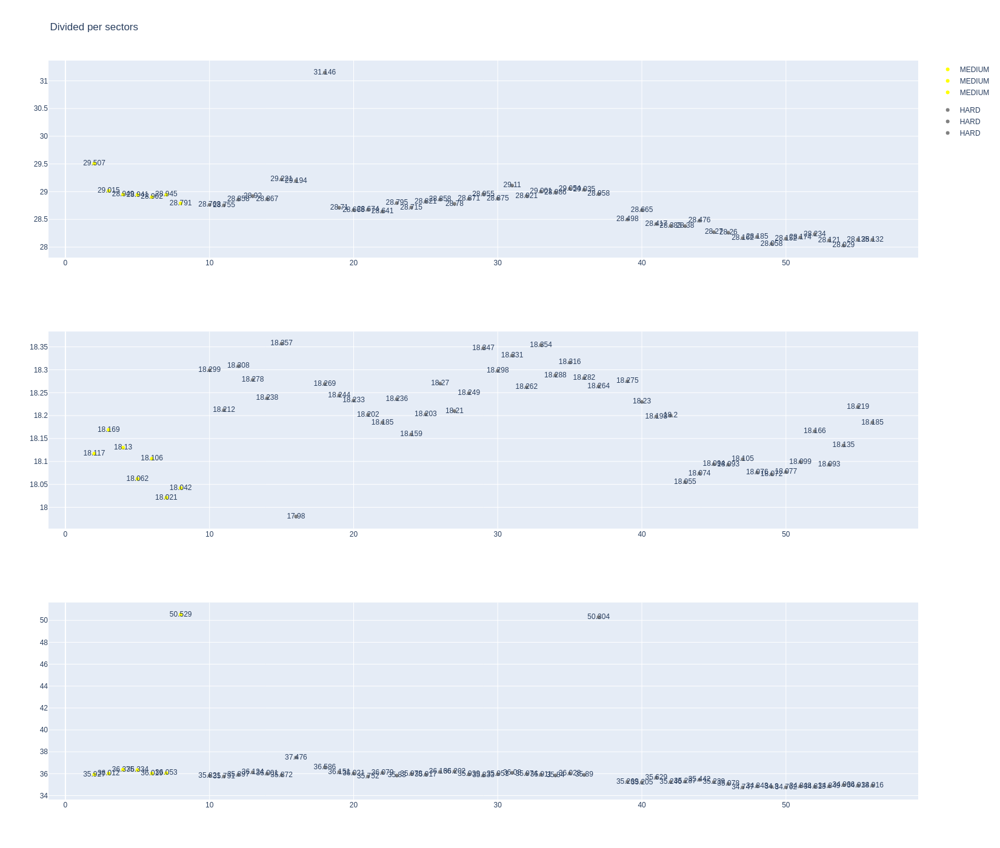

In [222]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [223]:
stintInformation.query('driver_number == 3 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1231,9488,1,3,1,5,SOFT,0
10,1231,9488,1,22,1,9,MEDIUM,0
19,1231,9488,2,3,6,29,HARD,0
29,1231,9488,2,22,10,36,HARD,0
39,1231,9488,3,3,30,58,HARD,0
46,1231,9488,3,22,37,59,HARD,0


In [224]:
data = libraryDataF1.getinfolongruns(jointables,3,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Daniel RICCIARDO,SOFT,2024-03-24T04:04:50.510000+00:00,2,29.987,18.107,36.732,84.826
39,Daniel RICCIARDO,SOFT,2024-03-24T04:06:15.342000+00:00,3,29.486,18.113,36.241,83.840
58,Daniel RICCIARDO,SOFT,2024-03-24T04:07:39.126000+00:00,4,29.291,18.222,36.582,84.095
111,Daniel RICCIARDO,HARD,2024-03-24T04:12:12.605000+00:00,7,29.836,18.238,35.966,84.040
127,Daniel RICCIARDO,HARD,2024-03-24T04:13:36.726000+00:00,8,29.153,18.481,35.974,83.608
143,Daniel RICCIARDO,HARD,2024-03-24T04:15:00.248000+00:00,9,29.023,18.506,35.962,83.491
158,Daniel RICCIARDO,HARD,2024-03-24T04:16:23.792000+00:00,10,29.012,18.394,35.839,83.245
172,Daniel RICCIARDO,HARD,2024-03-24T04:17:46.979000+00:00,11,28.925,18.291,35.867,83.083
190,Daniel RICCIARDO,HARD,2024-03-24T04:19:10.170000+00:00,12,28.940,18.339,35.779,83.058
208,Daniel RICCIARDO,HARD,2024-03-24T04:20:33.189000+00:00,13,28.856,18.242,35.806,82.904


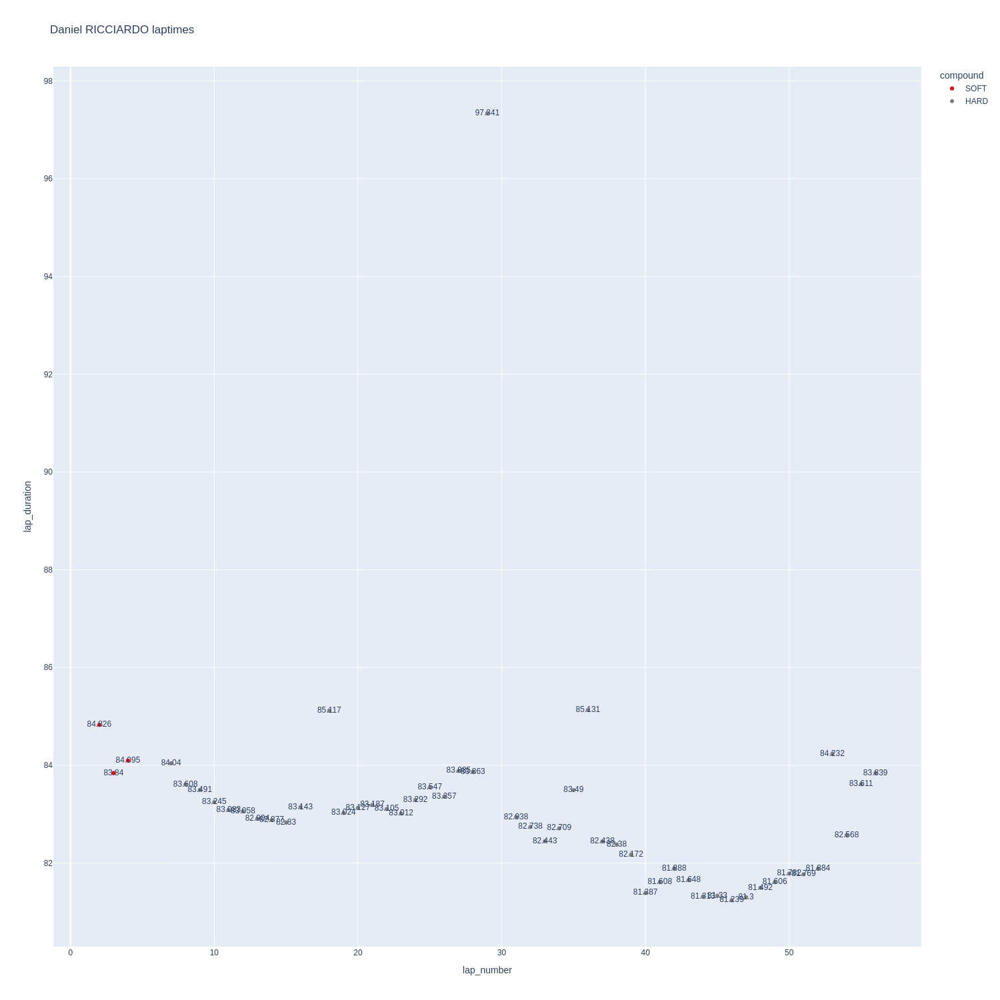

In [225]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

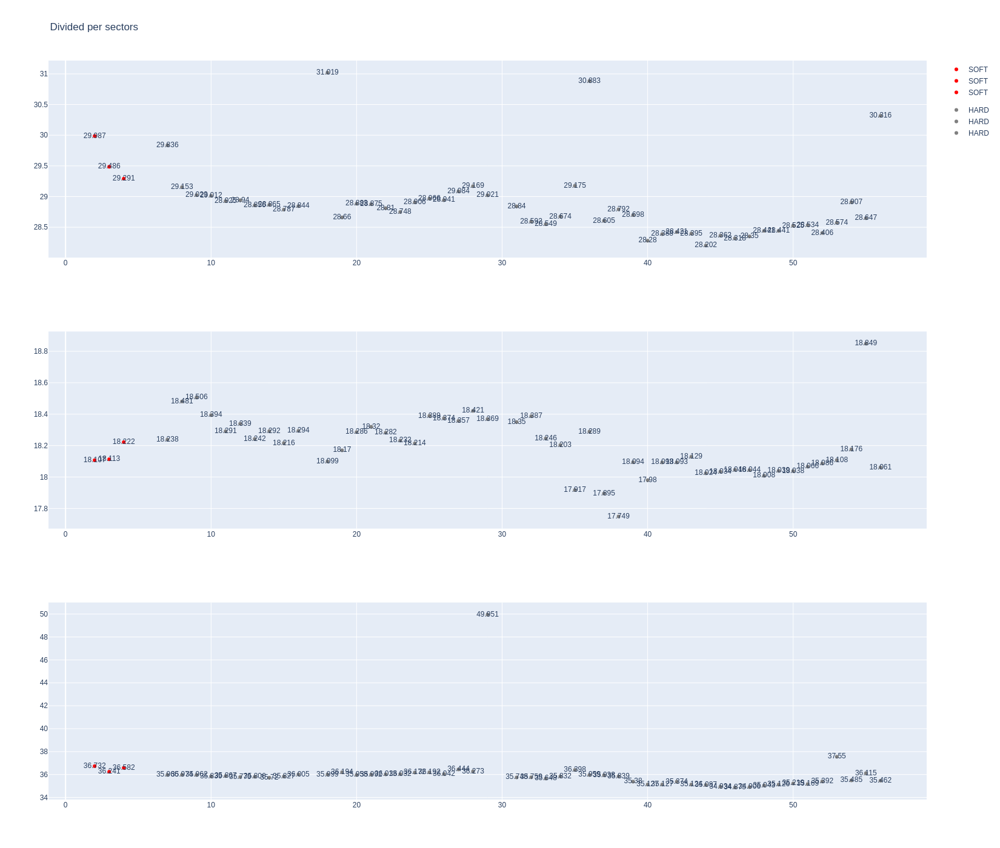

In [226]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [227]:
data = libraryDataF1.getinfolongruns(jointables,22,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
28,Yuki TSUNODA,MEDIUM,2024-03-24T04:04:46.204000+00:00,2,29.709,18.016,36.082,83.807
47,Yuki TSUNODA,MEDIUM,2024-03-24T04:06:09.953000+00:00,3,29.009,18.089,36.105,83.203
66,Yuki TSUNODA,MEDIUM,2024-03-24T04:07:33.151000+00:00,4,29.050,18.104,36.280,83.434
84,Yuki TSUNODA,MEDIUM,2024-03-24T04:08:56.502000+00:00,5,29.072,18.048,36.190,83.310
101,Yuki TSUNODA,MEDIUM,2024-03-24T04:10:19.879000+00:00,6,29.026,18.115,36.304,83.445
119,Yuki TSUNODA,MEDIUM,2024-03-24T04:11:43.429000+00:00,7,28.848,17.947,36.069,82.864
134,Yuki TSUNODA,MEDIUM,2024-03-24T04:13:06.297000+00:00,8,28.869,18.224,36.288,83.381
180,Yuki TSUNODA,HARD,2024-03-24T04:17:37.643000+00:00,11,28.912,18.290,35.696,82.898
198,Yuki TSUNODA,HARD,2024-03-24T04:19:00.620000+00:00,12,28.776,18.268,35.755,82.799
216,Yuki TSUNODA,HARD,2024-03-24T04:20:23.549000+00:00,13,28.720,18.212,36.100,83.032


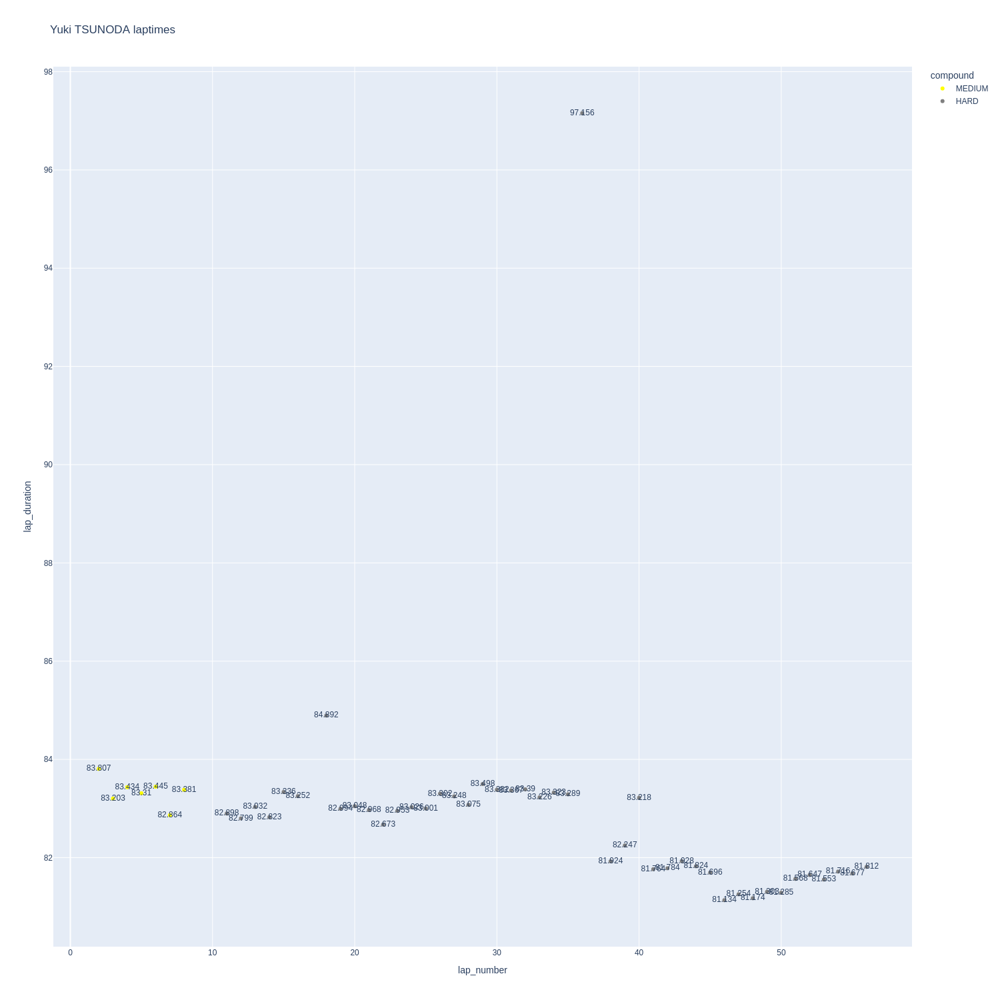

In [228]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

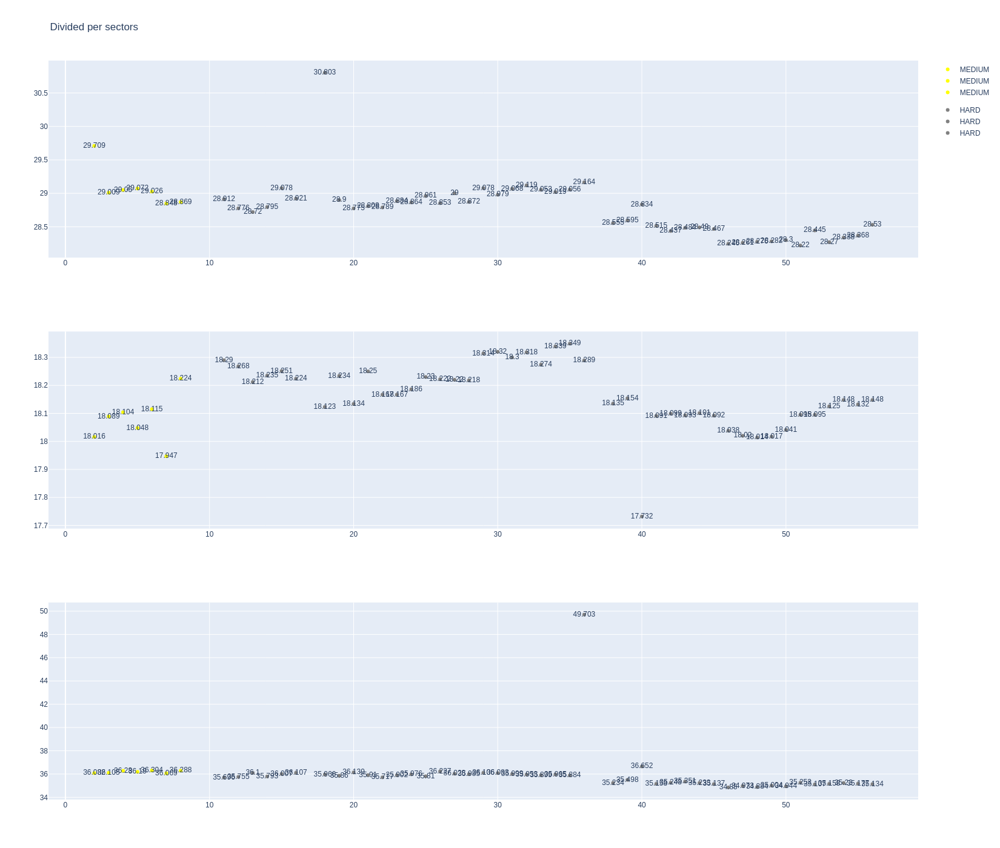

In [229]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [230]:
stintInformation.query('driver_number == 20 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1231,9488,1,20,1,7,MEDIUM,0
18,1231,9488,1,27,1,17,HARD,0
23,1231,9488,2,20,8,33,HARD,0
35,1231,9488,2,27,18,35,MEDIUM,0
40,1231,9488,3,20,34,58,HARD,0
44,1231,9488,3,27,36,59,HARD,0


In [231]:
data = libraryDataF1.getinfolongruns(jointables,20,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
27,Kevin MAGNUSSEN,MEDIUM,2024-03-24T04:04:48.327000+00:00,2,29.856,18.052,36.340,84.248
46,Kevin MAGNUSSEN,MEDIUM,2024-03-24T04:06:12.551000+00:00,3,29.255,18.095,36.215,83.565
65,Kevin MAGNUSSEN,MEDIUM,2024-03-24T04:07:36.133000+00:00,4,29.068,18.018,36.443,83.529
83,Kevin MAGNUSSEN,MEDIUM,2024-03-24T04:08:59.630000+00:00,5,29.446,18.061,36.454,83.961
100,Kevin MAGNUSSEN,MEDIUM,2024-03-24T04:10:23.621000+00:00,6,29.211,18.296,36.447,83.954
118,Kevin MAGNUSSEN,MEDIUM,2024-03-24T04:11:47.638000+00:00,7,29.198,18.137,50.610,97.945
149,Kevin MAGNUSSEN,HARD,2024-03-24T04:14:55.555000+00:00,9,29.317,18.413,35.932,83.662
164,Kevin MAGNUSSEN,HARD,2024-03-24T04:16:19.170000+00:00,10,29.145,17.985,36.541,83.671
179,Kevin MAGNUSSEN,HARD,2024-03-24T04:17:42.858000+00:00,11,29.073,18.025,36.224,83.322
197,Kevin MAGNUSSEN,HARD,2024-03-24T04:19:06.195000+00:00,12,29.117,17.971,36.022,83.110


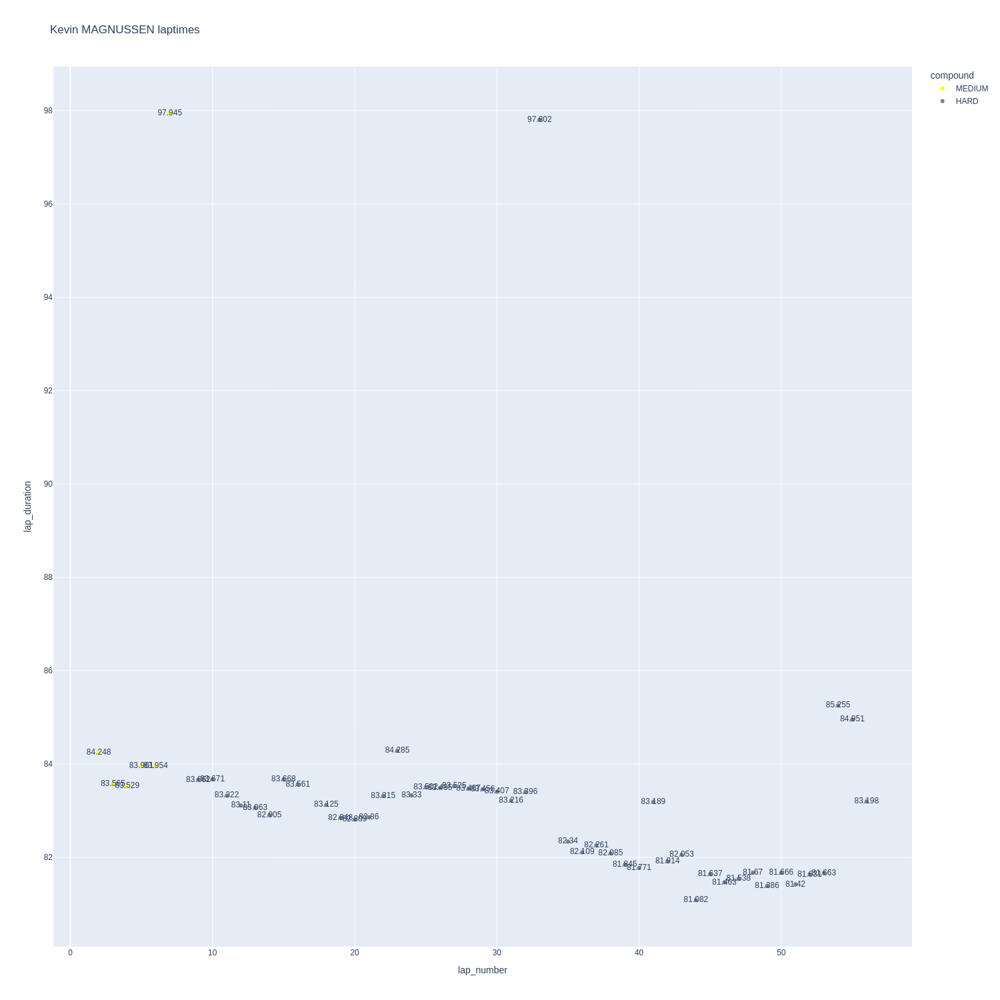

In [232]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

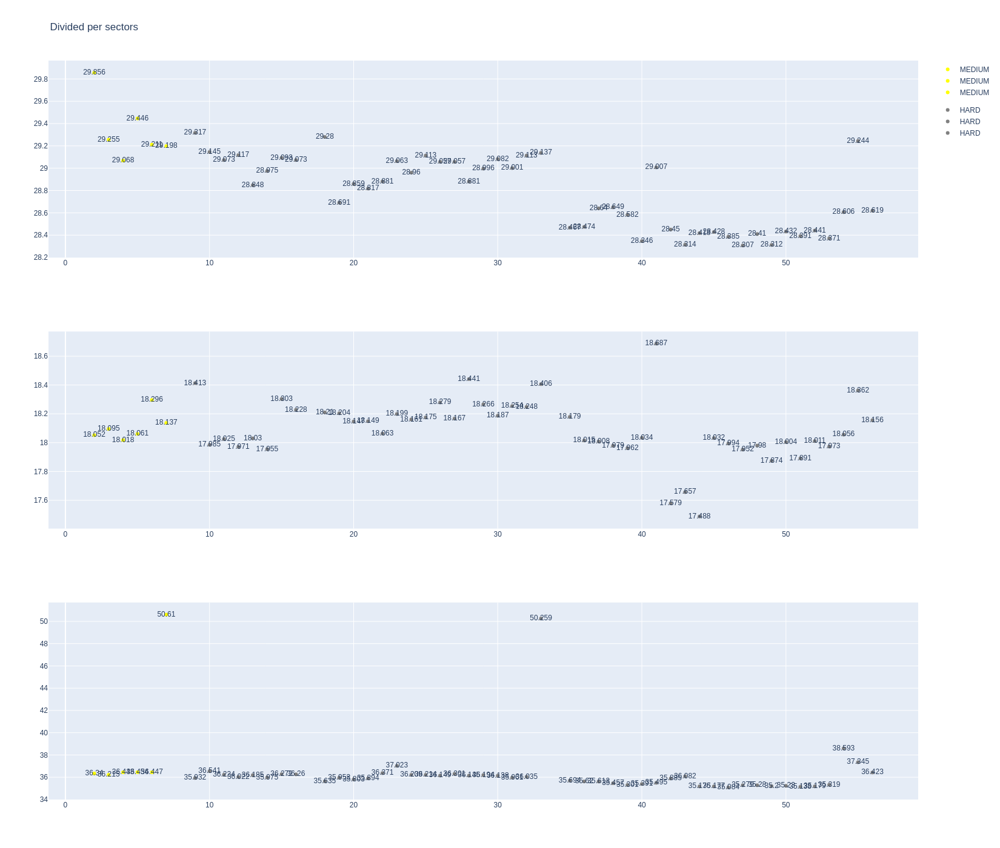

In [233]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [234]:
data = libraryDataF1.getinfolongruns(jointables,27,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
31,Nico HULKENBERG,HARD,2024-03-24T04:04:49.823000+00:00,2,29.987,17.967,36.753,84.707
50,Nico HULKENBERG,HARD,2024-03-24T04:06:14.546000+00:00,3,29.211,17.961,36.404,83.576
69,Nico HULKENBERG,HARD,2024-03-24T04:07:38.106000+00:00,4,29.279,17.896,36.556,83.731
87,Nico HULKENBERG,HARD,2024-03-24T04:09:01.715000+00:00,5,29.917,18.222,36.326,84.465
104,Nico HULKENBERG,HARD,2024-03-24T04:10:26.273000+00:00,6,29.454,18.156,36.137,83.747
120,Nico HULKENBERG,HARD,2024-03-24T04:11:50+00:00,7,29.240,18.255,36.373,83.868
137,Nico HULKENBERG,HARD,2024-03-24T04:13:13.822000+00:00,8,29.280,18.187,36.371,83.838
153,Nico HULKENBERG,HARD,2024-03-24T04:14:37.728000+00:00,9,29.292,18.189,36.375,83.856
167,Nico HULKENBERG,HARD,2024-03-24T04:16:01.571000+00:00,10,29.195,18.304,36.278,83.777
183,Nico HULKENBERG,HARD,2024-03-24T04:17:25.360000+00:00,11,29.300,18.421,37.349,85.070


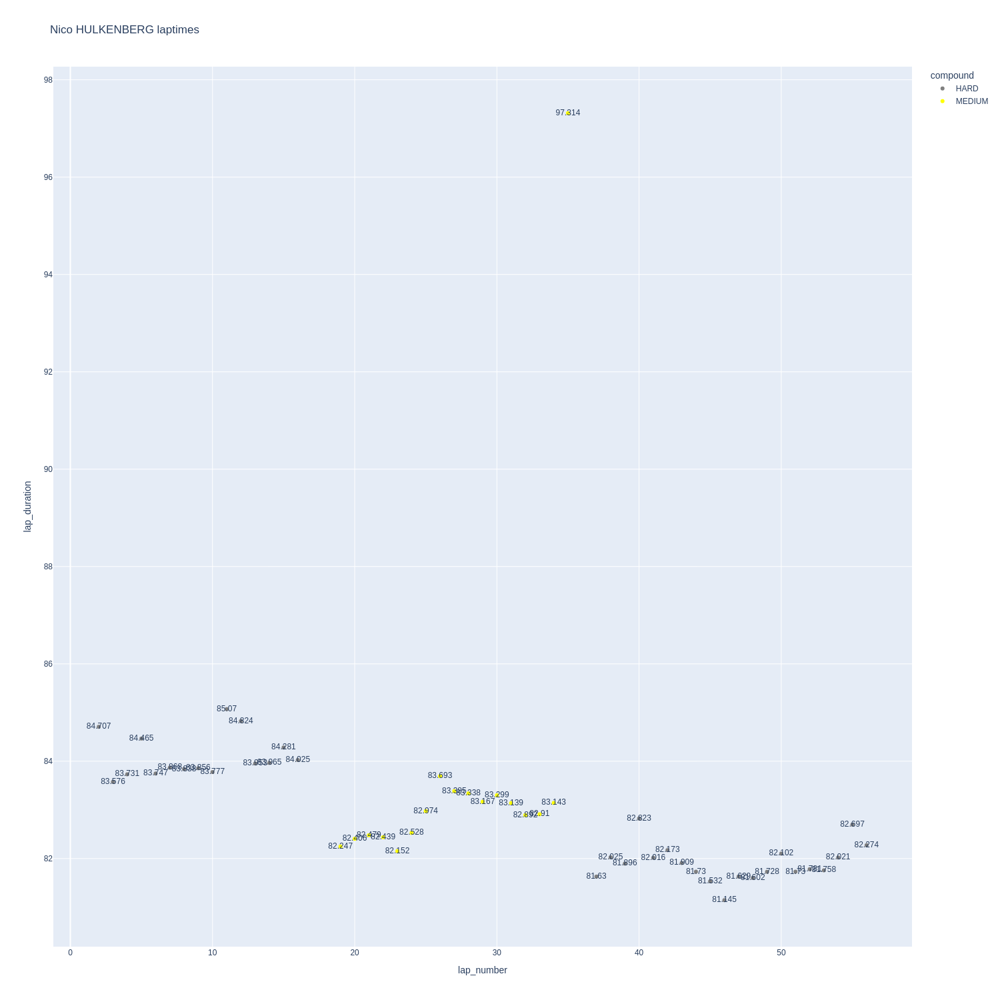

In [235]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

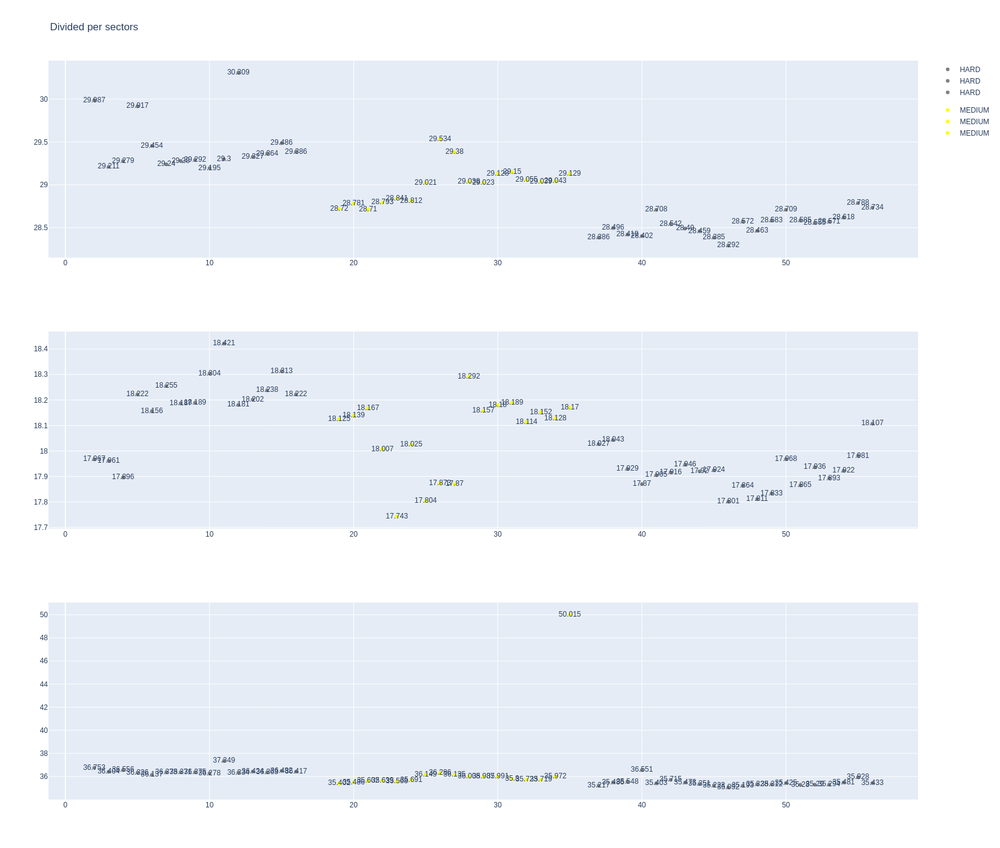

In [236]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [237]:
stintInformation.query('driver_number == 10 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
11,1231,9488,1,31,1,9,MEDIUM,0
16,1231,9488,1,10,1,17,MEDIUM,0
27,1231,9488,2,31,10,16,HARD,0
34,1231,9488,3,31,17,42,HARD,0
36,1231,9488,2,10,18,41,HARD,0
50,1231,9488,3,10,42,58,HARD,0
53,1231,9488,4,31,43,58,HARD,7


In [238]:
data =libraryDataF1.getinfolongruns(jointables,31,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
32,Esteban OCON,MEDIUM,2024-03-24T04:04:49.132000+00:00,2,30.049,18.139,36.492,84.680
51,Esteban OCON,MEDIUM,2024-03-24T04:06:13.913000+00:00,3,29.145,18.189,36.243,83.577
70,Esteban OCON,MEDIUM,2024-03-24T04:07:37.370000+00:00,4,29.067,18.211,36.296,83.574
88,Esteban OCON,MEDIUM,2024-03-24T04:09:01.056000+00:00,5,29.260,18.166,36.358,83.784
105,Esteban OCON,MEDIUM,2024-03-24T04:10:24.784000+00:00,6,29.312,18.144,36.385,83.841
121,Esteban OCON,MEDIUM,2024-03-24T04:11:48.589000+00:00,7,29.006,18.045,36.147,83.198
138,Esteban OCON,MEDIUM,2024-03-24T04:13:11.884000+00:00,8,28.720,18.308,35.952,82.980
154,Esteban OCON,MEDIUM,2024-03-24T04:14:34.712000+00:00,9,29.049,18.286,50.613,97.948
184,Esteban OCON,HARD,2024-03-24T04:17:42.133000+00:00,11,29.052,18.138,36.149,83.339
202,Esteban OCON,HARD,2024-03-24T04:19:05.488000+00:00,12,29.059,18.017,35.806,82.882


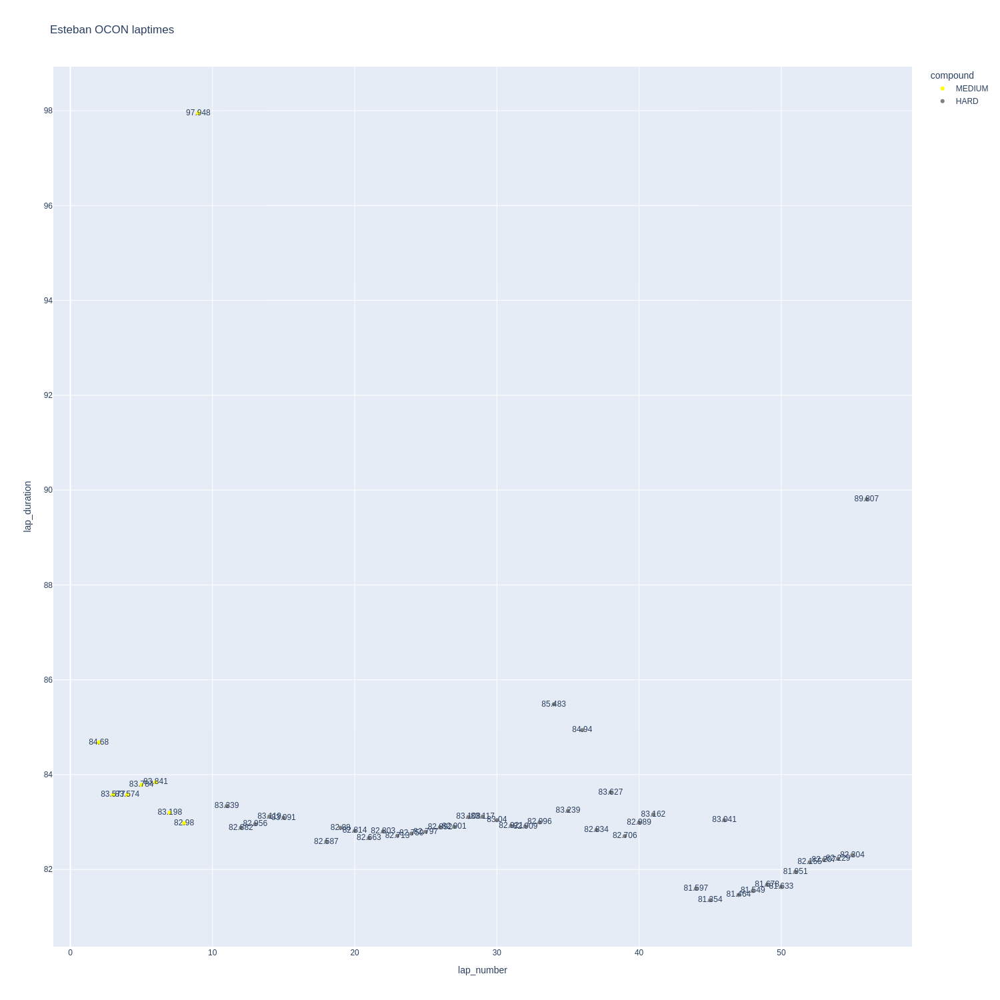

In [239]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

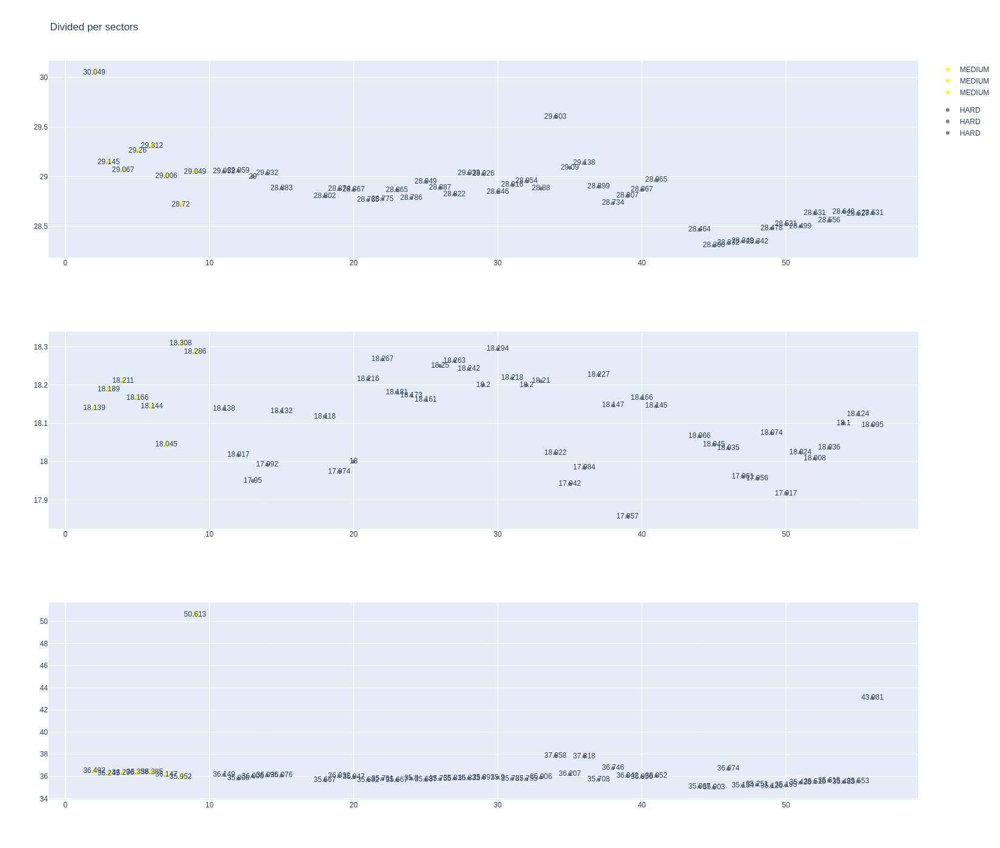

In [240]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [241]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
22,Pierre GASLY,MEDIUM,2024-03-24T04:04:50.139000+00:00,2,29.905,18.241,36.503,84.649
41,Pierre GASLY,MEDIUM,2024-03-24T04:06:14.858000+00:00,3,29.379,18.148,36.324,83.851
60,Pierre GASLY,MEDIUM,2024-03-24T04:07:38.665000+00:00,4,29.050,18.116,36.534,83.700
78,Pierre GASLY,MEDIUM,2024-03-24T04:09:02.395000+00:00,5,29.693,17.983,36.850,84.526
95,Pierre GASLY,MEDIUM,2024-03-24T04:10:26.993000+00:00,6,29.368,18.107,36.437,83.912
113,Pierre GASLY,MEDIUM,2024-03-24T04:11:50.794000+00:00,7,29.068,18.122,36.255,83.445
129,Pierre GASLY,MEDIUM,2024-03-24T04:13:14.260000+00:00,8,29.380,18.109,36.390,83.879
145,Pierre GASLY,MEDIUM,2024-03-24T04:14:38.092000+00:00,9,29.349,18.235,36.245,83.829
160,Pierre GASLY,MEDIUM,2024-03-24T04:16:01.924000+00:00,10,29.318,18.150,36.388,83.856
174,Pierre GASLY,MEDIUM,2024-03-24T04:17:25.830000+00:00,11,29.402,18.252,37.743,85.397


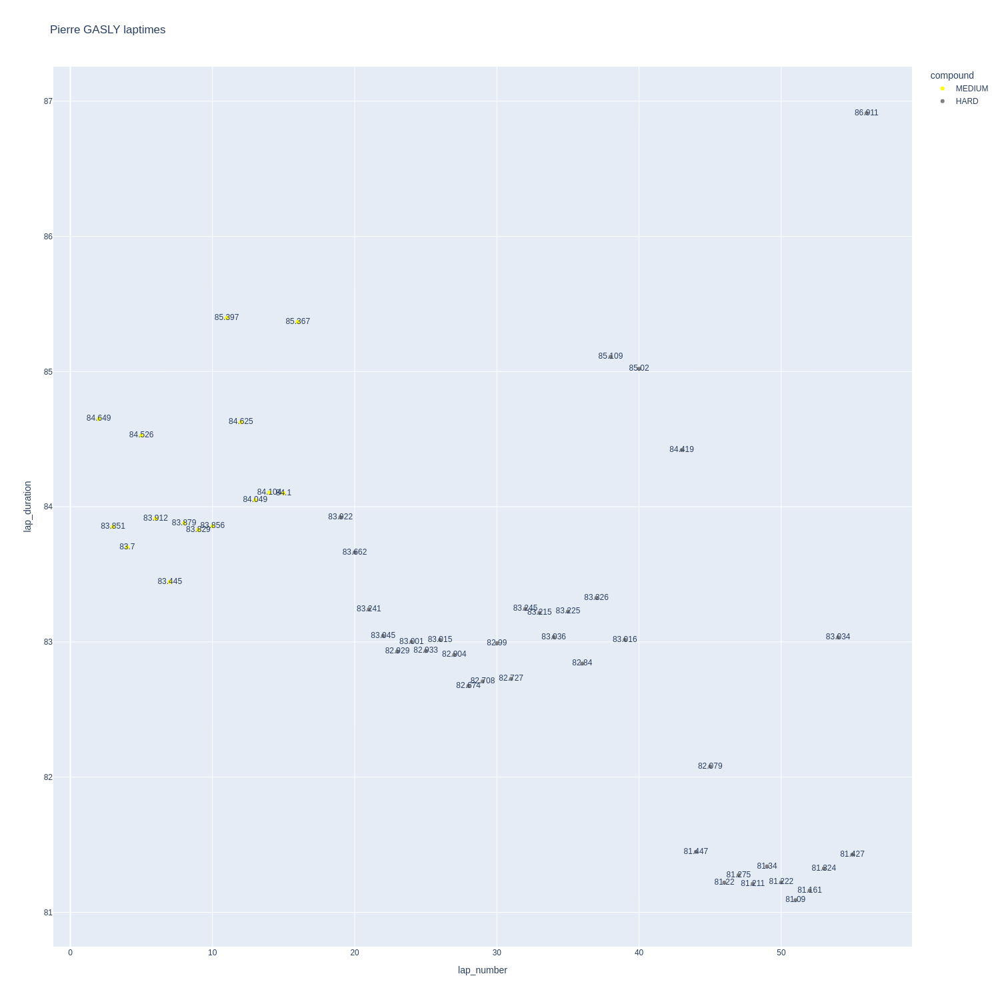

In [242]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

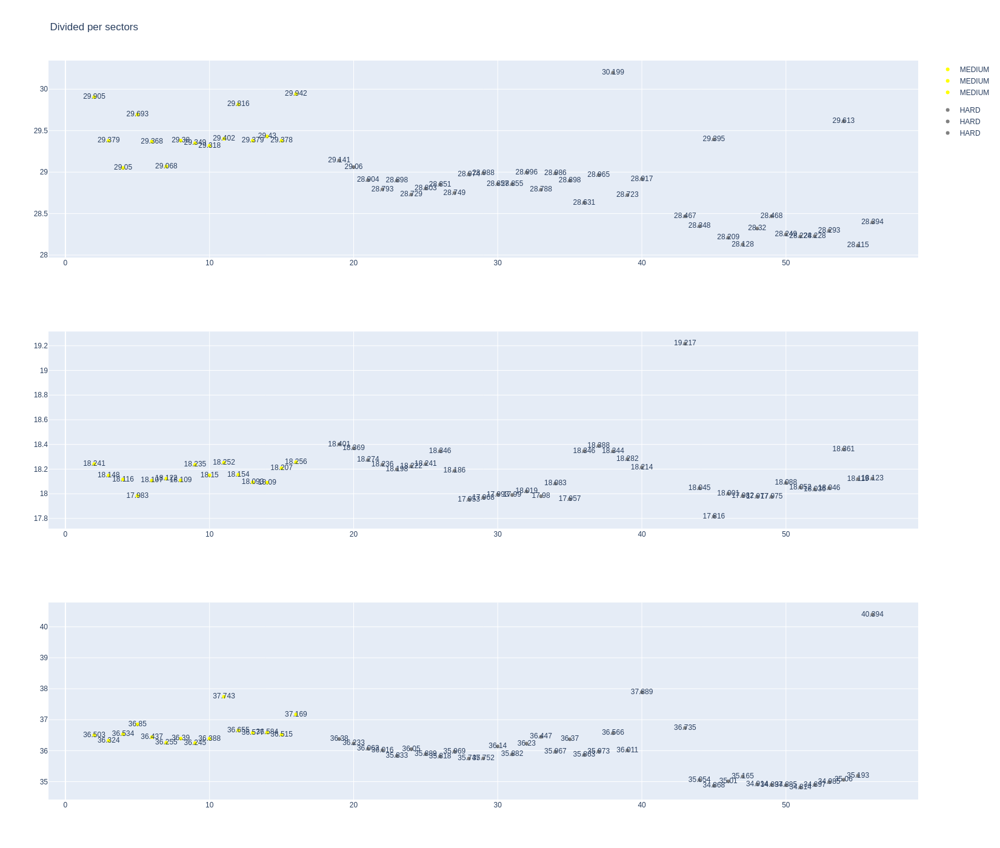

In [243]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [244]:
stintInformation.query('driver_number == 2 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1231,9488,1,23,1,6,MEDIUM,0
20,1231,9488,2,23,7,27,HARD,0
38,1231,9488,3,23,28,58,HARD,0


In [245]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
29,Alexander ALBON,MEDIUM,2024-03-24T04:04:48.660000+00:00,2,30.021,18.135,36.380,84.536
48,Alexander ALBON,MEDIUM,2024-03-24T04:06:13.314000+00:00,3,29.307,18.047,36.252,83.606
67,Alexander ALBON,MEDIUM,2024-03-24T04:07:36.823000+00:00,4,29.061,18.076,36.301,83.438
85,Alexander ALBON,MEDIUM,2024-03-24T04:09:00.159000+00:00,5,29.328,18.079,36.509,83.916
102,Alexander ALBON,MEDIUM,2024-03-24T04:10:24.053000+00:00,6,29.299,18.127,50.435,97.861
135,Alexander ALBON,HARD,2024-03-24T04:13:30.411000+00:00,8,29.377,18.444,35.899,83.720
151,Alexander ALBON,HARD,2024-03-24T04:14:54.146000+00:00,9,29.274,18.408,35.963,83.645
165,Alexander ALBON,HARD,2024-03-24T04:16:17.782000+00:00,10,29.780,18.253,35.819,83.852
181,Alexander ALBON,HARD,2024-03-24T04:17:41.564000+00:00,11,29.091,18.333,35.830,83.254
199,Alexander ALBON,HARD,2024-03-24T04:19:04.910000+00:00,12,29.045,18.159,35.563,82.767


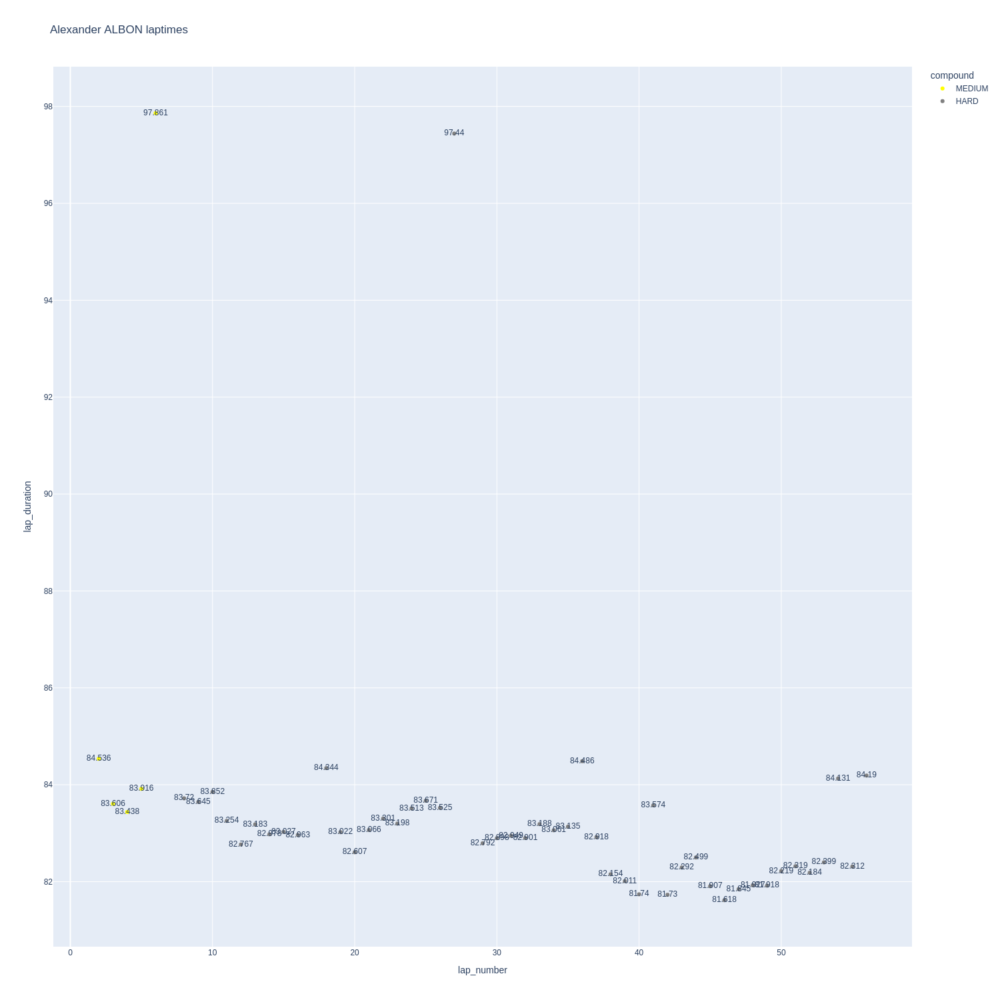

In [246]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

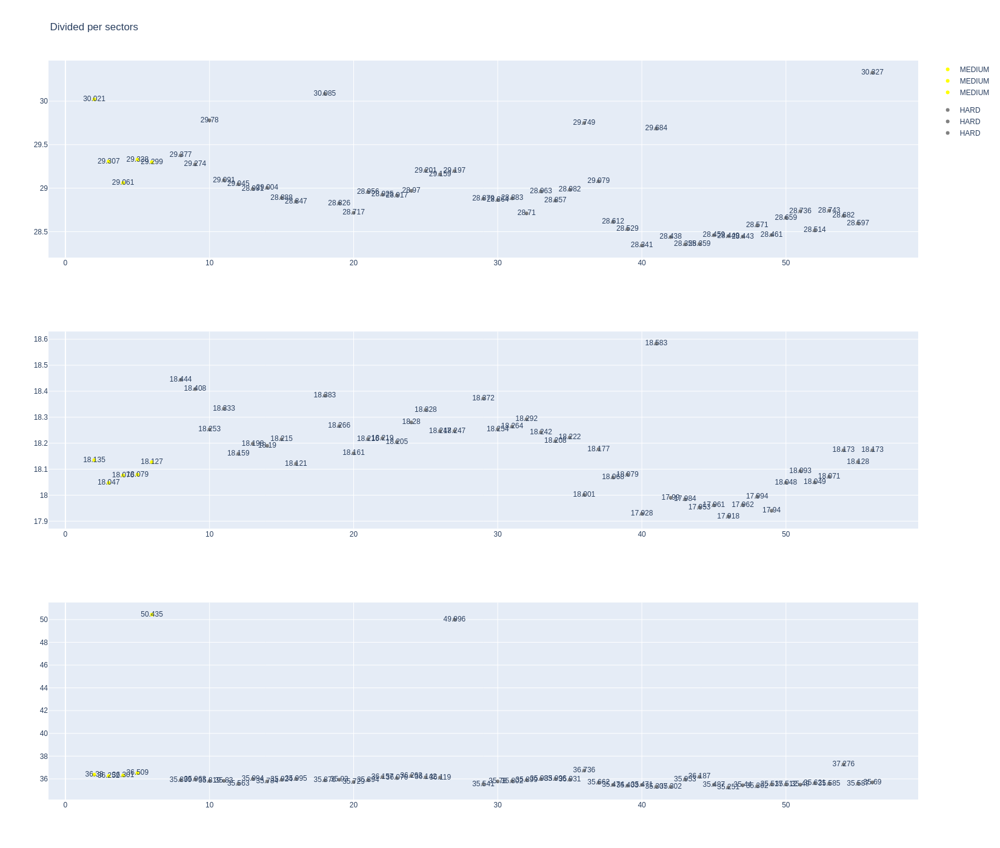

In [247]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [248]:
data= libraryDataF1.getinfolongruns(jointables,2,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [249]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [250]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [251]:
stintInformation.query('driver_number == 24 or driver_number == 77')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1231,9488,1,24,1,6,SOFT,1
8,1231,9488,1,77,1,8,MEDIUM,1
21,1231,9488,2,24,7,35,HARD,1
24,1231,9488,2,77,9,36,HARD,0
42,1231,9488,3,24,36,58,HARD,0
45,1231,9488,3,77,37,58,HARD,0


In [252]:
data = libraryDataF1.getinfolongruns(jointables,24,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
30,ZHOU Guanyu,SOFT,2024-03-24T04:04:51.598000+00:00,2,29.555,18.148,36.676,84.379
49,ZHOU Guanyu,SOFT,2024-03-24T04:06:15.948000+00:00,3,29.466,18.314,36.132,83.912
68,ZHOU Guanyu,SOFT,2024-03-24T04:07:39.879000+00:00,4,29.158,18.187,36.603,83.948
86,ZHOU Guanyu,SOFT,2024-03-24T04:09:03.825000+00:00,5,29.236,18.040,36.885,84.161
136,ZHOU Guanyu,HARD,2024-03-24T04:13:38.027000+00:00,8,29.497,18.682,36.223,84.402
152,ZHOU Guanyu,HARD,2024-03-24T04:15:02.469000+00:00,9,29.129,18.477,36.018,83.624
166,ZHOU Guanyu,HARD,2024-03-24T04:16:26.049000+00:00,10,29.197,18.524,35.939,83.660
182,ZHOU Guanyu,HARD,2024-03-24T04:17:49.802000+00:00,11,29.027,18.488,35.932,83.447
200,ZHOU Guanyu,HARD,2024-03-24T04:19:13.237000+00:00,12,28.869,18.421,35.887,83.177
218,ZHOU Guanyu,HARD,2024-03-24T04:20:36.428000+00:00,13,29.107,18.410,35.954,83.471


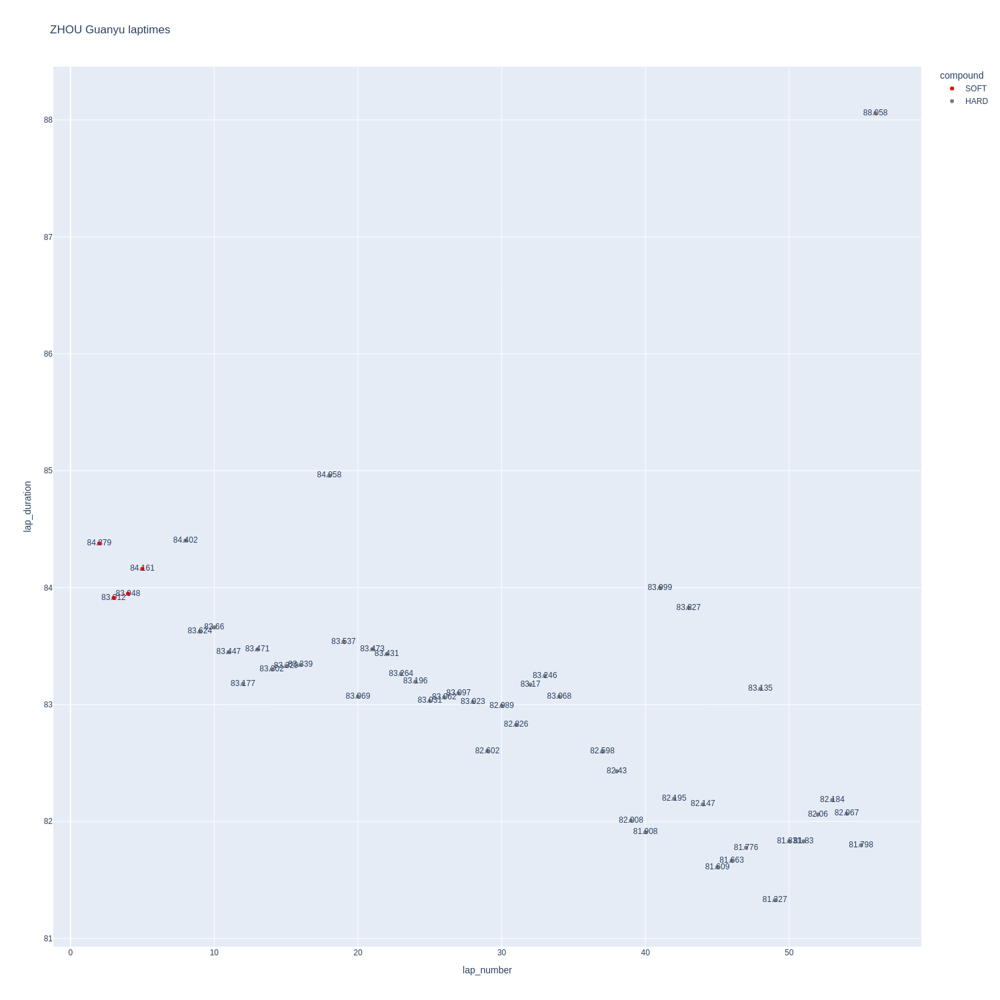

In [253]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

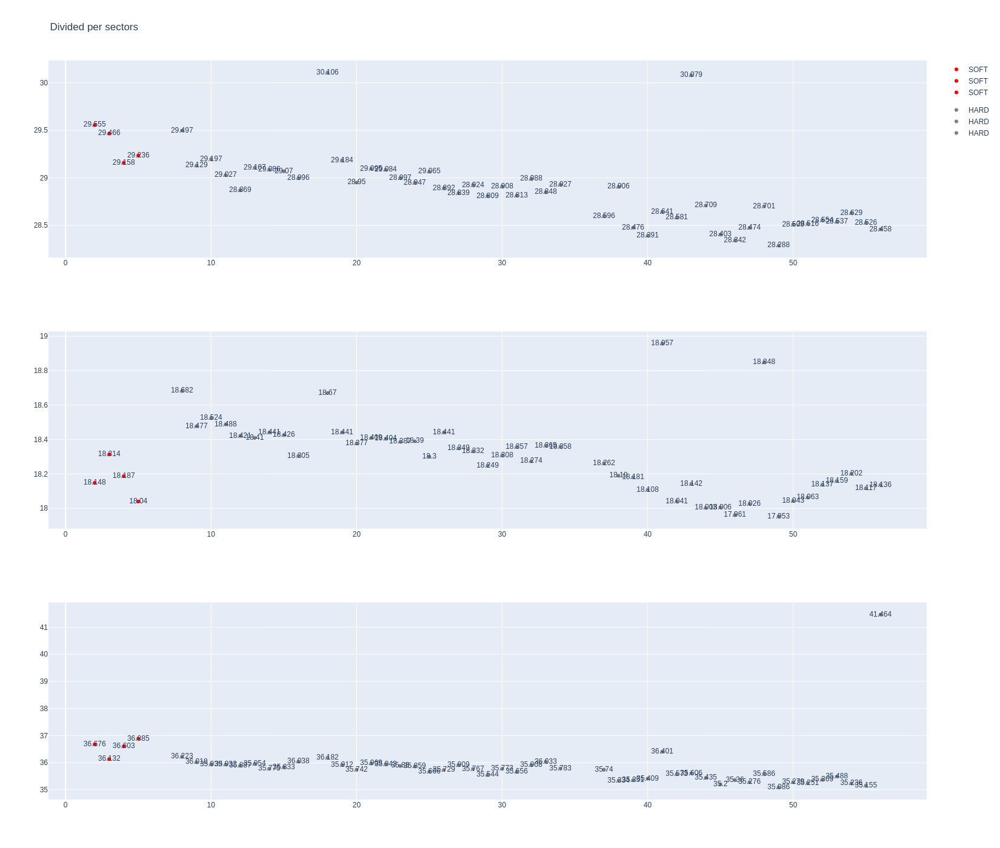

In [254]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [255]:
data = libraryDataF1.getinfolongruns(jointables,77,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
36,Valtteri BOTTAS,MEDIUM,2024-03-24T04:04:47.624000+00:00,2,29.948,18.320,36.076,84.344
55,Valtteri BOTTAS,MEDIUM,2024-03-24T04:06:12.023000+00:00,3,29.099,18.153,36.020,83.272
74,Valtteri BOTTAS,MEDIUM,2024-03-24T04:07:35.221000+00:00,4,29.226,18.314,36.165,83.705
92,Valtteri BOTTAS,MEDIUM,2024-03-24T04:08:58.949000+00:00,5,29.365,18.397,35.798,83.560
109,Valtteri BOTTAS,MEDIUM,2024-03-24T04:10:22.533000+00:00,6,29.091,18.070,35.961,83.122
125,Valtteri BOTTAS,MEDIUM,2024-03-24T04:11:45.614000+00:00,7,29.154,18.416,36.168,83.738
171,Valtteri BOTTAS,HARD,2024-03-24T04:16:45.934000+00:00,10,28.850,18.575,35.736,83.161
188,Valtteri BOTTAS,HARD,2024-03-24T04:18:09.059000+00:00,11,28.853,18.677,35.910,83.440
206,Valtteri BOTTAS,HARD,2024-03-24T04:19:32.582000+00:00,12,28.889,18.482,35.605,82.976
224,Valtteri BOTTAS,HARD,2024-03-24T04:20:55.550000+00:00,13,28.879,18.418,35.862,83.159


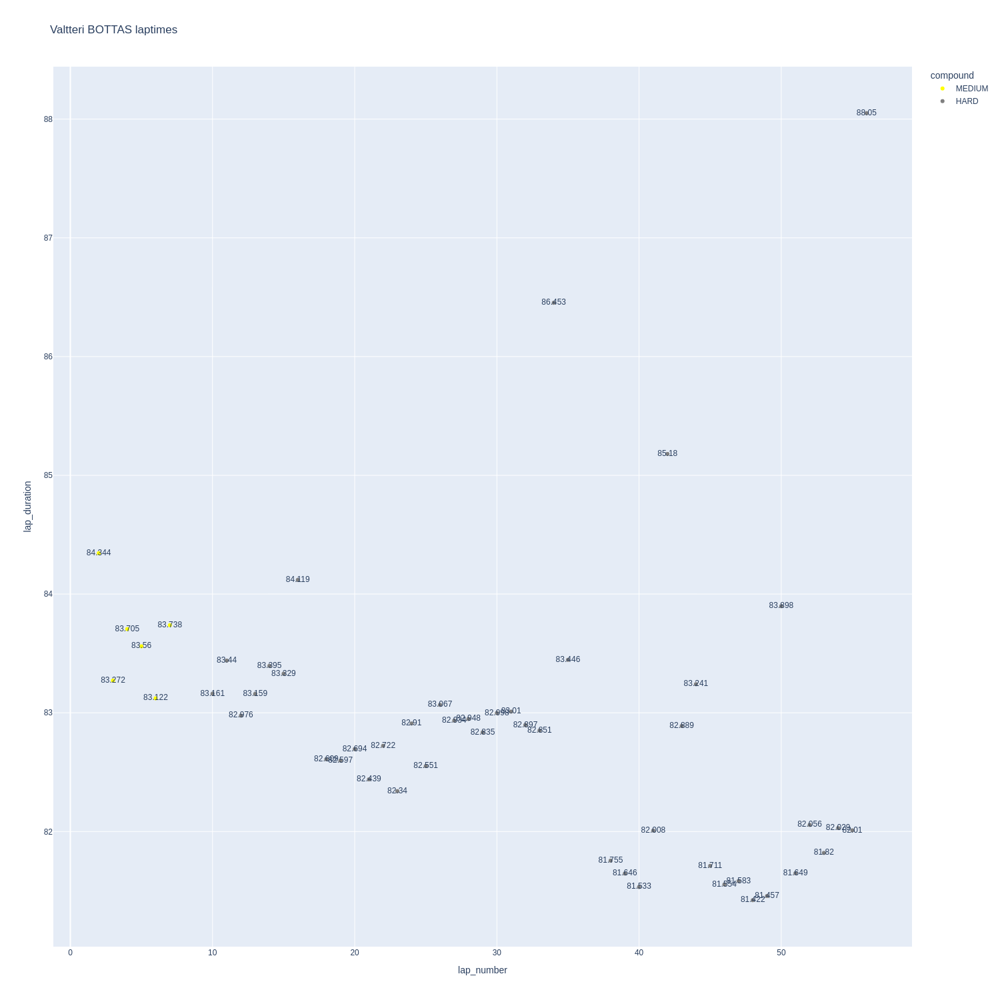

In [256]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

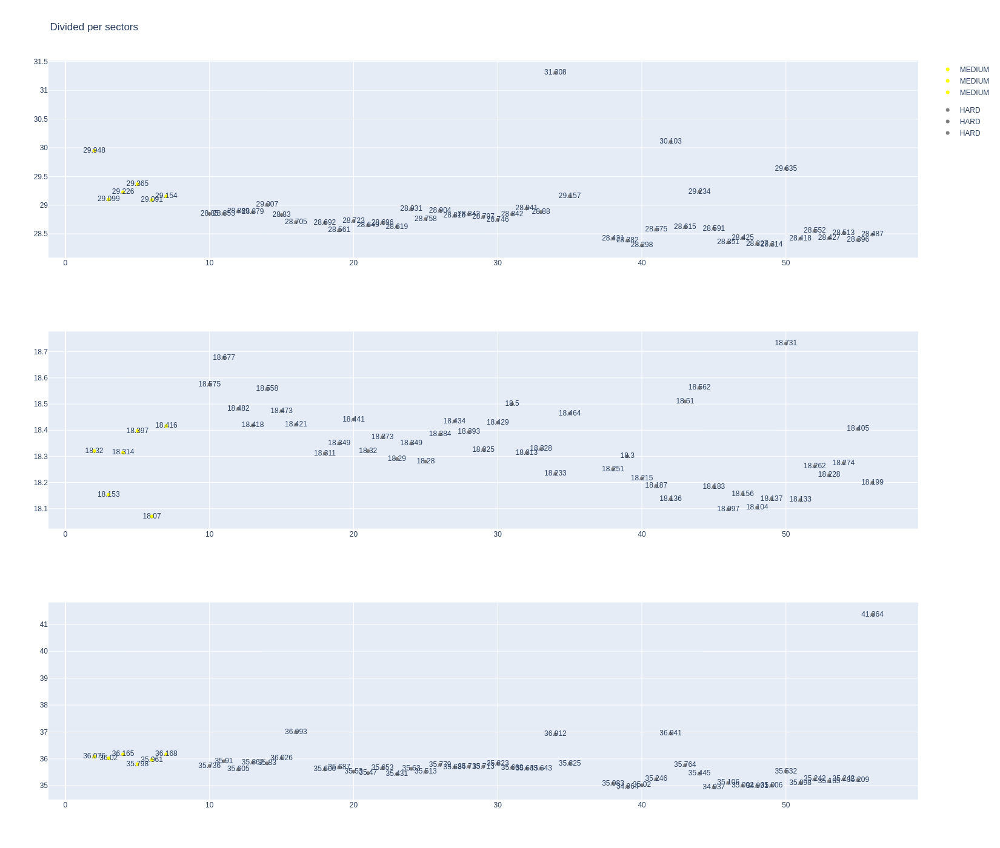

In [257]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [258]:
pit = libraryDataF1.obtain_information('pit',session_key=9472)

In [259]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<120")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration

,pit_duration
team_name,
Ferrari,24.075
Red Bull Racing,24.550
Williams,24.600
Mercedes,24.625
Aston Martin,24.675
RB,24.675
McLaren,24.775
Alpine,26.280
Haas F1 Team,27.180
